___
<img style="float: left; margin: 30px 15px 15px 15px;" src="https://upload.wikimedia.org/wikipedia/commons/d/db/Logo_ITESO_normal.jpg" width="150" height="100" />


# SEGUNDO EXAMEN PARCIAL
# MODELO NO LINEAL PARA PRONÓSTICOS

## Examen Tema 2
## Nombre: Melanie Michel Rodríguez

## Fecha: 25 de marzo del 2025

## Por: Oscar David Jaramillo Z.

# **Examen de Series de Tiempo con Redes Neuronales**

## **Instrucciones Generales**

En este examen trabajarás con dos conjuntos de datos diferentes: **univariado** y **multivariado**. Los datos univariados se encuentran en la carpeta `univariate`, y los datos multivariados en la carpeta `multivariate`.

Deberás implementar los modelos de redes neuronales **MLP**, **CNN**, **LSTM** y **CNN-LSTM** para realizar predicciones en ambos conjuntos de datos.

Deberás justificar tus decisiones y documentar adecuadamente tu código y procedimientos.



---

## **Conjunto de Datos**

### **1. Datos Univariados**

- **Archivos:**
  - `Hourly-train.csv`: Datos históricos de series de tiempo horarias del conjunto M4.
  - `m4_info.csv`: Metadatos que incluyen información como la frecuencia de medición, horizonte de predicción y fecha de inicio.
- **Descripción:**
  - Cada fila de `Hourly-train.csv` representa una serie de tiempo, y cada columna representa un paso de tiempo.
  - El archivo `m4_info.csv` contiene información adicional como:
    - **Frecuencia:** Frecuencia de las mediciones (anual, trimestral, mensual, semanal, diaria u horaria).
    - **Horizonte:** Número de pasos a predecir para cada serie.
    - **Fecha de inicio:** Fecha de la primera medición.
    -  Un ejemplo del contenido de este archivo se muestra a continuación:

| M4id   | category   |   Frequency |   Horizon | SP     | StartingDate   |
|:-------|:-----------|------------:|----------:|:-------|:---------------|
| Y1     | Macro      |           1 |         6 | Yearly | 01-01-79 12:00 |

   Lo que interpretamos como que la Serie de tiempo $Y1$ tiene una frecuencia anual entre mediciones y las mediciones empiezan el `01-01-79 12:00`. El horizonte que debe predecir esta serie de tiempo es 6 pasos al futuro.
Estos datos serán relevantes para poder generar el índice de fechas y también que cada modelo debe de generar una predicción conforme al `Horizont` especificado.
- **Series asignadas por estudiante:** Cada estudiante deberá generar predicciones para las siguientes series de datos:

| data                                     | Student                             |
|:-----------------------------------------|:------------------------------------|
| ['H115', 'H243', 'H384', 'H402', 'H44']  | MICHEL RODRIGUEZ, MELANIE           |
---


## **Tareas y Requisitos**

Realiza las siguientes tareas para cada red neuronal (MLP, CNN, LSTM y CNN-LSTM):

### **1. Análisis de Datos (20%)**

- **Carga los datos** y realiza una visualización clara de las series asignadas o los atributos del conjunto de datos.
- Realiza las transformaciones o preprocesamiento que consideres necesarios.
- Justifica tus decisiones de preprocesamiento y explica cualquier análisis relevante que realices.

### **2. División de Datos (10%)**

- Divide los datos en conjuntos de entrenamiento, validación y prueba.
- **Univariado:**
  - Crea índices de tiempo usando el archivo `m4_info.csv`.
  - Genera el horizonte de predicción basado en la columna `Horizon` asignada a cada serie.
- **Multivariado:**
  - Divide las filas en un 70%-15%-15% (entrenamiento, validación, prueba).

### **3. Creación de Modelos (30%)**

- **Diseña las redes neuronales** utilizando MLP, CNN, LSTM y CNN-LSTM:
  - Implementa al menos **tres arquitecturas diferentes** para cada modelo.
  - Selecciona la estructura que arroje mejores resultados.
- Justifica la elección de las capas ocultas, funciones de activación, optimizadores y otras configuraciones.
- Discute los resultados obtenidos y menciona posibles formas de mejorar el rendimiento.

### **4. Evaluación del Modelo (20%)**

- Evalúa los modelos en el conjunto de prueba.
- Compara los pronósticos con los valores reales:
  - Si realizaste alguna transformación en los datos (como normalización), revierte las transformaciones antes de la comparación.
- Mide la precisión del modelo utilizando métricas adecuadas como:
  - **RMSE, MAE, MAPE, o R².**

### **5. Optimización con Optuna (15%)**

- Implementa **Optuna** para ajustar los hiperparámetros del modelo:
  - Ajusta al menos los siguientes hiperparámetros:
    - Número de capas, número de unidades, tasa de aprendizaje, tipo de optimizador y funciones de activación.
  - Evalúa el modelo optimizado en el conjunto de prueba.
- Documenta los cambios en el rendimiento antes y después de la optimización.

---

## **Formato y Presentación (5%)**

1. **Estructura del Trabajo:**
   - Introducción a los datos y al modelo.
   - Explicación del preprocesamiento realizado.
   - Descripción y justificación de las arquitecturas probadas.
   - Análisis de resultados antes y después de la optimización.
2. **Código:**
   - Bien comentado y estructurado.
   - Justifica cada paso del código con explicaciones claras.
3. **Gráficos:**
   - Incluye gráficos de las series de tiempo, visualización de errores y desempeño del modelo.
4. **Conclusión:**
   - Resume tus hallazgos, dificultades encontradas y posibles mejoras.

---

**¡Éxito con tu examen!**


## Implementación de modelos

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [18]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error, mean_absolute_error, mean_absolute_percentage_error, r2_score
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Input, Dense, Dropout, Flatten, LSTM, Conv1D, MaxPooling1D, TimeDistributed, Bidirectional
from tensorflow.keras.optimizers import Adam, RMSprop
from tensorflow.keras.regularizers import l2
import tensorflow as tf
from datetime import datetime, timedelta

In [16]:
class TimeSeriesAnalyzer:
    def __init__(self, train_path, info_path):
        """
        Inicializa el analizador con las rutas de los datos.

        Parameters:
        train_path : str
            Ruta al archivo Hourly-train.csv
        info_path : str
            Ruta al archivo m4_info.csv
        """
        # Cargar datos
        self.hourly_train = pd.read_csv(train_path)
        self.m4_info = pd.read_csv(info_path)

        # Series asignadas
        self.series_ids = ['H115', 'H243', 'H384', 'H402', 'H44']

        # Preparar datos
        self.prepare_data()

        # Modelos y resultados
        self.models = {}
        self.histories = {}
        self.scalers = {}
        self.results = {}

    def prepare_data(self):
        """
        Prepara los datos para el análisis, filtrando las series asignadas y creando estructuras necesarias.
        """
        # Filtrar series asignadas
        self.series_data = self.hourly_train[self.hourly_train['V1'].isin(self.series_ids)].set_index('V1')
        self.series_info = self.m4_info[self.m4_info['M4id'].isin(self.series_ids)].set_index('M4id')

        # Convertir a formato datetime y extraer información de tiempo
        self.series_info['StartingDate'] = pd.to_datetime(self.series_info['StartingDate'], dayfirst=True)

        # Convertir a formato largo (time series)
        self.series_long = self.series_data.T
        self.series_long.columns = self.series_data.index
        self.series_long = self.series_long.drop(index=self.series_long.index[0])

        # Crear índices de tiempo para cada serie
        self.create_time_indices()

    def create_time_indices(self):
        """
        Crea índices de tiempo para cada serie basado en su fecha de inicio.
        """
        self.time_indices = {}

        for series_id in self.series_ids:
            start_date = self.series_info.loc[series_id, 'StartingDate']
            freq = 'H'  # Frecuencia horaria
            n_points = len(self.series_long[series_id].dropna())

            # Crear rango de fechas
            dates = pd.date_range(start=start_date, periods=n_points, freq=freq)
            self.time_indices[series_id] = dates

    def visualize_series(self, series_id, with_dates=True):
        """
        Visualiza una serie de tiempo específica con opción de usar fechas reales.

        Parameters:
        series_id : str
            ID de la serie a visualizar (ej. 'H115')
        with_dates : bool
            Si True, usa las fechas reales como eje x
        """
        if series_id not in self.series_ids:
            raise ValueError(f"Series ID {series_id} not in assigned series")

        plt.figure(figsize=(12, 6))

        if with_dates and series_id in self.time_indices:
            dates = self.time_indices[series_id]
            plt.plot(dates, self.series_long[series_id].dropna().values, label=series_id)
            plt.xlabel("Fecha y Hora")
        else:
            plt.plot(self.series_long[series_id].dropna().values, label=series_id)
            plt.xlabel("Pasos temporales")

        plt.title(f"Serie Temporal {series_id}")
        plt.ylabel("Valor")
        plt.legend()
        plt.grid(True)
        plt.xticks(rotation=45)
        plt.tight_layout()
        plt.show()

    def analyze_series(self, series_id):
        """
        Realiza un análisis básico de la serie temporal mostrando estadísticas descriptivas.
        """
        if series_id not in self.series_ids:
            raise ValueError(f"Series ID {series_id} not in assigned series")

        series = self.series_long[series_id].dropna()

        print(f"\nAnálisis de la serie {series_id}:")
        print("="*50)
        print(f"Longitud de la serie: {len(series)} puntos")
        print(f"Fecha de inicio: {self.time_indices[series_id][0]}")
        print(f"Fecha de fin: {self.time_indices[series_id][-1]}")
        print("\nEstadísticas descriptivas:")
        print(series.describe())

        # Visualización
        self.visualize_series(series_id)

        # Gráfico de descomposición estacional (simple)
        self.plot_seasonal_decomposition(series_id)

    def plot_seasonal_decomposition(self, series_id, period=24):
        """
        Realiza una descomposición simple de la serie temporal.
        """
        from statsmodels.tsa.seasonal import seasonal_decompose

        series = self.series_long[series_id].dropna()
        if len(series) < 2*period:
            print(f"\nNo se puede descomponer la serie {series_id}: muy corta para el periodo {period}")
            return

        try:
            result = seasonal_decompose(series, model='additive', period=period)

            plt.figure(figsize=(12, 8))
            plt.suptitle(f"Descomposición Estacional - {series_id}", y=1.02)

            ax1 = plt.subplot(411)
            ax1.plot(result.observed)
            ax1.set_ylabel('Observado')
            ax1.grid(True)

            ax2 = plt.subplot(412)
            ax2.plot(result.trend)
            ax2.set_ylabel('Tendencia')
            ax2.grid(True)

            ax3 = plt.subplot(413)
            ax3.plot(result.seasonal)
            ax3.set_ylabel('Estacionalidad')
            ax3.grid(True)

            ax4 = plt.subplot(414)
            ax4.plot(result.resid)
            ax4.set_ylabel('Residual')
            ax4.grid(True)

            plt.tight_layout()
            plt.show()
        except Exception as e:
            print(f"\nError en descomposición estacional para {series_id}: {str(e)}")

    def preprocess_series(self, series_id, n_steps=24, test_size=0.15):
        """
        Preprocesa una serie para modelado, incluyendo escalado y creación de ventanas.

        Parameters:
        series_id : str
            ID de la serie a preprocesar
        n_steps : int
            Número de pasos temporales a usar como ventana
        test_size : float
            Porcentaje de datos a usar como prueba

        Returns:
        tuple
            (X_train, y_train, X_val, y_val, X_test, y_test, scaler)
        """
        # Obtener la serie y eliminar NaNs
        series = self.series_long[series_id].dropna().values.reshape(-1, 1)

        # Escalar los datos (normalización Min-Max)
        scaler = MinMaxScaler(feature_range=(0, 1))
        scaled = scaler.fit_transform(series)

        # Crear ventanas temporales
        X, y = [], []
        for i in range(len(scaled) - n_steps):
            X.append(scaled[i:i+n_steps, 0])
            y.append(scaled[i+n_steps, 0])

        X, y = np.array(X), np.array(y)

        # Dividir en train (70%), val (15%) y test (15%)
        train_size = int(0.7 * len(X))
        val_size = int(0.15 * len(X))

        X_train, X_val, X_test = X[:train_size], X[train_size:train_size+val_size], X[train_size+val_size:]
        y_train, y_val, y_test = y[:train_size], y[train_size:train_size+val_size], y[train_size+val_size:]

        # Reshape para modelos (samples, timesteps, features)
        X_train = X_train.reshape((X_train.shape[0], X_train.shape[1], 1))
        X_val = X_val.reshape((X_val.shape[0], X_val.shape[1], 1))
        X_test = X_test.reshape((X_test.shape[0], X_test.shape[1], 1))

        return X_train, y_train, X_val, y_val, X_test, y_test, scaler

    def build_mlp_model(self, input_shape, version=1):
        """
        Construye un modelo MLP con diferentes arquitecturas.

        Parameters:
        input_shape : tuple
            Forma de los datos de entrada
        version : int
            Versión de arquitectura (1, 2 o 3)

        Returns:
        model : keras.Model
            Modelo compilado
        """
        model = Sequential()
        model.add(Input(shape=input_shape))
        model.add(Flatten())

        if version == 1:
            # Arquitectura simple
            model.add(Dense(100, activation='relu', kernel_regularizer=l2(0.01)))
            model.add(Dropout(0.2))
            model.add(Dense(50, activation='relu'))
            model.add(Dense(1))
            optimizer = Adam(learning_rate=0.001)

        elif version == 2:
            # Arquitectura más profunda
            model.add(Dense(200, activation='relu'))
            model.add(Dropout(0.3))
            model.add(Dense(100, activation='relu', kernel_regularizer=l2(0.01)))
            model.add(Dense(50, activation='relu'))
            model.add(Dense(25, activation='relu'))
            model.add(Dense(1))
            optimizer = Adam(learning_rate=0.0005)

        elif version == 3:
            # Arquitectura con regularización
            model.add(Dense(150, activation='tanh', kernel_regularizer=l2(0.02)))
            model.add(Dropout(0.4))
            model.add(Dense(75, activation='tanh'))
            model.add(Dense(25, activation='linear'))
            model.add(Dense(1))
            optimizer = RMSprop(learning_rate=0.0001)

        model.compile(optimizer=optimizer, loss='mse', metrics=['mae'])
        return model

    def build_cnn_model(self, input_shape, version=1):
        """
        Construye un modelo CNN para series de tiempo.

        Parameters:
        input_shape : tuple
            Forma de los datos de entrada
        version : int
            Versión de arquitectura (1, 2 o 3)

        Returns:
        model : keras.Model
            Modelo compilado
        """
        model = Sequential()
        model.add(Input(shape=input_shape))

        if version == 1:
            # Arquitectura básica
            model.add(Conv1D(64, 3, activation='relu', padding='same'))
            model.add(MaxPooling1D(2))
            model.add(Flatten())
            model.add(Dense(50, activation='relu'))
            model.add(Dense(1))
            optimizer = Adam(learning_rate=0.001)

        elif version == 2:
            # Arquitectura más profunda
            model.add(Conv1D(128, 5, activation='relu', padding='same'))
            model.add(MaxPooling1D(2))
            model.add(Conv1D(64, 3, activation='relu', padding='same'))
            model.add(MaxPooling1D(2))
            model.add(Flatten())
            model.add(Dense(100, activation='relu'))
            model.add(Dropout(0.3))
            model.add(Dense(50, activation='relu'))
            model.add(Dense(1))
            optimizer = Adam(learning_rate=0.0005)

        elif version == 3:
            # Arquitectura con dilatación
            model.add(Conv1D(64, 3, activation='relu', dilation_rate=2, padding='causal'))
            model.add(MaxPooling1D(2))
            model.add(Conv1D(128, 3, activation='relu', padding='same'))
            model.add(MaxPooling1D(2))
            model.add(Flatten())
            model.add(Dense(100, activation='relu', kernel_regularizer=l2(0.01)))
            model.add(Dropout(0.4))
            model.add(Dense(1))
            optimizer = RMSprop(learning_rate=0.0001)

        model.compile(optimizer=optimizer, loss='mse', metrics=['mae'])
        return model

    def build_lstm_model(self, input_shape, version=1):
        """
        Construye un modelo LSTM para series de tiempo.

        Parameters:
        input_shape : tuple
            Forma de los datos de entrada
        version : int
            Versión de arquitectura (1, 2 o 3)

        Returns:
        model : keras.Model
            Modelo compilado
        """
        model = Sequential()
        model.add(Input(shape=input_shape))

        if version == 1:
            # Arquitectura simple
            model.add(LSTM(50, activation='tanh'))
            model.add(Dense(1))
            optimizer = RMSprop(learning_rate=0.001)

        elif version == 2:
            # Arquitectura apilada
            model.add(LSTM(100, activation='tanh', return_sequences=True))
            model.add(LSTM(50, activation='tanh'))
            model.add(Dense(25, activation='relu'))
            model.add(Dense(1))
            optimizer = Adam(learning_rate=0.0005)

        elif version == 3:
            # Arquitectura bidireccional con regularización
            model.add(Bidirectional(LSTM(64, activation='tanh', return_sequences=True)))
            model.add(Dropout(0.3))
            model.add(Bidirectional(LSTM(32, activation='tanh')))
            model.add(Dense(16, activation='relu', kernel_regularizer=l2(0.01)))
            model.add(Dense(1))
            optimizer = Adam(learning_rate=0.0001)

        model.compile(optimizer=optimizer, loss='mse', metrics=['mae'])
        return model

    def build_cnn_lstm_model(self, input_shape, version=1):
        """
        Construye un modelo CNN-LSTM híbrido para series de tiempo.

        Parameters:
        input_shape : tuple
            Forma de los datos de entrada
        version : int
            Versión de arquitectura (1, 2 o 3)

        Returns:
        model : keras.Model
            Modelo compilado
        """
        model = Sequential()
        model.add(Input(shape=input_shape))

        if version == 1:
            # Arquitectura básica
            model.add(Conv1D(64, 3, activation='relu'))
            model.add(MaxPooling1D(2))
            model.add(LSTM(50, activation='tanh'))
            model.add(Dense(1))
            optimizer = RMSprop(learning_rate=0.001)

        elif version == 2:
            # Arquitectura más compleja
            model.add(Conv1D(128, 5, activation='relu', padding='same'))
            model.add(MaxPooling1D(2))
            model.add(Conv1D(64, 3, activation='relu'))
            model.add(MaxPooling1D(2))
            model.add(LSTM(100, activation='tanh', return_sequences=True))
            model.add(LSTM(50, activation='tanh'))
            model.add(Dense(25, activation='relu'))
            model.add(Dense(1))
            optimizer = Adam(learning_rate=0.0005)

        elif version == 3:
            # Arquitectura con TimeDistributed
            model.add(Conv1D(128, 5, activation='relu', padding='same'))
            model.add(MaxPooling1D(2))
            model.add(Conv1D(64, 3, activation='relu', padding='same'))  # Added padding='same'
            model.add(MaxPooling1D(2))
            model.add(LSTM(100, activation='tanh', return_sequences=True))
            model.add(LSTM(50, activation='tanh'))
            model.add(Dropout(0.2))  # Added Dropout for regularization
            model.add(Dense(25, activation='relu'))
            model.add(Dense(1))
            optimizer = Adam(learning_rate=0.0005)

        model.compile(optimizer=optimizer, loss='mse', metrics=['mae'])
        return model

    def train_model(self, model, X_train, y_train, X_val, y_val, epochs=100, batch_size=32, verbose=1):
        """
        Entrena un modelo y devuelve su historial.

        Parameters:
        model : keras.Model
            Modelo a entrenar
        X_train : np.array
            Datos de entrenamiento
        y_train : np.array
            Etiquetas de entrenamiento
        X_val : np.array
            Datos de validación
        y_val : np.array
            Etiquetas de validación
        epochs : int
            Número de épocas
        batch_size : int
            Tamaño del batch
        verbose : int
            Verbosidad

        Returns:
        history : keras.History
            Historial de entrenamiento
        """
        early_stopping = tf.keras.callbacks.EarlyStopping(
            monitor='val_loss',
            patience=15,
            restore_best_weights=True,
            verbose=1
        )

        reduce_lr = tf.keras.callbacks.ReduceLROnPlateau(
            monitor='val_loss',
            factor=0.2,
            patience=5,
            min_lr=1e-6,
            verbose=1
        )

        history = model.fit(
            X_train, y_train,
            validation_data=(X_val, y_val),
            epochs=epochs,
            batch_size=batch_size,
            callbacks=[early_stopping, reduce_lr],
            verbose=verbose
        )
        return history

    def evaluate_model(self, model, X_test, y_test, scaler, series_id, model_name):
        """
        Evalúa un modelo en los datos de prueba y muestra métricas.

        Parameters:
        model : keras.Model
            Modelo a evaluar
        X_test : np.array
            Datos de prueba
        y_test : np.array
            Etiquetas de prueba
        scaler : sklearn scaler
            Escalador para invertir la transformación
        series_id : str
            ID de la serie
        model_name : str
            Nombre del modelo

        Returns:
        dict
            Diccionario con las métricas calculadas
        """
        # Predecir
        y_pred = model.predict(X_test)

        # Invertir escalado
        y_test_inv = scaler.inverse_transform(y_test.reshape(-1, 1))
        y_pred_inv = scaler.inverse_transform(y_pred.reshape(-1, 1))

        # Calcular métricas
        mse = mean_squared_error(y_test_inv, y_pred_inv)
        rmse = np.sqrt(mse)
        mae = mean_absolute_error(y_test_inv, y_pred_inv)
        mape = mean_absolute_percentage_error(y_test_inv, y_pred_inv)
        r2 = r2_score(y_test_inv, y_pred_inv)

        # Mostrar resultados
        print(f"\nEvaluación para serie {series_id} - Modelo {model_name}:")
        print("="*60)
        print(f"RMSE: {rmse:.4f}")
        print(f"MAE: {mae:.4f}")
        print(f"MAPE: {mape:.4f}%")
        print(f"R²: {r2:.4f}")

        # Graficar
        plt.figure(figsize=(14, 6))
        plt.plot(y_test_inv, label='Valores Reales', color='blue', alpha=0.7)
        plt.plot(y_pred_inv, label='Predicciones', color='red', alpha=0.7, linestyle='--')
        plt.title(f"Predicciones vs Valores Reales\nSerie {series_id} - Modelo {model_name}", pad=20)
        plt.xlabel("Tiempo")
        plt.ylabel("Valor")
        plt.legend()
        plt.grid(True)
        plt.tight_layout()
        plt.show()

        return {
            'rmse': rmse,
            'mae': mae,
            'mape': mape,
            'r2': r2,
            'y_test': y_test_inv,
            'y_pred': y_pred_inv
        }

    def train_and_evaluate_models(self, series_id, n_steps=24, epochs=100, batch_size=32):
        """
        Entrena y evalúa todos los modelos para una serie específica.

        Parameters:
        series_id : str
            ID de la serie a analizar
        n_steps : int
            Número de pasos temporales a usar como ventana
        epochs : int
            Número de épocas para entrenamiento
        batch_size : int
            Tamaño del batch

        Returns:
        dict
            Resultados de todos los modelos para la serie
        """
        print(f"\n{'='*60}")
        print(f"ENTRENANDO MODELOS PARA SERIE {series_id}")
        print(f"{'='*60}\n")

        # 1. Preparación de datos
        X_train, y_train, X_val, y_val, X_test, y_test, scaler = self.preprocess_series(
            series_id, n_steps=n_steps)

        # Diccionario para resultados
        results = {}

        # 2. Modelos a probar
        models_config = {
            'MLP': {'builder': self.build_mlp_model, 'versions': [1, 2, 3]},
            'CNN': {'builder': self.build_cnn_model, 'versions': [1, 2, 3]},
            'LSTM': {'builder': self.build_lstm_model, 'versions': [1, 2, 3]},
            'CNN-LSTM': {'builder': self.build_cnn_lstm_model, 'versions': [1, 2, 3]}
        }

        for model_name, config in models_config.items():
            print(f"\n{'='*40}")
            print(f"PROBANDO MODELOS {model_name}")
            print(f"{'='*40}")

            model_results = {}
            best_score = float('inf')
            best_model = None

            for version in config['versions']:
                print(f"\nVersión {version} de {model_name}")

                # Construir modelo
                model = config['builder'](X_train.shape[1:], version=version)

                # Entrenar modelo
                history = self.train_model(
                    model, X_train, y_train, X_val, y_val,
                    epochs=epochs, batch_size=batch_size, verbose=1
                )

                # Evaluar modelo
                eval_results = self.evaluate_model(
                    model, X_test, y_test, scaler, series_id, f"{model_name}-V{version}")

                # Guardar resultados
                model_results[version] = {
                    'model': model,
                    'history': history,
                    'metrics': eval_results
                }

                # Actualizar mejor modelo
                if eval_results['rmse'] < best_score:
                    best_score = eval_results['rmse']
                    best_model = version

            # Guardar el mejor modelo de este tipo
            results[model_name] = {
                'all_versions': model_results,
                'best_version': best_model,
                'best_metrics': model_results[best_model]['metrics']
            }

        # Guardar todo para esta serie
        self.models[series_id] = results
        self.results[series_id] = results

        return results

    def run_all_series(self, n_steps=24, epochs=100, batch_size=32):
        """
        Ejecuta el entrenamiento y evaluación para todas las series asignadas.

        Parameters:
        n_steps : int
            Número de pasos temporales a usar como ventana
        epochs : int
            Número de épocas para entrenamiento
        batch_size : int
            Tamaño del batch

        Returns:
        dict
            Resultados completos para todas las series
        """
        all_results = {}

        for series_id in self.series_ids:
            # Análisis inicial de la serie
            self.analyze_series(series_id)

            # Entrenar y evaluar modelos
            results = self.train_and_evaluate_models(
                series_id, n_steps=n_steps, epochs=epochs, batch_size=batch_size)

            all_results[series_id] = results

            # Guardar el mejor modelo global para esta serie
            best_model_type = None
            best_rmse = float('inf')

            for model_type, data in results.items():
                if data['best_metrics']['rmse'] < best_rmse:
                    best_rmse = data['best_metrics']['rmse']
                    best_model_type = model_type

            print(f"\n{'='*60}")
            print(f"MEJOR MODELO PARA SERIE {series_id}: {best_model_type}")
            print(f"RMSE: {best_rmse:.4f}")
            print(f"{'='*60}\n")

        return all_results

    def compare_models_across_series(self):
        """
        Compara el rendimiento de los modelos a través de todas las series.
        """
        if not self.results:
            print("No hay resultados para comparar. Ejecuta run_all_series() primero.")
            return

        # Preparar datos para comparación
        comparison_data = []

        for series_id, series_results in self.results.items():
            for model_type, model_data in series_results.items():
                best_version = model_data['best_version']
                metrics = model_data['all_versions'][best_version]['metrics']

                comparison_data.append({
                    'Series': series_id,
                    'Modelo': f"{model_type}-V{best_version}",
                    'RMSE': metrics['rmse'],
                    'MAE': metrics['mae'],
                    'MAPE': metrics['mape'],
                    'R2': metrics['r2']
                })

        # Crear DataFrame de comparación
        comparison_df = pd.DataFrame(comparison_data)

        # Mostrar tabla de comparación
        print("\nComparación de Modelos entre Series:")
        print("="*80)
        print(comparison_df.to_string(index=False))

        # Gráfico de comparación de RMSE
        plt.figure(figsize=(14, 8))
        pivot_df = comparison_df.pivot(index='Series', columns='Modelo', values='RMSE')
        pivot_df.plot(kind='bar', figsize=(14, 8), colormap='viridis')
        plt.title('Comparación de RMSE entre Modelos y Series')
        plt.ylabel('RMSE')
        plt.xticks(rotation=45)
        plt.legend(title='Modelo', bbox_to_anchor=(1.05, 1), loc='upper left')
        plt.tight_layout()
        plt.show()

        return comparison_df

<ipython-input-16-a48023748af3>:49: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  self.series_info['StartingDate'] = pd.to_datetime(self.series_info['StartingDate'], dayfirst=True)
<ipython-input-16-a48023748af3>:71: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  dates = pd.date_range(start=start_date, periods=n_points, freq=freq)



Análisis de la serie H115:
Longitud de la serie: 699 puntos
Fecha de inicio: 2015-07-01 12:00:00
Fecha de fin: 2015-07-30 14:00:00

Estadísticas descriptivas:
count    699.000000
mean     380.947067
std       80.009930
min      245.000000
25%      309.000000
50%      369.000000
75%      447.000000
max      581.000000
Name: H115, dtype: float64


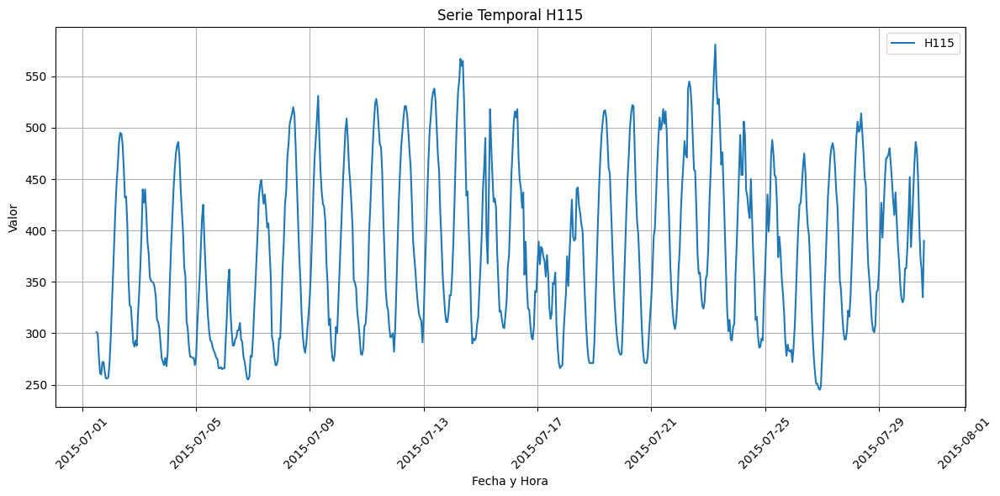

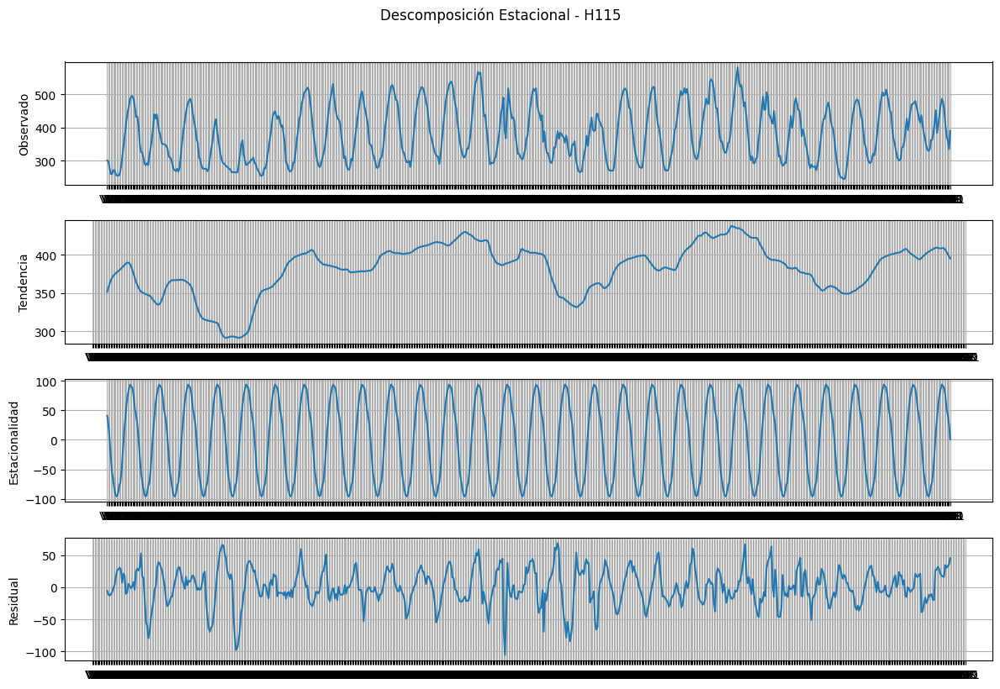


ENTRENANDO MODELOS PARA SERIE H115


PROBANDO MODELOS MLP

Versión 1 de MLP
Epoch 1/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 3s 96ms/step - loss: 0.6195 - mae: 0.3817 - val_loss: 0.4146 - val_mae: 0.2113 - learning_rate: 0.0010
Epoch 2/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.3900 - mae: 0.1774 - val_loss: 0.3330 - val_mae: 0.1024 - learning_rate: 0.0010
Epoch 3/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.3306 - mae: 0.1181 - val_loss: 0.2908 - val_mae: 0.0716 - learning_rate: 0.0010
Epoch 4/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.2895 - mae: 0.0938 - val_loss: 0.2580 - val_mae: 0.0646 - learning_rate: 0.0010
Epoch 5/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.2560 - mae: 0.0848 - val_loss: 0.2287 - val_mae: 0.0584 - learning_rate: 0.0010
Epoch 6/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.2263 - mae: 0.0753 - val_loss: 0.2031 - val_mae: 0.0573 - learning_rate: 0.0010
Epoch 7/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.2034 - mae: 0.0

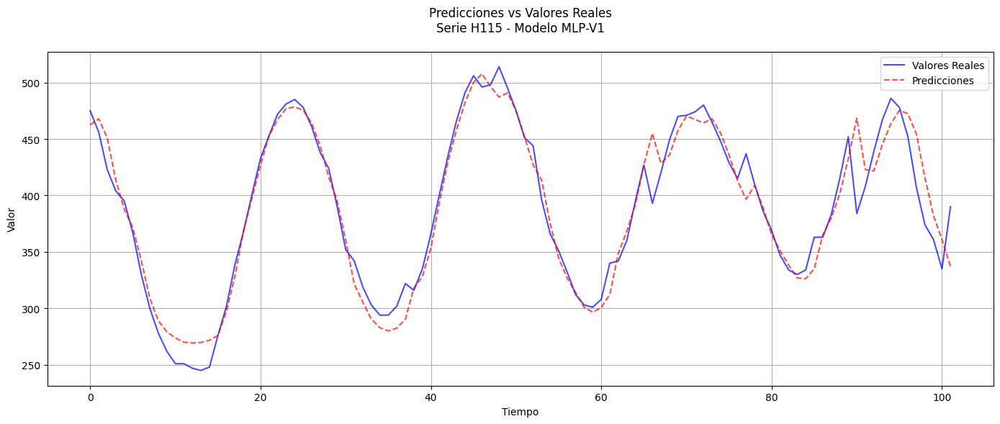


Versión 2 de MLP
Epoch 1/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 5s 163ms/step - loss: 1.3652 - mae: 0.2122 - val_loss: 1.1794 - val_mae: 0.0888 - learning_rate: 5.0000e-04
Epoch 2/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 1.1467 - mae: 0.1110 - val_loss: 1.0156 - val_mae: 0.0713 - learning_rate: 5.0000e-04
Epoch 3/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.9838 - mae: 0.0846 - val_loss: 0.8710 - val_mae: 0.0693 - learning_rate: 5.0000e-04
Epoch 4/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.8429 - mae: 0.0824 - val_loss: 0.7435 - val_mae: 0.0606 - learning_rate: 5.0000e-04
Epoch 5/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.7198 - mae: 0.0771 - val_loss: 0.6394 - val_mae: 0.0879 - learning_rate: 5.0000e-04
Epoch 6/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.6138 - mae: 0.0729 - val_loss: 0.5395 - val_mae: 0.0603 - learning_rate: 5.0000e-04
Epoch 7/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.5217 - mae: 0.0746 - val_loss: 0.4573 - val_mae: 

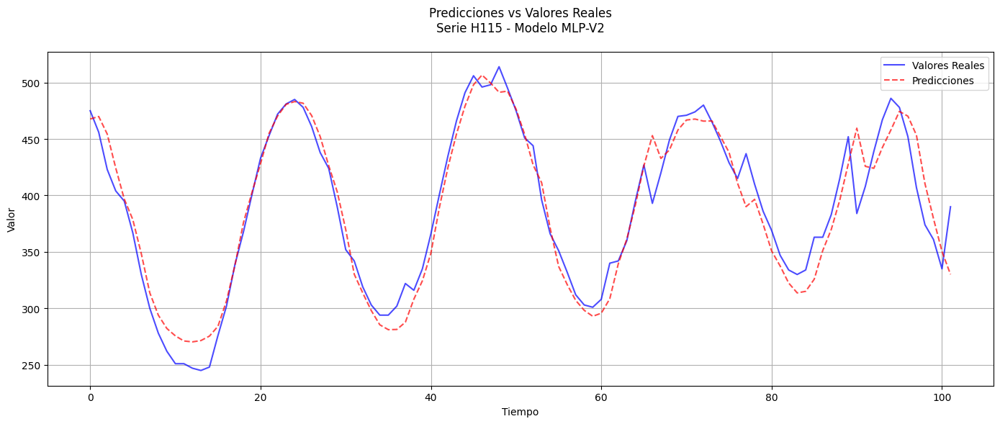


Versión 3 de MLP
Epoch 1/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 4s 142ms/step - loss: 1.0425 - mae: 0.3650 - val_loss: 0.8388 - val_mae: 0.1003 - learning_rate: 1.0000e-04
Epoch 2/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.9978 - mae: 0.3299 - val_loss: 0.8249 - val_mae: 0.0848 - learning_rate: 1.0000e-04
Epoch 3/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.9424 - mae: 0.2911 - val_loss: 0.8129 - val_mae: 0.0751 - learning_rate: 1.0000e-04
Epoch 4/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.9107 - mae: 0.2674 - val_loss: 0.8037 - val_mae: 0.0824 - learning_rate: 1.0000e-04
Epoch 5/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.8930 - mae: 0.2555 - val_loss: 0.7895 - val_mae: 0.0694 - learning_rate: 1.0000e-04
Epoch 6/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.8670 - mae: 0.2335 - val_loss: 0.7788 - val_mae: 0.0740 - learning_rate: 1.0000e-04
Epoch 7/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.8462 - mae: 0.2207 - val_loss: 0.7651 - val_mae: 

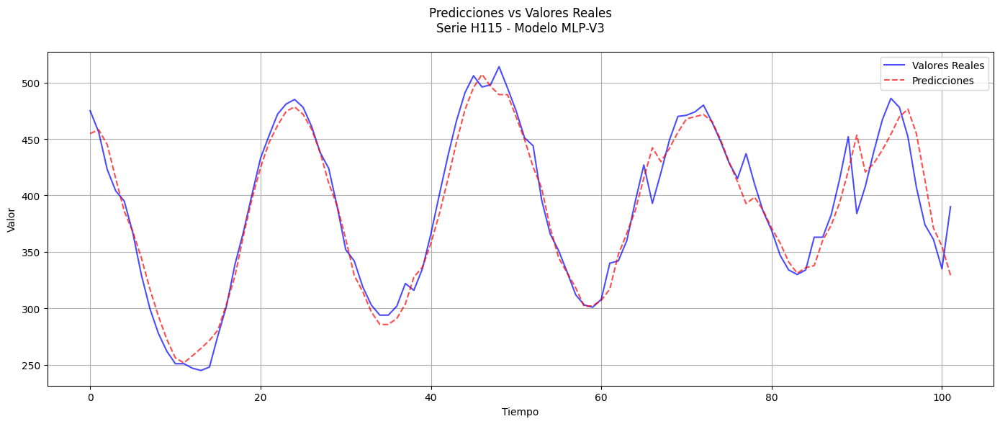


PROBANDO MODELOS CNN

Versión 1 de CNN
Epoch 1/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 2s 61ms/step - loss: 0.0931 - mae: 0.2378 - val_loss: 0.0205 - val_mae: 0.1204 - learning_rate: 0.0010
Epoch 2/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0169 - mae: 0.1078 - val_loss: 0.0069 - val_mae: 0.0635 - learning_rate: 0.0010
Epoch 3/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0076 - mae: 0.0637 - val_loss: 0.0050 - val_mae: 0.0546 - learning_rate: 0.0010
Epoch 4/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0064 - mae: 0.0590 - val_loss: 0.0044 - val_mae: 0.0515 - learning_rate: 0.0010
Epoch 5/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0054 - mae: 0.0549 - val_loss: 0.0045 - val_mae: 0.0504 - learning_rate: 0.0010
Epoch 6/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0056 - mae: 0.0528 - val_loss: 0.0039 - val_mae: 0.0473 - learning_rate: 0.0010
Epoch 7/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0047 - mae: 0.0503 - val_loss: 0.0037 - val_mae: 0.0

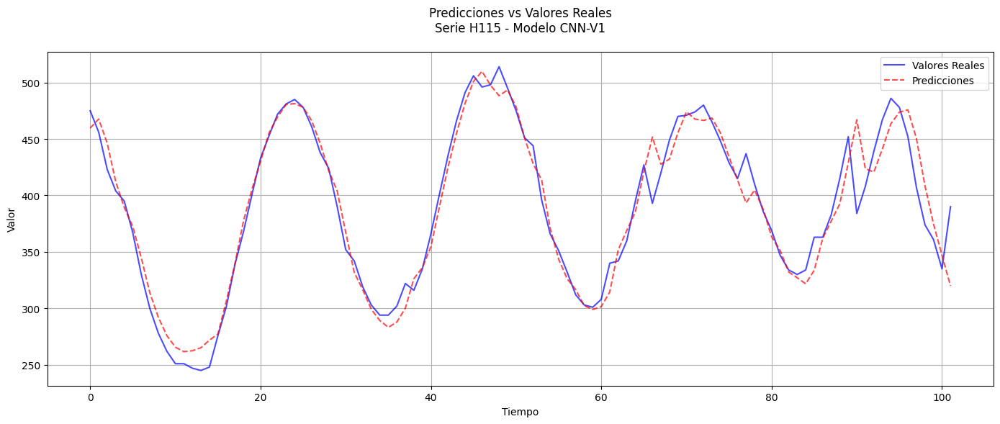


Versión 2 de CNN
Epoch 1/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 4s 119ms/step - loss: 0.1302 - mae: 0.2902 - val_loss: 0.0403 - val_mae: 0.1662 - learning_rate: 5.0000e-04
Epoch 2/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0382 - mae: 0.1645 - val_loss: 0.0092 - val_mae: 0.0779 - learning_rate: 5.0000e-04
Epoch 3/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0148 - mae: 0.0982 - val_loss: 0.0075 - val_mae: 0.0701 - learning_rate: 5.0000e-04
Epoch 4/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0123 - mae: 0.0832 - val_loss: 0.0051 - val_mae: 0.0560 - learning_rate: 5.0000e-04
Epoch 5/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0105 - mae: 0.0786 - val_loss: 0.0054 - val_mae: 0.0574 - learning_rate: 5.0000e-04
Epoch 6/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0087 - mae: 0.0693 - val_loss: 0.0043 - val_mae: 0.0509 - learning_rate: 5.0000e-04
Epoch 7/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0082 - mae: 0.0655 - val_loss: 0.0050 - val_mae: 

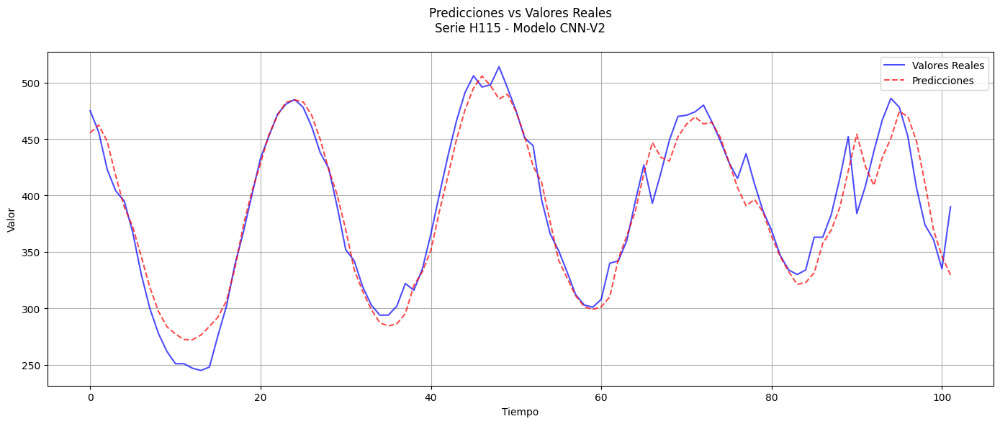


Versión 3 de CNN
Epoch 1/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 3s 106ms/step - loss: 1.9116 - mae: 0.3233 - val_loss: 1.7451 - val_mae: 0.2211 - learning_rate: 1.0000e-04
Epoch 2/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 1.7135 - mae: 0.1925 - val_loss: 1.6306 - val_mae: 0.1631 - learning_rate: 1.0000e-04
Epoch 3/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 1.6193 - mae: 0.1713 - val_loss: 1.5445 - val_mae: 0.1336 - learning_rate: 1.0000e-04
Epoch 4/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 1.5336 - mae: 0.1440 - val_loss: 1.4635 - val_mae: 0.1145 - learning_rate: 1.0000e-04
Epoch 5/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 1.4566 - mae: 0.1421 - val_loss: 1.3873 - val_mae: 0.1008 - learning_rate: 1.0000e-04
Epoch 6/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 1.3835 - mae: 0.1343 - val_loss: 1.3146 - val_mae: 0.0877 - learning_rate: 1.0000e-04
Epoch 7/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 1.3102 - mae: 0.1251 - val_loss: 1.2456 - val_mae: 

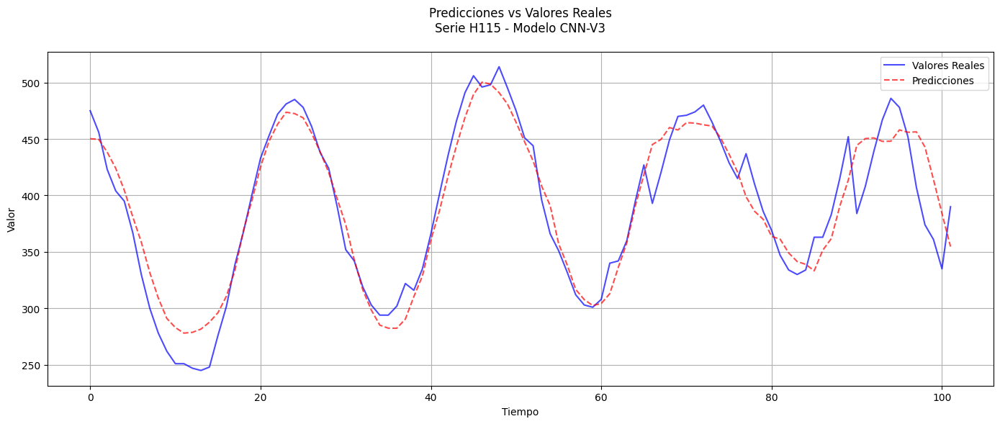


PROBANDO MODELOS LSTM

Versión 1 de LSTM
Epoch 1/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.1091 - mae: 0.2661 - val_loss: 0.0543 - val_mae: 0.2021 - learning_rate: 0.0010
Epoch 2/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0492 - mae: 0.1919 - val_loss: 0.0440 - val_mae: 0.1833 - learning_rate: 0.0010
Epoch 3/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0426 - mae: 0.1811 - val_loss: 0.0362 - val_mae: 0.1657 - learning_rate: 0.0010
Epoch 4/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0326 - mae: 0.1569 - val_loss: 0.0291 - val_mae: 0.1465 - learning_rate: 0.0010
Epoch 5/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0246 - mae: 0.1346 - val_loss: 0.0233 - val_mae: 0.1256 - learning_rate: 0.0010
Epoch 6/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0189 - mae: 0.1168 - val_loss: 0.0146 - val_mae: 0.0937 - learning_rate: 0.0010
Epoch 7/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0109 - mae: 0.0846 - val_loss: 0.0059 - val_mae: 0

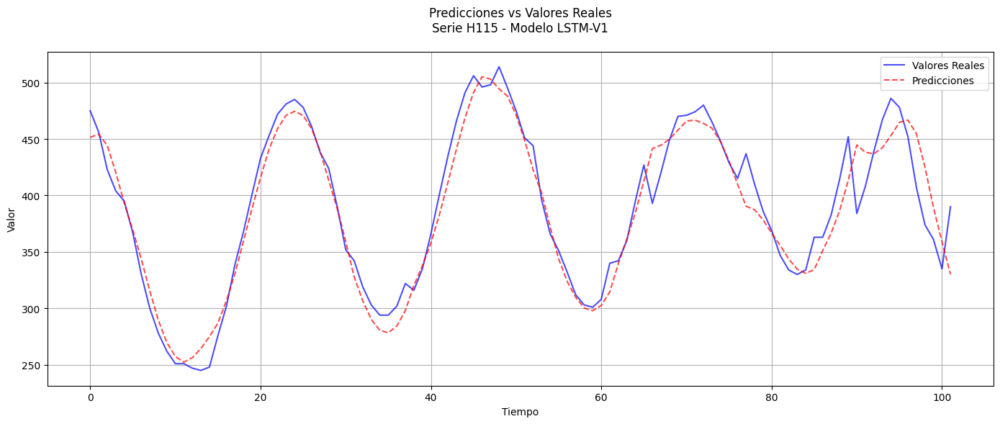


Versión 2 de LSTM
Epoch 1/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.1204 - mae: 0.2732 - val_loss: 0.0620 - val_mae: 0.2197 - learning_rate: 5.0000e-04
Epoch 2/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0583 - mae: 0.2040 - val_loss: 0.0555 - val_mae: 0.2075 - learning_rate: 5.0000e-04
Epoch 3/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0550 - mae: 0.2063 - val_loss: 0.0555 - val_mae: 0.2005 - learning_rate: 5.0000e-04
Epoch 4/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0428 - mae: 0.1777 - val_loss: 0.0411 - val_mae: 0.1755 - learning_rate: 5.0000e-04
Epoch 5/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.0400 - mae: 0.1753 - val_loss: 0.0262 - val_mae: 0.1344 - learning_rate: 5.0000e-04
Epoch 6/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0238 - mae: 0.1328 - val_loss: 0.0104 - val_mae: 0.0834 - learning_rate: 5.0000e-04
Epoch 7/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.0151 - mae: 0.0962 - val_loss: 0.0090 - val

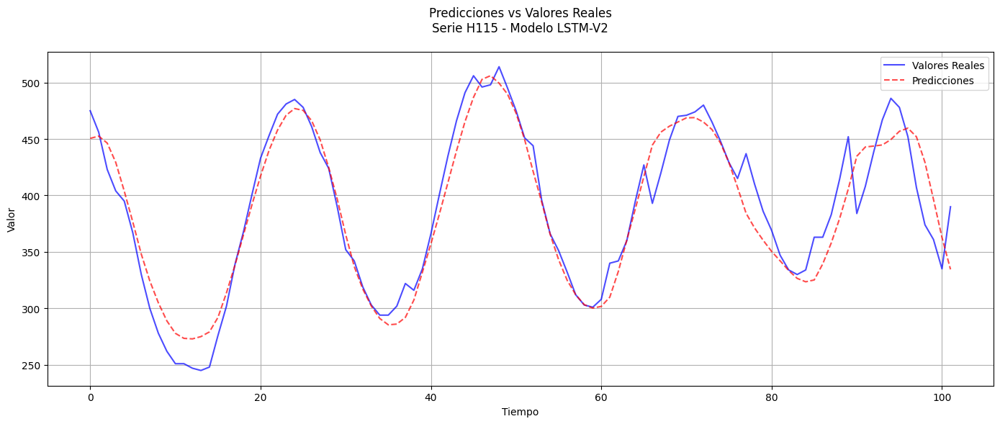


Versión 3 de LSTM
Epoch 1/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 4s 51ms/step - loss: 0.4225 - mae: 0.3570 - val_loss: 0.4190 - val_mae: 0.3559 - learning_rate: 1.0000e-04
Epoch 2/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.3685 - mae: 0.2836 - val_loss: 0.3555 - val_mae: 0.2793 - learning_rate: 1.0000e-04
Epoch 3/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.3237 - mae: 0.2278 - val_loss: 0.3049 - val_mae: 0.2248 - learning_rate: 1.0000e-04
Epoch 4/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.2943 - mae: 0.2016 - val_loss: 0.2803 - val_mae: 0.2017 - learning_rate: 1.0000e-04
Epoch 5/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.2775 - mae: 0.1920 - val_loss: 0.2740 - val_mae: 0.1949 - learning_rate: 1.0000e-04
Epoch 6/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.2723 - mae: 0.1922 - val_loss: 0.2682 - val_mae: 0.1915 - learning_rate: 1.0000e-04
Epoch 7/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.2664 - mae: 0.1857 - val_loss: 0.2624 - val

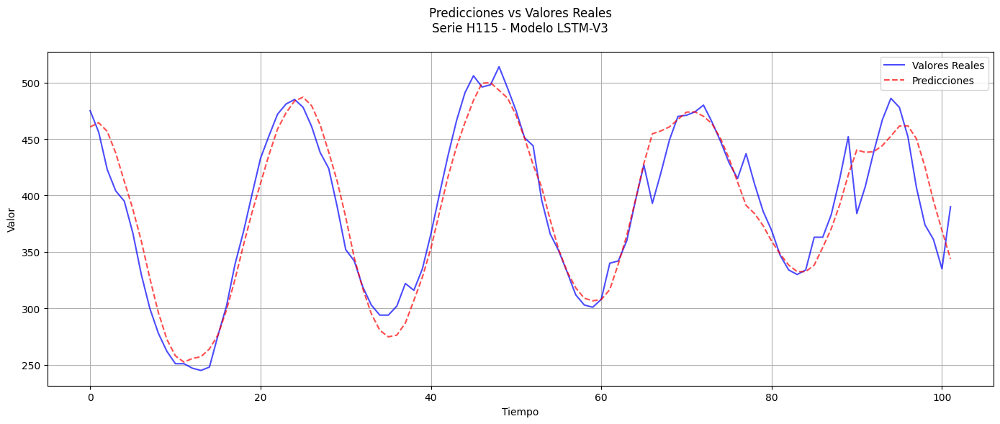


PROBANDO MODELOS CNN-LSTM

Versión 1 de CNN-LSTM
Epoch 1/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - loss: 0.0969 - mae: 0.2431 - val_loss: 0.0486 - val_mae: 0.1936 - learning_rate: 0.0010
Epoch 2/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.0481 - mae: 0.1912 - val_loss: 0.0454 - val_mae: 0.1813 - learning_rate: 0.0010
Epoch 3/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.0362 - mae: 0.1639 - val_loss: 0.0334 - val_mae: 0.1548 - learning_rate: 0.0010
Epoch 4/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0276 - mae: 0.1414 - val_loss: 0.0211 - val_mae: 0.1206 - learning_rate: 0.0010
Epoch 5/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0186 - mae: 0.1170 - val_loss: 0.0108 - val_mae: 0.0881 - learning_rate: 0.0010
Epoch 6/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0115 - mae: 0.0875 - val_loss: 0.0068 - val_mae: 0.0687 - learning_rate: 0.0010
Epoch 7/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0077 - mae: 0.0705 - val_loss: 0.0075 - 

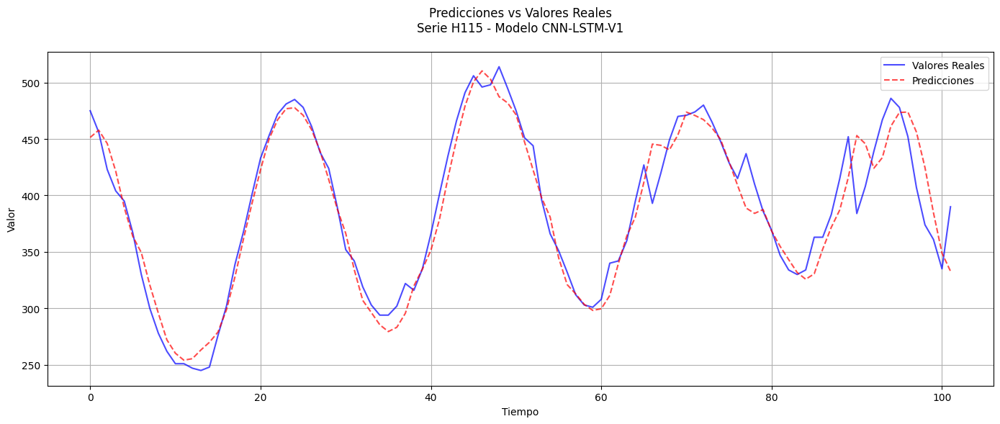


Versión 2 de CNN-LSTM
Epoch 1/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 3s 39ms/step - loss: 0.1752 - mae: 0.3458 - val_loss: 0.0633 - val_mae: 0.2219 - learning_rate: 5.0000e-04
Epoch 2/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0664 - mae: 0.2243 - val_loss: 0.0671 - val_mae: 0.2235 - learning_rate: 5.0000e-04
Epoch 3/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0570 - mae: 0.2030 - val_loss: 0.0573 - val_mae: 0.2090 - learning_rate: 5.0000e-04
Epoch 4/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0595 - mae: 0.2148 - val_loss: 0.0587 - val_mae: 0.2084 - learning_rate: 5.0000e-04
Epoch 5/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0528 - mae: 0.1994 - val_loss: 0.0481 - val_mae: 0.1894 - learning_rate: 5.0000e-04
Epoch 6/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0472 - mae: 0.1889 - val_loss: 0.0368 - val_mae: 0.1612 - learning_rate: 5.0000e-04
Epoch 7/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0360 - mae: 0.1642 - val_loss: 0.0204 -

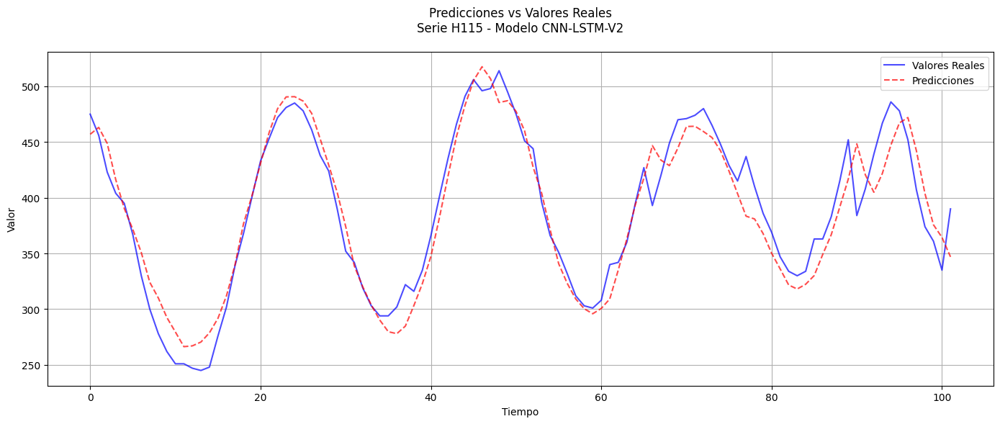


Versión 3 de CNN-LSTM
Epoch 1/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 3s 41ms/step - loss: 0.1567 - mae: 0.3213 - val_loss: 0.0703 - val_mae: 0.2174 - learning_rate: 5.0000e-04
Epoch 2/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.0615 - mae: 0.2141 - val_loss: 0.0628 - val_mae: 0.2158 - learning_rate: 5.0000e-04
Epoch 3/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.0569 - mae: 0.2036 - val_loss: 0.0524 - val_mae: 0.1998 - learning_rate: 5.0000e-04
Epoch 4/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.0515 - mae: 0.1943 - val_loss: 0.0493 - val_mae: 0.1935 - learning_rate: 5.0000e-04
Epoch 5/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0512 - mae: 0.1972 - val_loss: 0.0447 - val_mae: 0.1822 - learning_rate: 5.0000e-04
Epoch 6/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.0426 - mae: 0.1765 - val_loss: 0.0335 - val_mae: 0.1544 - learning_rate: 5.0000e-04
Epoch 7/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.0376 - mae: 0.1699 - val_loss: 0.0188 -

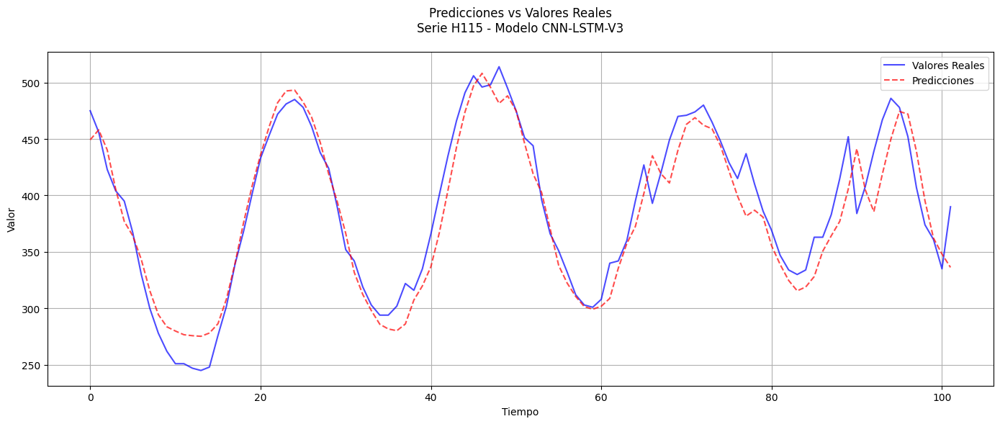


MEJOR MODELO PARA SERIE H115: MLP
RMSE: 17.4784


Análisis de la serie H243:
Longitud de la serie: 959 puntos
Fecha de inicio: 2010-05-06 12:00:00
Fecha de fin: 2010-06-15 10:00:00

Estadísticas descriptivas:
count    959.000000
mean      17.856726
std        3.883560
min       10.100000
25%       14.800000
50%       17.900000
75%       20.700000
max       25.900000
Name: H243, dtype: float64


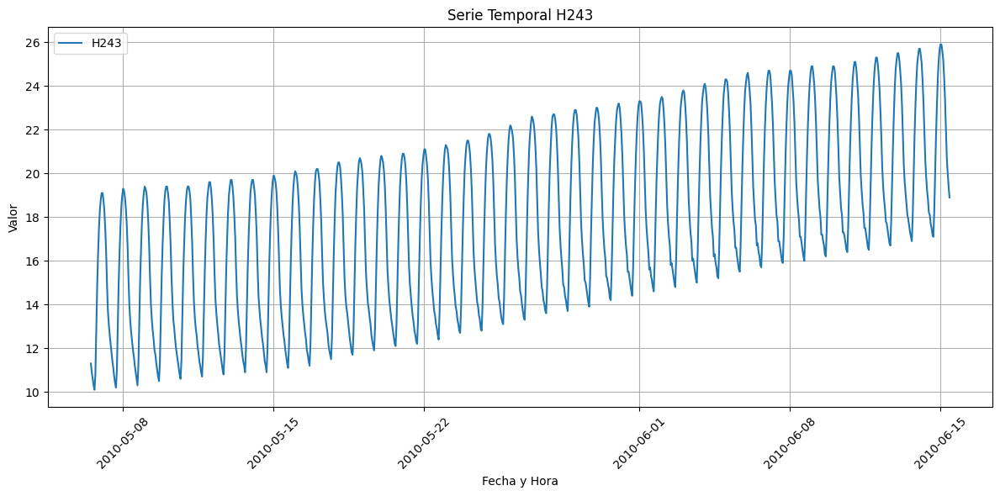

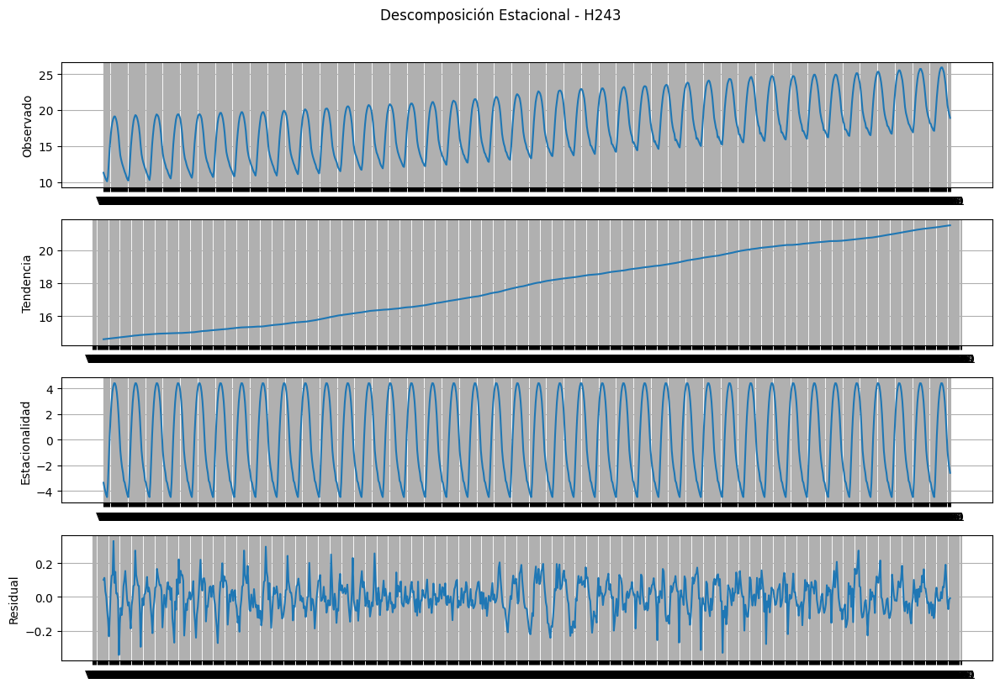


ENTRENANDO MODELOS PARA SERIE H243


PROBANDO MODELOS MLP

Versión 1 de MLP
Epoch 1/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.5161 - mae: 0.2977 - val_loss: 0.3621 - val_mae: 0.1735 - learning_rate: 0.0010
Epoch 2/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.3363 - mae: 0.1004 - val_loss: 0.2870 - val_mae: 0.0446 - learning_rate: 0.0010
Epoch 3/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.2801 - mae: 0.0688 - val_loss: 0.2424 - val_mae: 0.0379 - learning_rate: 0.0010
Epoch 4/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.2368 - mae: 0.0615 - val_loss: 0.2075 - val_mae: 0.0614 - learning_rate: 0.0010
Epoch 5/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.2002 - mae: 0.0570 - val_loss: 0.1771 - val_mae: 0.0733 - learning_rate: 0.0010
Epoch 6/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.1688 - mae: 0.0528 - val_loss: 0.1467 - val_mae: 0.0438 - learning_rate: 0.0010
Epoch 7/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.1421 - mae: 0.0

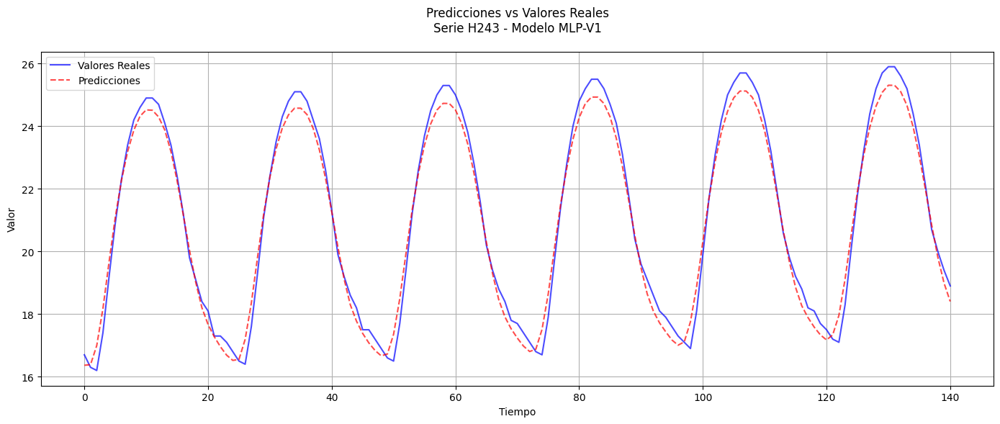


Versión 2 de MLP
Epoch 1/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 5s 111ms/step - loss: 1.5047 - mae: 0.4081 - val_loss: 1.1564 - val_mae: 0.1898 - learning_rate: 5.0000e-04
Epoch 2/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 1.1019 - mae: 0.1719 - val_loss: 0.9292 - val_mae: 0.0963 - learning_rate: 5.0000e-04
Epoch 3/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.8812 - mae: 0.0743 - val_loss: 0.7560 - val_mae: 0.0797 - learning_rate: 5.0000e-04
Epoch 4/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.7154 - mae: 0.0596 - val_loss: 0.6109 - val_mae: 0.0792 - learning_rate: 5.0000e-04
Epoch 5/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.5783 - mae: 0.0576 - val_loss: 0.4918 - val_mae: 0.0673 - learning_rate: 5.0000e-04
Epoch 6/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.4654 - mae: 0.0519 - val_loss: 0.3937 - val_mae: 0.0500 - learning_rate: 5.0000e-04
Epoch 7/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.3739 - mae: 0.0508 - val_loss: 0.3180 - val_mae: 

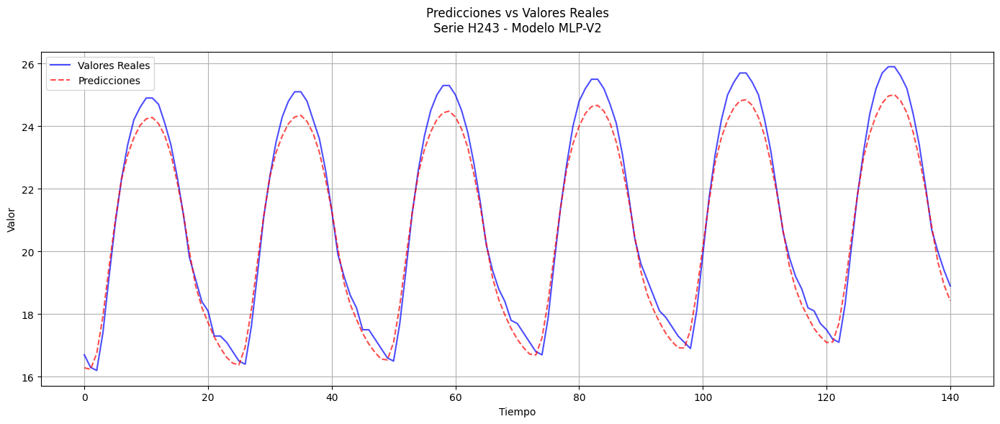


Versión 3 de MLP
Epoch 1/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 1.7807 - mae: 0.8089 - val_loss: 0.8567 - val_mae: 0.1490 - learning_rate: 1.0000e-04
Epoch 2/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 1.0304 - mae: 0.3500 - val_loss: 0.8352 - val_mae: 0.0978 - learning_rate: 1.0000e-04
Epoch 3/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.9979 - mae: 0.3369 - val_loss: 0.8157 - val_mae: 0.0570 - learning_rate: 1.0000e-04
Epoch 4/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.9656 - mae: 0.3074 - val_loss: 0.8248 - val_mae: 0.1558 - learning_rate: 1.0000e-04
Epoch 5/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.9115 - mae: 0.2672 - val_loss: 0.7914 - val_mae: 0.0770 - learning_rate: 1.0000e-04
Epoch 6/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.8747 - mae: 0.2432 - val_loss: 0.7713 - val_mae: 0.0365 - learning_rate: 1.0000e-04
Epoch 7/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.8343 - mae: 0.2110 - val_loss: 0.7549 - val_mae: 0

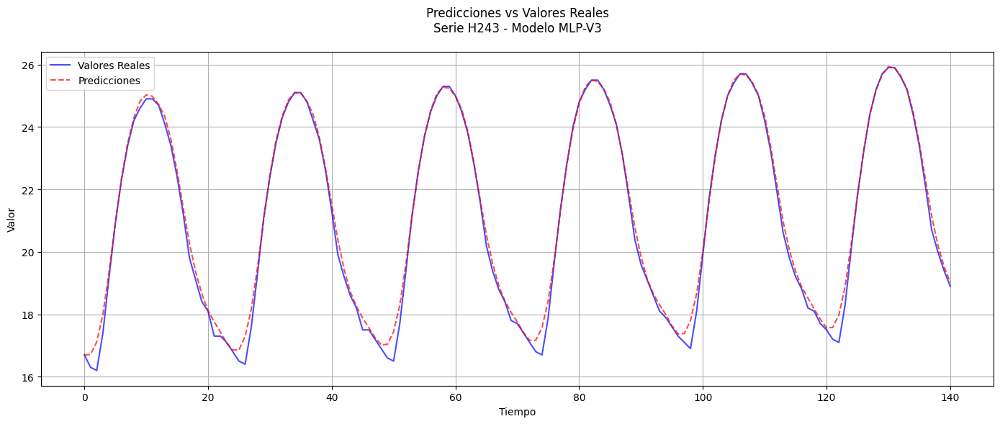


PROBANDO MODELOS CNN

Versión 1 de CNN
Epoch 1/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 2s 43ms/step - loss: 0.1092 - mae: 0.2686 - val_loss: 0.0174 - val_mae: 0.1192 - learning_rate: 0.0010
Epoch 2/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0123 - mae: 0.0948 - val_loss: 8.7184e-04 - val_mae: 0.0236 - learning_rate: 0.0010
Epoch 3/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0013 - mae: 0.0282 - val_loss: 0.0016 - val_mae: 0.0297 - learning_rate: 0.0010
Epoch 4/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 9.5333e-04 - mae: 0.0245 - val_loss: 8.3046e-04 - val_mae: 0.0234 - learning_rate: 0.0010
Epoch 5/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 7.4429e-04 - mae: 0.0200 - val_loss: 5.2782e-04 - val_mae: 0.0181 - learning_rate: 0.0010
Epoch 6/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 4.9762e-04 - mae: 0.0161 - val_loss: 4.0018e-04 - val_mae: 0.0152 - learning_rate: 0.0010
Epoch 7/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 3.1211e-04 - mae: 0.0134 -

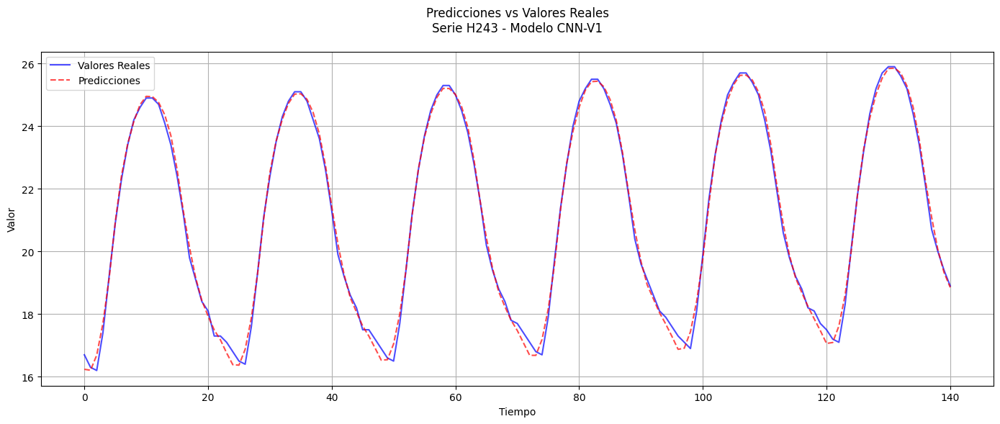


Versión 2 de CNN
Epoch 1/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 4s 84ms/step - loss: 0.0927 - mae: 0.2459 - val_loss: 0.0149 - val_mae: 0.0950 - learning_rate: 5.0000e-04
Epoch 2/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0111 - mae: 0.0853 - val_loss: 0.0163 - val_mae: 0.1224 - learning_rate: 5.0000e-04
Epoch 3/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0054 - mae: 0.0575 - val_loss: 0.0106 - val_mae: 0.0998 - learning_rate: 5.0000e-04
Epoch 4/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0045 - mae: 0.0523 - val_loss: 0.0037 - val_mae: 0.0565 - learning_rate: 5.0000e-04
Epoch 5/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0046 - mae: 0.0511 - val_loss: 0.0044 - val_mae: 0.0612 - learning_rate: 5.0000e-04
Epoch 6/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0031 - mae: 0.0436 - val_loss: 0.0112 - val_mae: 0.1034 - learning_rate: 5.0000e-04
Epoch 7/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0029 - mae: 0.0414 - val_loss: 0.0038 - val_mae: 0

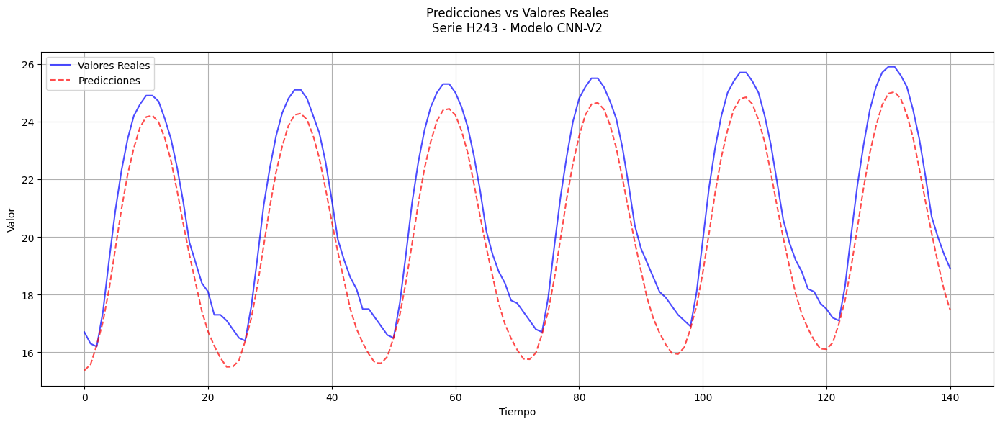


Versión 3 de CNN
Epoch 1/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 3s 73ms/step - loss: 1.8525 - mae: 0.2818 - val_loss: 1.6744 - val_mae: 0.1489 - learning_rate: 1.0000e-04
Epoch 2/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 1.6420 - mae: 0.1363 - val_loss: 1.5491 - val_mae: 0.1022 - learning_rate: 1.0000e-04
Epoch 3/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 1.5268 - mae: 0.1096 - val_loss: 1.4387 - val_mae: 0.0808 - learning_rate: 1.0000e-04
Epoch 4/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 1.4177 - mae: 0.0912 - val_loss: 1.3330 - val_mae: 0.0573 - learning_rate: 1.0000e-04
Epoch 5/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 1.3167 - mae: 0.0870 - val_loss: 1.2366 - val_mae: 0.0588 - learning_rate: 1.0000e-04
Epoch 6/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 1.2196 - mae: 0.0776 - val_loss: 1.1447 - val_mae: 0.0586 - learning_rate: 1.0000e-04
Epoch 7/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 1.1281 - mae: 0.0761 - val_loss: 1.0560 - val_mae: 0

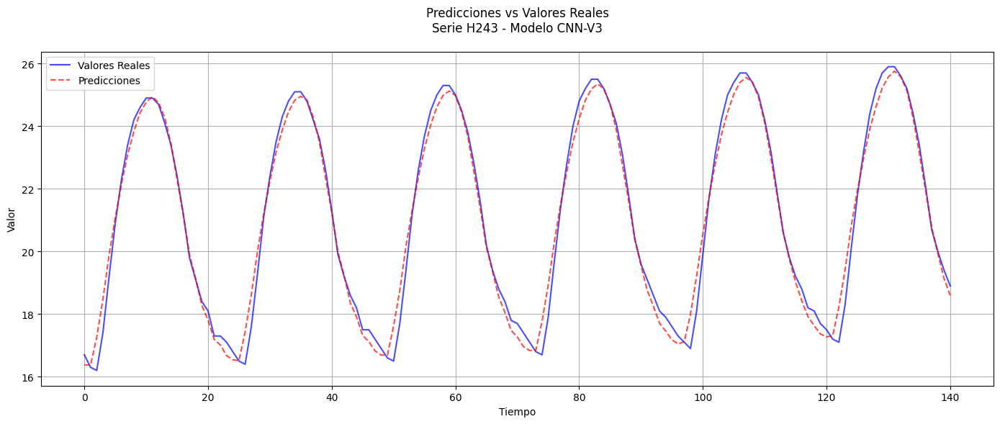


PROBANDO MODELOS LSTM

Versión 1 de LSTM
Epoch 1/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 1s 19ms/step - loss: 0.1030 - mae: 0.2610 - val_loss: 0.0428 - val_mae: 0.1860 - learning_rate: 0.0010
Epoch 2/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0406 - mae: 0.1834 - val_loss: 0.0588 - val_mae: 0.1856 - learning_rate: 0.0010
Epoch 3/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0320 - mae: 0.1601 - val_loss: 0.0585 - val_mae: 0.2008 - learning_rate: 0.0010
Epoch 4/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0200 - mae: 0.1208 - val_loss: 0.0075 - val_mae: 0.0705 - learning_rate: 0.0010
Epoch 5/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0077 - mae: 0.0715 - val_loss: 0.0040 - val_mae: 0.0498 - learning_rate: 0.0010
Epoch 6/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0063 - mae: 0.0594 - val_loss: 0.0227 - val_mae: 0.1445 - learning_rate: 0.0010
Epoch 7/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0044 - mae: 0.0529 - val_loss: 0.0023 - val_mae: 0

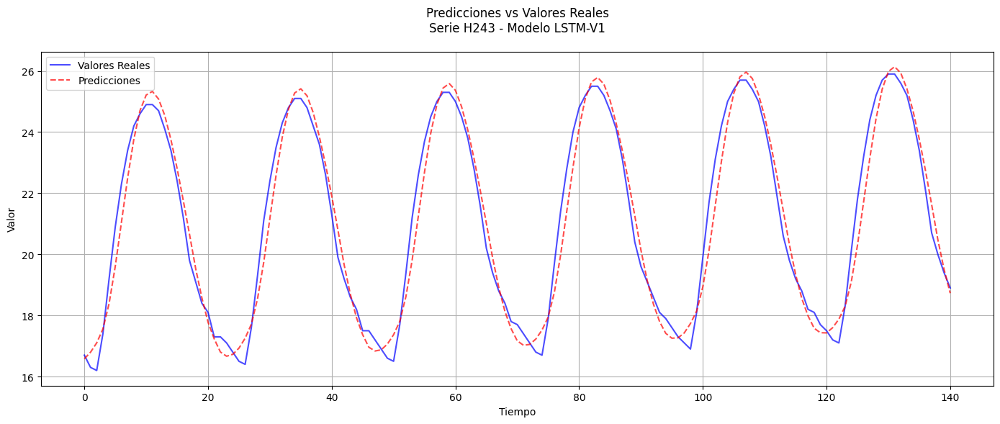


Versión 2 de LSTM
Epoch 1/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.1571 - mae: 0.3348 - val_loss: 0.0529 - val_mae: 0.2043 - learning_rate: 5.0000e-04
Epoch 2/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.0531 - mae: 0.2050 - val_loss: 0.0497 - val_mae: 0.1952 - learning_rate: 5.0000e-04
Epoch 3/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.0487 - mae: 0.2018 - val_loss: 0.0670 - val_mae: 0.2069 - learning_rate: 5.0000e-04
Epoch 4/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.0461 - mae: 0.1926 - val_loss: 0.0597 - val_mae: 0.1940 - learning_rate: 5.0000e-04
Epoch 5/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.0373 - mae: 0.1731 - val_loss: 0.0511 - val_mae: 0.1829 - learning_rate: 5.0000e-04
Epoch 6/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.0220 - mae: 0.1241 - val_loss: 0.0523 - val_mae: 0.2203 - learning_rate: 5.0000e-04
Epoch 7/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.0051 - mae: 0.0538 - val_loss: 0.0028 - val

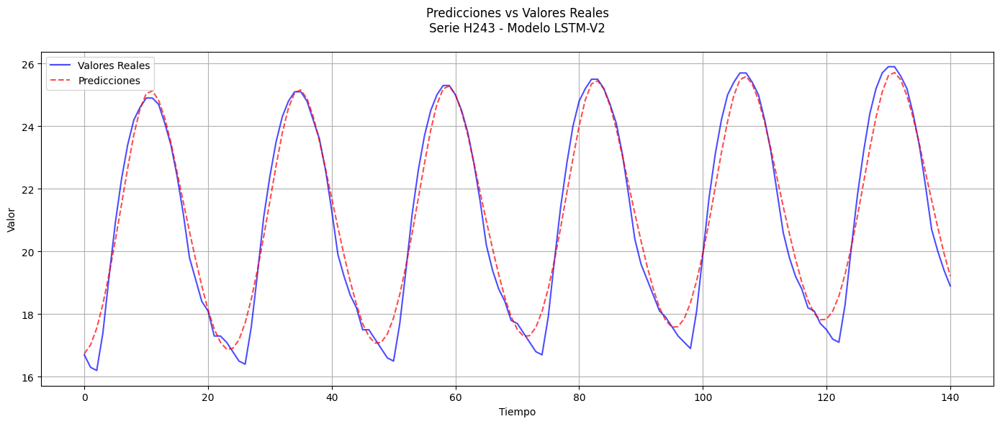


Versión 3 de LSTM
Epoch 1/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step - loss: 0.4404 - mae: 0.3685 - val_loss: 0.4559 - val_mae: 0.4041 - learning_rate: 1.0000e-04
Epoch 2/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.3458 - mae: 0.2399 - val_loss: 0.3207 - val_mae: 0.2105 - learning_rate: 1.0000e-04
Epoch 3/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.2918 - mae: 0.1735 - val_loss: 0.2834 - val_mae: 0.1674 - learning_rate: 1.0000e-04
Epoch 4/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.2819 - mae: 0.1696 - val_loss: 0.2784 - val_mae: 0.1625 - learning_rate: 1.0000e-04
Epoch 5/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.2747 - mae: 0.1614 - val_loss: 0.2699 - val_mae: 0.1540 - learning_rate: 1.0000e-04
Epoch 6/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.2664 - mae: 0.1502 - val_loss: 0.2619 - val_mae: 0.1452 - learning_rate: 1.0000e-04
Epoch 7/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.2596 - mae: 0.1450 - val_loss: 0.2541 - val

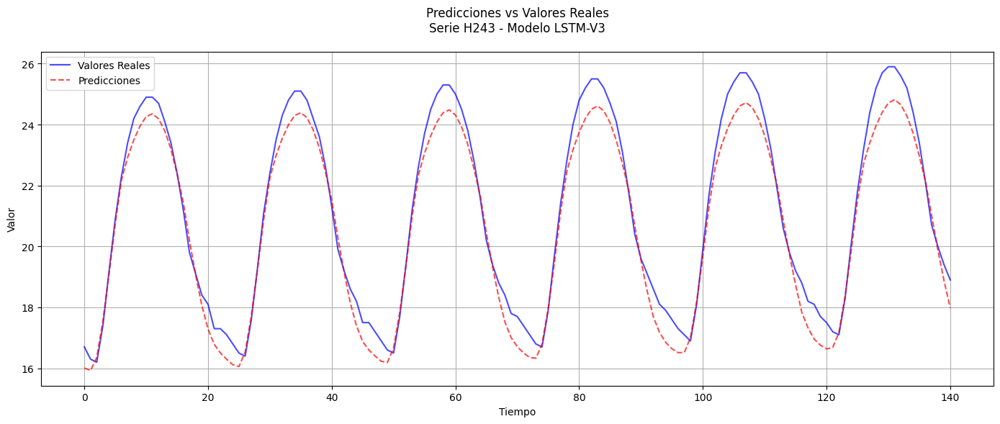


PROBANDO MODELOS CNN-LSTM

Versión 1 de CNN-LSTM
Epoch 1/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0838 - mae: 0.2403 - val_loss: 0.0595 - val_mae: 0.1987 - learning_rate: 0.0010
Epoch 2/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0426 - mae: 0.1879 - val_loss: 0.0391 - val_mae: 0.1691 - learning_rate: 0.0010
Epoch 3/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0320 - mae: 0.1631 - val_loss: 0.0701 - val_mae: 0.2286 - learning_rate: 0.0010
Epoch 4/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0220 - mae: 0.1278 - val_loss: 0.0087 - val_mae: 0.0747 - learning_rate: 0.0010
Epoch 5/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0090 - mae: 0.0770 - val_loss: 0.0063 - val_mae: 0.0698 - learning_rate: 0.0010
Epoch 6/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0066 - mae: 0.0626 - val_loss: 0.0282 - val_mae: 0.1647 - learning_rate: 0.0010
Epoch 7/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0038 - mae: 0.0478 - val_loss: 0.0180 - va

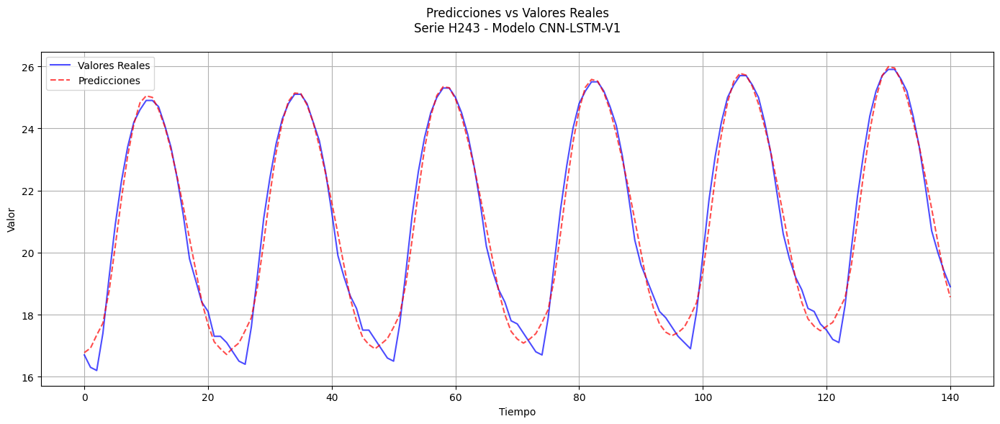


Versión 2 de CNN-LSTM
Epoch 1/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 5s 30ms/step - loss: 0.1702 - mae: 0.3445 - val_loss: 0.0504 - val_mae: 0.2007 - learning_rate: 5.0000e-04
Epoch 2/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.0557 - mae: 0.2082 - val_loss: 0.0629 - val_mae: 0.2082 - learning_rate: 5.0000e-04
Epoch 3/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.0468 - mae: 0.1923 - val_loss: 0.0593 - val_mae: 0.2005 - learning_rate: 5.0000e-04
Epoch 4/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.0403 - mae: 0.1764 - val_loss: 0.0471 - val_mae: 0.1771 - learning_rate: 5.0000e-04
Epoch 5/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.0267 - mae: 0.1371 - val_loss: 0.0389 - val_mae: 0.1919 - learning_rate: 5.0000e-04
Epoch 6/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.0068 - mae: 0.0655 - val_loss: 0.0043 - val_mae: 0.0601 - learning_rate: 5.0000e-04
Epoch 7/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.0033 - mae: 0.0422 - val_loss: 0.0027 -

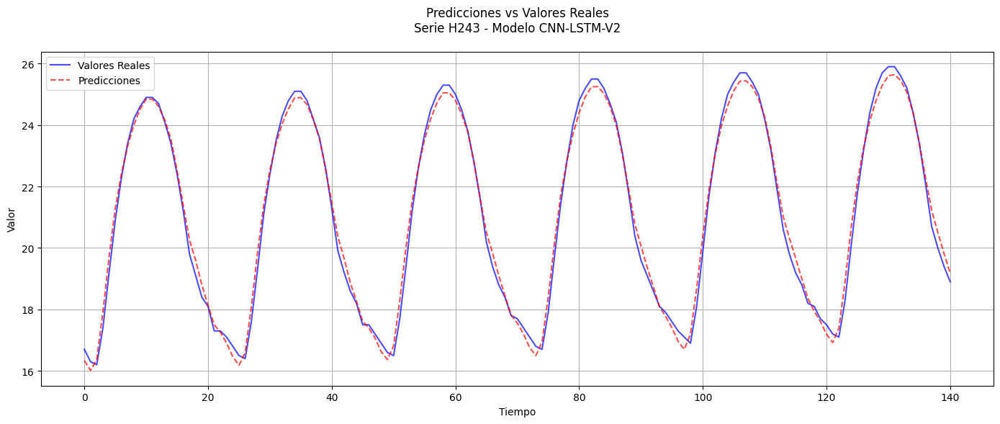


Versión 3 de CNN-LSTM
Epoch 1/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step - loss: 0.1608 - mae: 0.3360 - val_loss: 0.0441 - val_mae: 0.1877 - learning_rate: 5.0000e-04
Epoch 2/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.0501 - mae: 0.1955 - val_loss: 0.0419 - val_mae: 0.1824 - learning_rate: 5.0000e-04
Epoch 3/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0429 - mae: 0.1832 - val_loss: 0.0398 - val_mae: 0.1731 - learning_rate: 5.0000e-04
Epoch 4/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0395 - mae: 0.1754 - val_loss: 0.0303 - val_mae: 0.1434 - learning_rate: 5.0000e-04
Epoch 5/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0180 - mae: 0.1126 - val_loss: 0.0045 - val_mae: 0.0568 - learning_rate: 5.0000e-04
Epoch 6/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0039 - mae: 0.0495 - val_loss: 5.6464e-04 - val_mae: 0.0188 - learning_rate: 5.0000e-04
Epoch 7/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.0029 - mae: 0.0413 - val_loss: 0.00

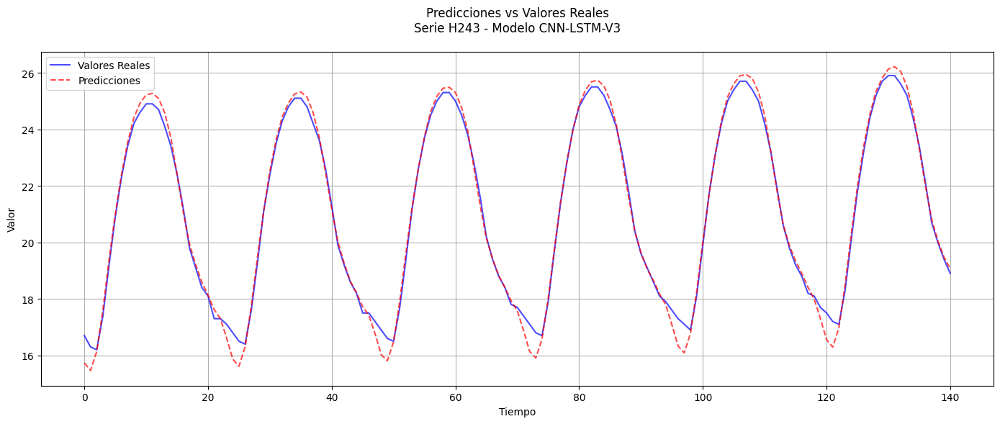


MEJOR MODELO PARA SERIE H243: CNN
RMSE: 0.2033


Análisis de la serie H384:
Longitud de la serie: 959 puntos
Fecha de inicio: 2017-04-17 12:00:00
Fecha de fin: 2017-05-27 10:00:00

Estadísticas descriptivas:
count    959.000000
mean      47.671533
std       30.155781
min       11.000000
25%       25.000000
50%       40.000000
75%       60.000000
max      206.000000
Name: H384, dtype: float64


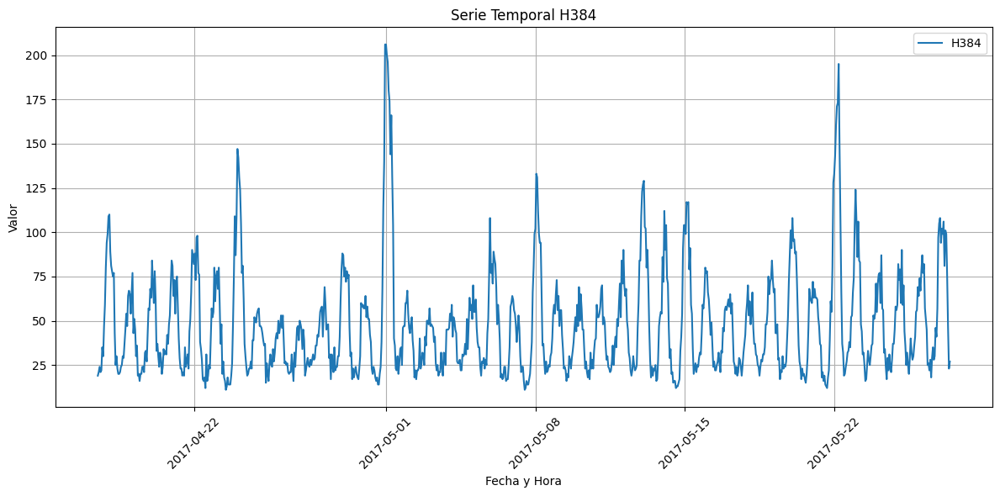

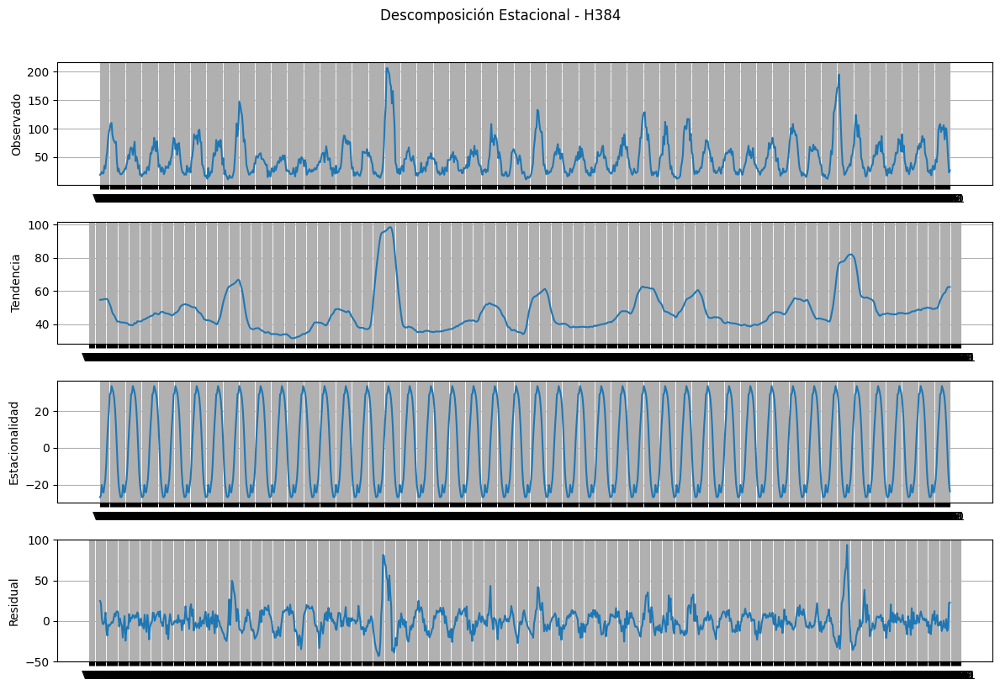


ENTRENANDO MODELOS PARA SERIE H384


PROBANDO MODELOS MLP

Versión 1 de MLP
Epoch 1/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.3959 - mae: 0.1344 - val_loss: 0.3076 - val_mae: 0.0424 - learning_rate: 0.0010
Epoch 2/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.2950 - mae: 0.0628 - val_loss: 0.2350 - val_mae: 0.0318 - learning_rate: 0.0010
Epoch 3/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.2267 - mae: 0.0611 - val_loss: 0.1780 - val_mae: 0.0304 - learning_rate: 0.0010
Epoch 4/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.1699 - mae: 0.0522 - val_loss: 0.1333 - val_mae: 0.0303 - learning_rate: 0.0010
Epoch 5/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.1288 - mae: 0.0519 - val_loss: 0.0993 - val_mae: 0.0291 - learning_rate: 0.0010
Epoch 6/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0961 - mae: 0.0495 - val_loss: 0.0734 - val_mae: 0.0297 - learning_rate: 0.0010
Epoch 7/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0713 - mae: 0.0

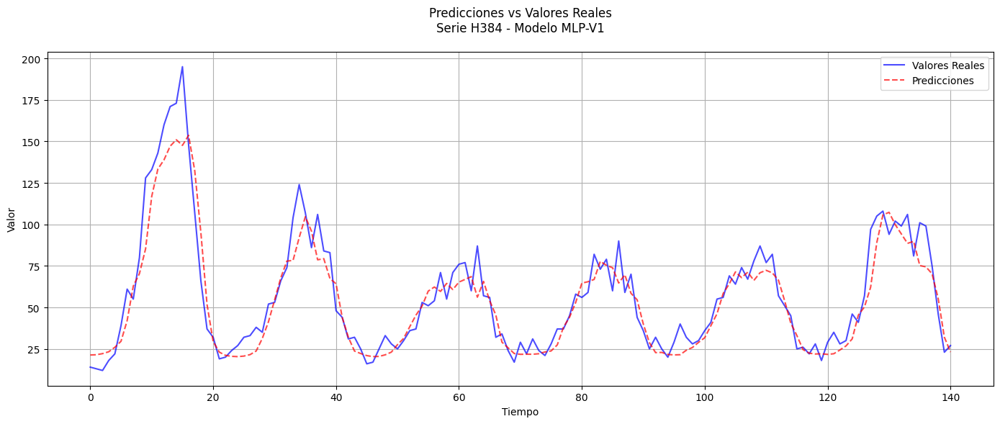


Versión 2 de MLP
Epoch 1/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 5s 113ms/step - loss: 1.2980 - mae: 0.1089 - val_loss: 1.0823 - val_mae: 0.0379 - learning_rate: 5.0000e-04
Epoch 2/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 1.0322 - mae: 0.0635 - val_loss: 0.8612 - val_mae: 0.0454 - learning_rate: 5.0000e-04
Epoch 3/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.8163 - mae: 0.0495 - val_loss: 0.6790 - val_mae: 0.0327 - learning_rate: 5.0000e-04
Epoch 4/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.6443 - mae: 0.0501 - val_loss: 0.5334 - val_mae: 0.0327 - learning_rate: 5.0000e-04
Epoch 5/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.5059 - mae: 0.0492 - val_loss: 0.4167 - val_mae: 0.0327 - learning_rate: 5.0000e-04
Epoch 6/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.3949 - mae: 0.0466 - val_loss: 0.3236 - val_mae: 0.0314 - learning_rate: 5.0000e-04
Epoch 7/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.3073 - mae: 0.0440 - val_loss: 0.2499 - val_mae: 

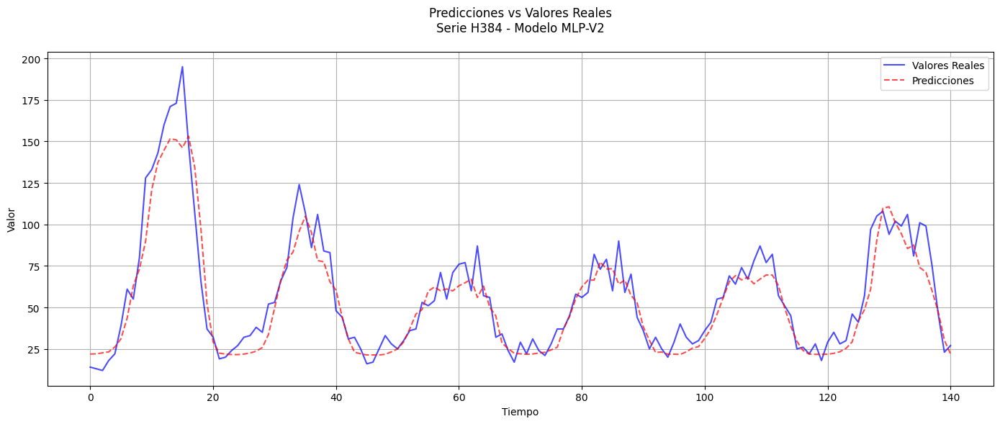


Versión 3 de MLP
Epoch 1/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 4s 101ms/step - loss: 0.8994 - mae: 0.2018 - val_loss: 0.8131 - val_mae: 0.0442 - learning_rate: 1.0000e-04
Epoch 2/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.8391 - mae: 0.1373 - val_loss: 0.7905 - val_mae: 0.0398 - learning_rate: 1.0000e-04
Epoch 3/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.8166 - mae: 0.1389 - val_loss: 0.7687 - val_mae: 0.0395 - learning_rate: 1.0000e-04
Epoch 4/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.7901 - mae: 0.1254 - val_loss: 0.7470 - val_mae: 0.0399 - learning_rate: 1.0000e-04
Epoch 5/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.7576 - mae: 0.1042 - val_loss: 0.7258 - val_mae: 0.0493 - learning_rate: 1.0000e-04
Epoch 6/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.7420 - mae: 0.1170 - val_loss: 0.7033 - val_mae: 0.0395 - learning_rate: 1.0000e-04
Epoch 7/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.7123 - mae: 0.1008 - val_loss: 0.6809 - val_mae: 

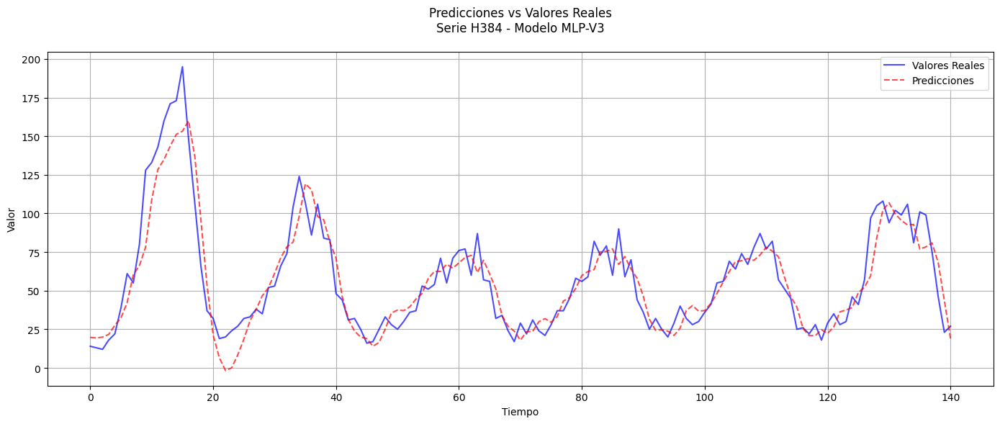


PROBANDO MODELOS CNN

Versión 1 de CNN
Epoch 1/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 2s 42ms/step - loss: 0.0169 - mae: 0.0893 - val_loss: 0.0028 - val_mae: 0.0403 - learning_rate: 0.0010
Epoch 2/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0047 - mae: 0.0479 - val_loss: 0.0017 - val_mae: 0.0309 - learning_rate: 0.0010
Epoch 3/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0032 - mae: 0.0395 - val_loss: 0.0014 - val_mae: 0.0285 - learning_rate: 0.0010
Epoch 4/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0031 - mae: 0.0387 - val_loss: 0.0017 - val_mae: 0.0338 - learning_rate: 0.0010
Epoch 5/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0028 - mae: 0.0392 - val_loss: 0.0015 - val_mae: 0.0295 - learning_rate: 0.0010
Epoch 6/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0023 - mae: 0.0351 - val_loss: 0.0014 - val_mae: 0.0291 - learning_rate: 0.0010
Epoch 7/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0027 - mae: 0.0381 - val_loss: 0.0013 - val_mae: 0.0

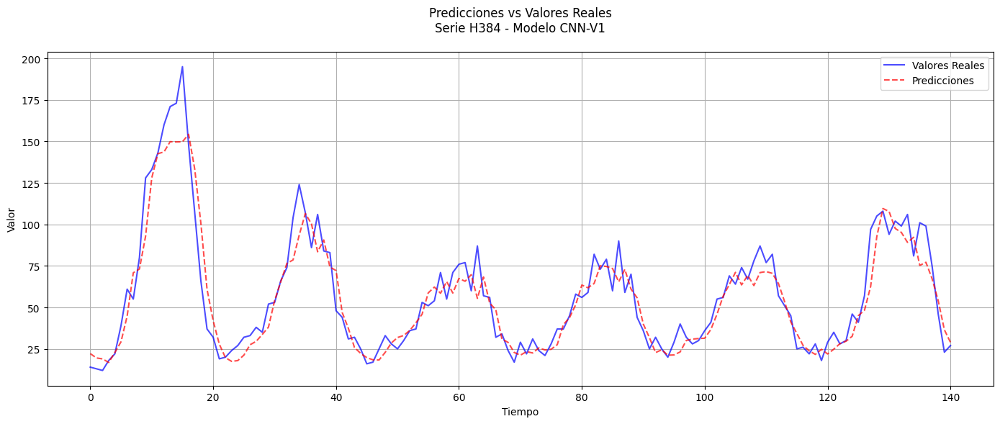


Versión 2 de CNN
Epoch 1/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 4s 83ms/step - loss: 0.0266 - mae: 0.1153 - val_loss: 0.0025 - val_mae: 0.0377 - learning_rate: 5.0000e-04
Epoch 2/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0071 - mae: 0.0556 - val_loss: 0.0019 - val_mae: 0.0320 - learning_rate: 5.0000e-04
Epoch 3/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0045 - mae: 0.0465 - val_loss: 0.0016 - val_mae: 0.0298 - learning_rate: 5.0000e-04
Epoch 4/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0032 - mae: 0.0409 - val_loss: 0.0017 - val_mae: 0.0307 - learning_rate: 5.0000e-04
Epoch 5/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0033 - mae: 0.0413 - val_loss: 0.0015 - val_mae: 0.0299 - learning_rate: 5.0000e-04
Epoch 6/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0039 - mae: 0.0433 - val_loss: 0.0017 - val_mae: 0.0315 - learning_rate: 5.0000e-04
Epoch 7/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0030 - mae: 0.0393 - val_loss: 0.0014 - val_mae: 0

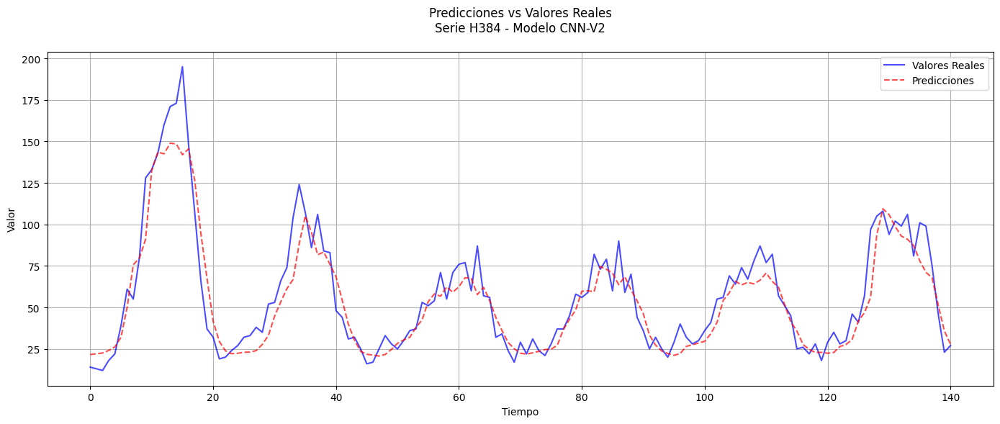


Versión 3 de CNN
Epoch 1/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 3s 75ms/step - loss: 1.7643 - mae: 0.1373 - val_loss: 1.6337 - val_mae: 0.0868 - learning_rate: 1.0000e-04
Epoch 2/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 1.6136 - mae: 0.0953 - val_loss: 1.5145 - val_mae: 0.0681 - learning_rate: 1.0000e-04
Epoch 3/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 1.4999 - mae: 0.0892 - val_loss: 1.4058 - val_mae: 0.0570 - learning_rate: 1.0000e-04
Epoch 4/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 1.3903 - mae: 0.0811 - val_loss: 1.3030 - val_mae: 0.0502 - learning_rate: 1.0000e-04
Epoch 5/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 1.2869 - mae: 0.0728 - val_loss: 1.2059 - val_mae: 0.0454 - learning_rate: 1.0000e-04
Epoch 6/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 1.1902 - mae: 0.0715 - val_loss: 1.1141 - val_mae: 0.0460 - learning_rate: 1.0000e-04
Epoch 7/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 1.1000 - mae: 0.0703 - val_loss: 1.0273 - val_mae: 0

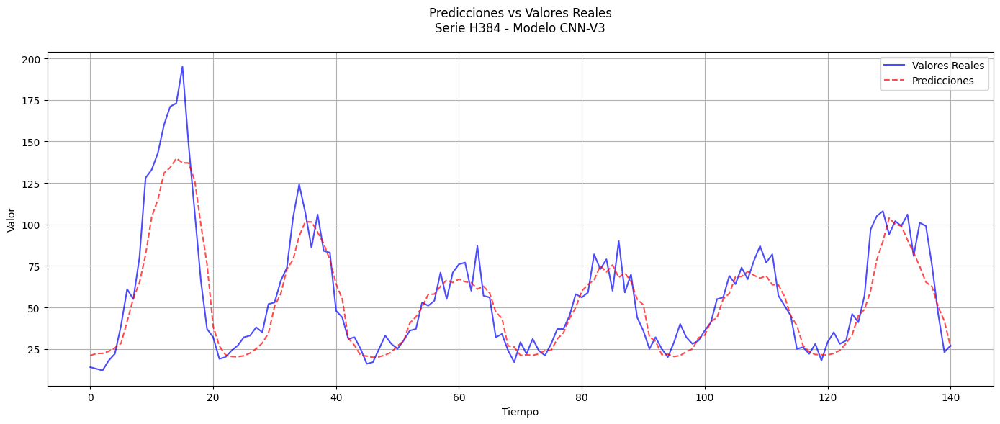


PROBANDO MODELOS LSTM

Versión 1 de LSTM
Epoch 1/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 1s 19ms/step - loss: 0.0319 - mae: 0.1285 - val_loss: 0.0116 - val_mae: 0.0901 - learning_rate: 0.0010
Epoch 2/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0197 - mae: 0.1024 - val_loss: 0.0093 - val_mae: 0.0833 - learning_rate: 0.0010
Epoch 3/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0175 - mae: 0.0935 - val_loss: 0.0064 - val_mae: 0.0658 - learning_rate: 0.0010
Epoch 4/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0086 - mae: 0.0685 - val_loss: 0.0040 - val_mae: 0.0487 - learning_rate: 0.0010
Epoch 5/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0074 - mae: 0.0599 - val_loss: 0.0027 - val_mae: 0.0404 - learning_rate: 0.0010
Epoch 6/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0062 - mae: 0.0551 - val_loss: 0.0028 - val_mae: 0.0428 - learning_rate: 0.0010
Epoch 7/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0051 - mae: 0.0507 - val_loss: 0.0020 - val_mae: 0

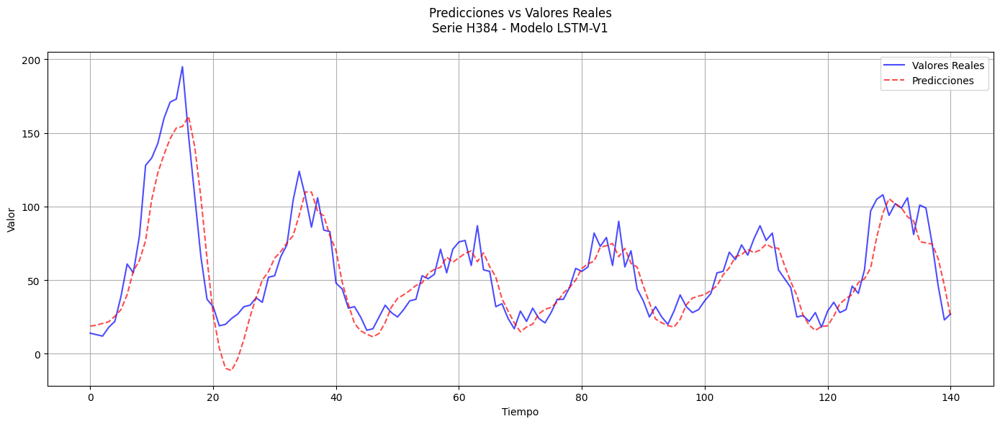


Versión 2 de LSTM
Epoch 1/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0281 - mae: 0.1234 - val_loss: 0.0131 - val_mae: 0.0933 - learning_rate: 5.0000e-04
Epoch 2/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.0199 - mae: 0.1015 - val_loss: 0.0095 - val_mae: 0.0846 - learning_rate: 5.0000e-04
Epoch 3/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.0153 - mae: 0.0877 - val_loss: 0.0045 - val_mae: 0.0539 - learning_rate: 5.0000e-04
Epoch 4/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.0080 - mae: 0.0661 - val_loss: 0.0021 - val_mae: 0.0339 - learning_rate: 5.0000e-04
Epoch 5/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.0063 - mae: 0.0530 - val_loss: 0.0020 - val_mae: 0.0331 - learning_rate: 5.0000e-04
Epoch 6/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.0053 - mae: 0.0446 - val_loss: 0.0024 - val_mae: 0.0355 - learning_rate: 5.0000e-04
Epoch 7/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.0037 - mae: 0.0429 - val_loss: 0.0019 - val

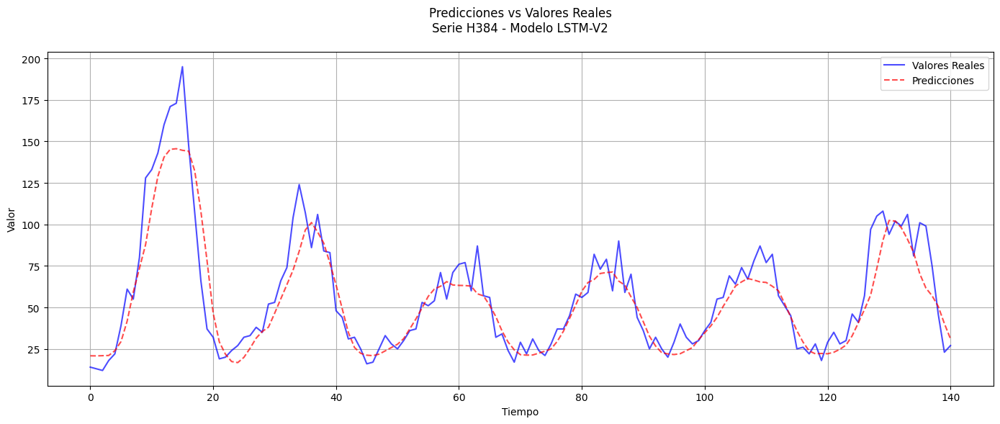


Versión 3 de LSTM
Epoch 1/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 4s 39ms/step - loss: 0.3253 - mae: 0.2056 - val_loss: 0.2892 - val_mae: 0.1643 - learning_rate: 1.0000e-04
Epoch 2/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.2989 - mae: 0.1614 - val_loss: 0.2745 - val_mae: 0.1351 - learning_rate: 1.0000e-04
Epoch 3/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.2799 - mae: 0.1262 - val_loss: 0.2608 - val_mae: 0.1104 - learning_rate: 1.0000e-04
Epoch 4/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.2681 - mae: 0.1126 - val_loss: 0.2481 - val_mae: 0.0959 - learning_rate: 1.0000e-04
Epoch 5/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.2562 - mae: 0.1066 - val_loss: 0.2400 - val_mae: 0.0913 - learning_rate: 1.0000e-04
Epoch 6/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.2485 - mae: 0.1056 - val_loss: 0.2341 - val_mae: 0.0878 - learning_rate: 1.0000e-04
Epoch 7/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.2386 - mae: 0.0971 - val_loss: 0.2285 - val

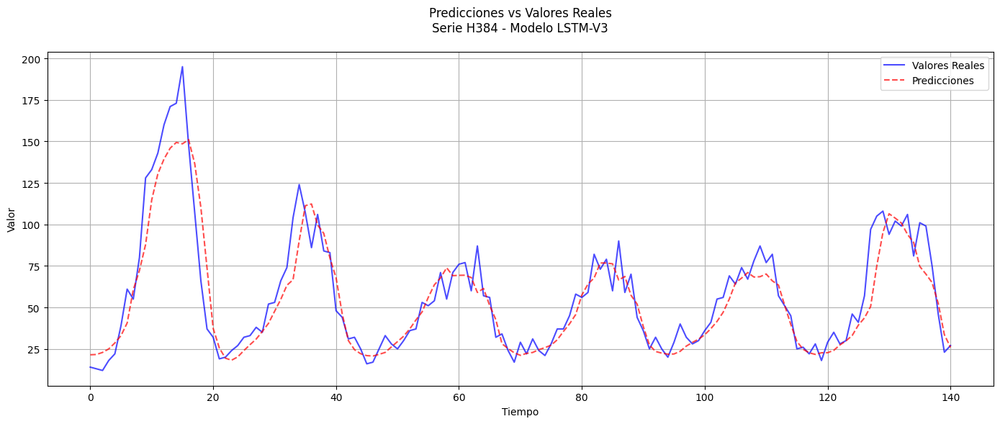


PROBANDO MODELOS CNN-LSTM

Versión 1 de CNN-LSTM
Epoch 1/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0317 - mae: 0.1241 - val_loss: 0.0110 - val_mae: 0.0912 - learning_rate: 0.0010
Epoch 2/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0178 - mae: 0.0991 - val_loss: 0.0093 - val_mae: 0.0832 - learning_rate: 0.0010
Epoch 3/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0145 - mae: 0.0892 - val_loss: 0.0085 - val_mae: 0.0704 - learning_rate: 0.0010
Epoch 4/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0122 - mae: 0.0783 - val_loss: 0.0067 - val_mae: 0.0616 - learning_rate: 0.0010
Epoch 5/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0097 - mae: 0.0683 - val_loss: 0.0044 - val_mae: 0.0498 - learning_rate: 0.0010
Epoch 6/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0071 - mae: 0.0588 - val_loss: 0.0029 - val_mae: 0.0439 - learning_rate: 0.0010
Epoch 7/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0056 - mae: 0.0554 - val_loss: 0.0036 - va

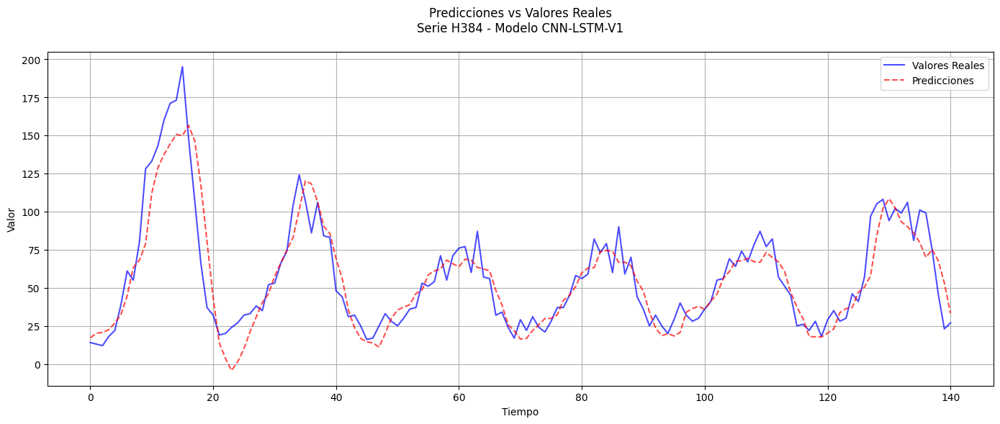


Versión 2 de CNN-LSTM
Epoch 1/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step - loss: 0.0428 - mae: 0.1477 - val_loss: 0.0132 - val_mae: 0.0987 - learning_rate: 5.0000e-04
Epoch 2/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.0252 - mae: 0.1160 - val_loss: 0.0122 - val_mae: 0.0947 - learning_rate: 5.0000e-04
Epoch 3/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.0233 - mae: 0.1144 - val_loss: 0.0111 - val_mae: 0.0897 - learning_rate: 5.0000e-04
Epoch 4/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.0204 - mae: 0.1034 - val_loss: 0.0095 - val_mae: 0.0806 - learning_rate: 5.0000e-04
Epoch 5/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.0190 - mae: 0.0982 - val_loss: 0.0081 - val_mae: 0.0631 - learning_rate: 5.0000e-04
Epoch 6/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.0168 - mae: 0.0826 - val_loss: 0.0042 - val_mae: 0.0514 - learning_rate: 5.0000e-04
Epoch 7/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.0098 - mae: 0.0676 - val_loss: 0.0037 -

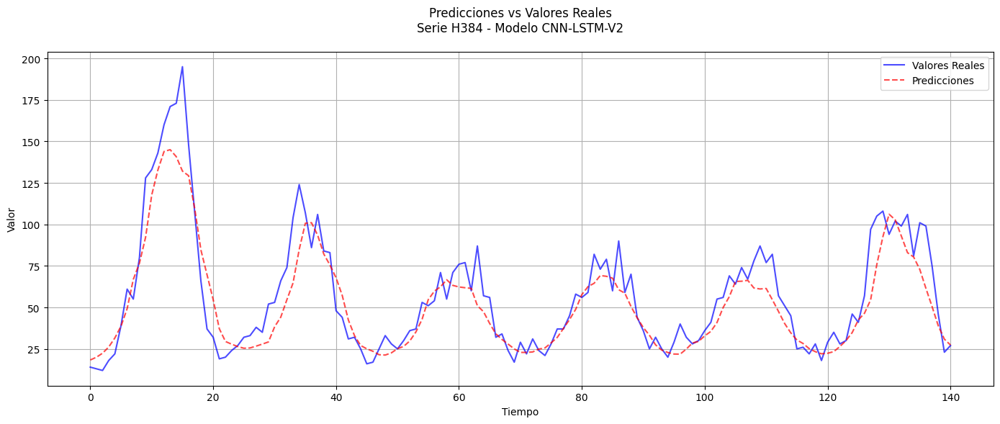


Versión 3 de CNN-LSTM
Epoch 1/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 3s 31ms/step - loss: 0.0455 - mae: 0.1515 - val_loss: 0.0120 - val_mae: 0.0934 - learning_rate: 5.0000e-04
Epoch 2/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0230 - mae: 0.1085 - val_loss: 0.0115 - val_mae: 0.0916 - learning_rate: 5.0000e-04
Epoch 3/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.0269 - mae: 0.1182 - val_loss: 0.0099 - val_mae: 0.0831 - learning_rate: 5.0000e-04
Epoch 4/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0237 - mae: 0.1063 - val_loss: 0.0061 - val_mae: 0.0637 - learning_rate: 5.0000e-04
Epoch 5/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0110 - mae: 0.0765 - val_loss: 0.0059 - val_mae: 0.0616 - learning_rate: 5.0000e-04
Epoch 6/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0119 - mae: 0.0736 - val_loss: 0.0035 - val_mae: 0.0475 - learning_rate: 5.0000e-04
Epoch 7/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0087 - mae: 0.0649 - val_loss: 0.0028 -

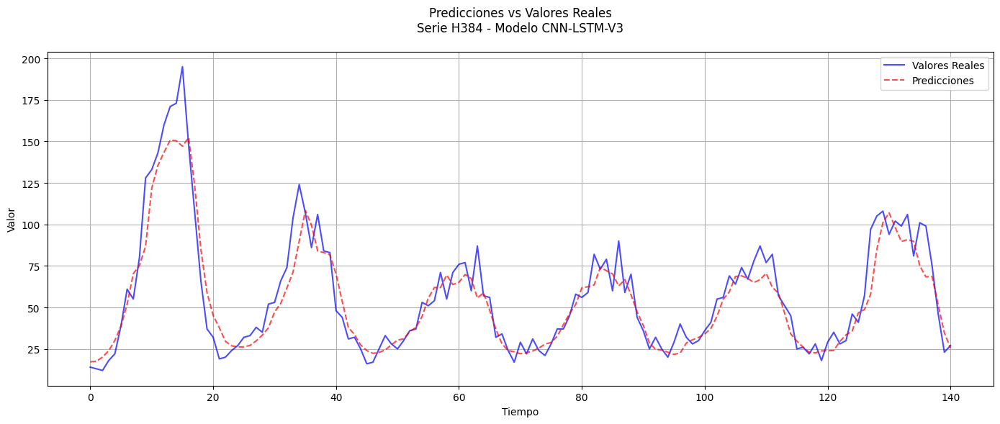


MEJOR MODELO PARA SERIE H384: CNN
RMSE: 12.4181


Análisis de la serie H402:
Longitud de la serie: 959 puntos
Fecha de inicio: 2017-01-01 12:00:00
Fecha de fin: 2017-02-10 10:00:00

Estadísticas descriptivas:
count    959.000000
mean      57.004171
std       37.978265
min       11.000000
25%       22.000000
50%       53.000000
75%       84.000000
max      295.000000
Name: H402, dtype: float64


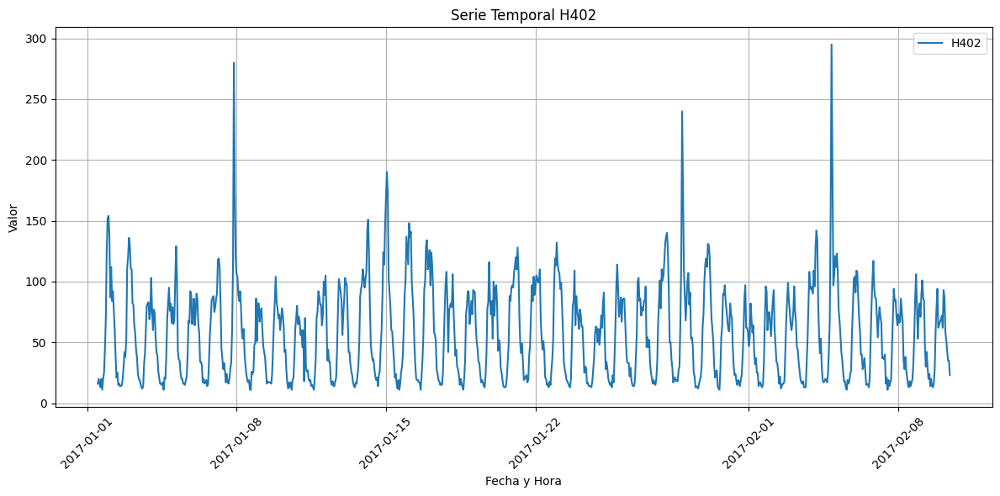

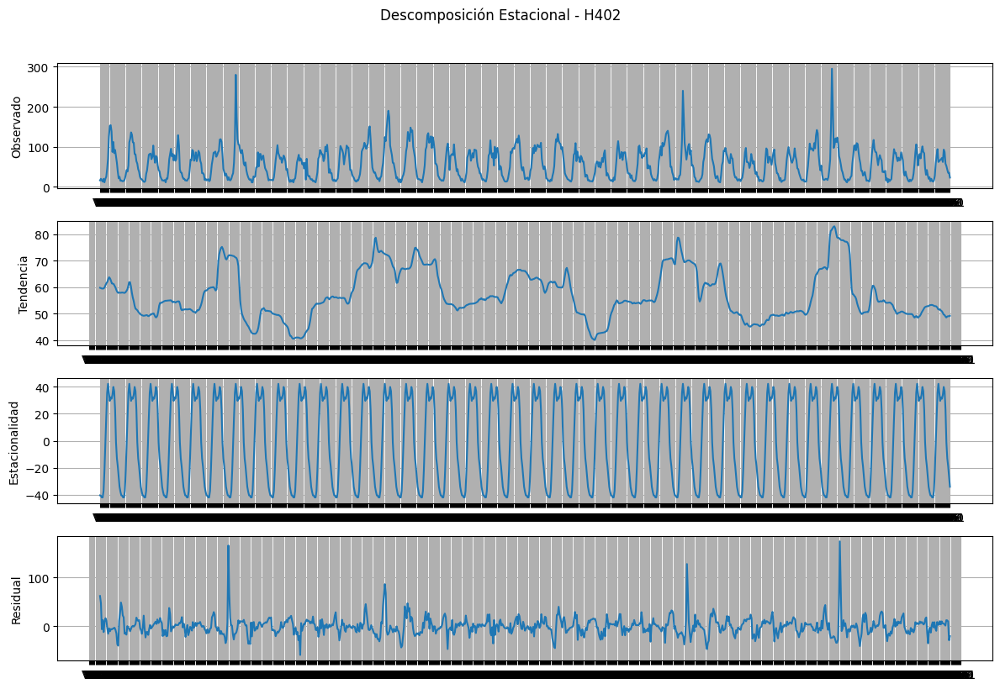


ENTRENANDO MODELOS PARA SERIE H402


PROBANDO MODELOS MLP

Versión 1 de MLP
Epoch 1/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.4384 - mae: 0.2079 - val_loss: 0.3195 - val_mae: 0.0599 - learning_rate: 0.0010
Epoch 2/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.3058 - mae: 0.0694 - val_loss: 0.2500 - val_mae: 0.0438 - learning_rate: 0.0010
Epoch 3/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.2386 - mae: 0.0564 - val_loss: 0.1924 - val_mae: 0.0413 - learning_rate: 0.0010
Epoch 4/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.1830 - mae: 0.0531 - val_loss: 0.1471 - val_mae: 0.0397 - learning_rate: 0.0010
Epoch 5/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.1398 - mae: 0.0485 - val_loss: 0.1115 - val_mae: 0.0374 - learning_rate: 0.0010
Epoch 6/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.1067 - mae: 0.0432 - val_loss: 0.0841 - val_mae: 0.0363 - learning_rate: 0.0010
Epoch 7/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0804 - mae: 0.0

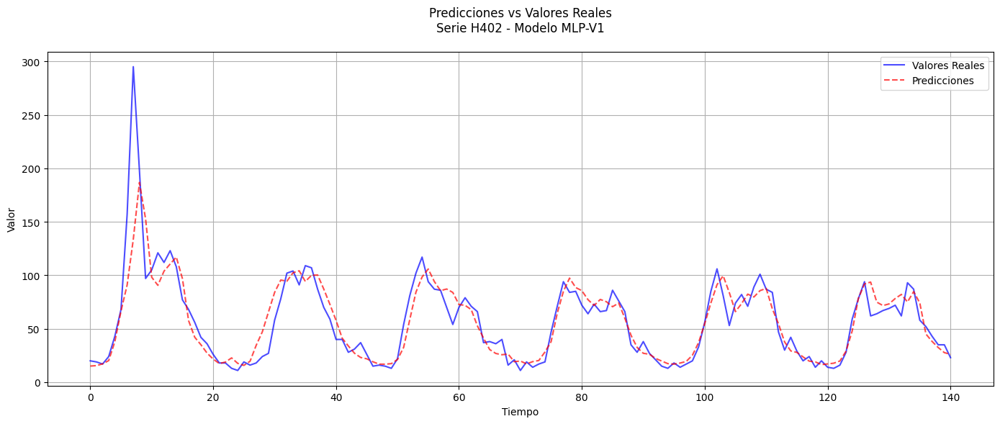


Versión 2 de MLP
Epoch 1/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 5s 112ms/step - loss: 1.2840 - mae: 0.1235 - val_loss: 1.0690 - val_mae: 0.0745 - learning_rate: 5.0000e-04
Epoch 2/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 1.0127 - mae: 0.0760 - val_loss: 0.8432 - val_mae: 0.0462 - learning_rate: 5.0000e-04
Epoch 3/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.7994 - mae: 0.0560 - val_loss: 0.6626 - val_mae: 0.0420 - learning_rate: 5.0000e-04
Epoch 4/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.6264 - mae: 0.0497 - val_loss: 0.5184 - val_mae: 0.0430 - learning_rate: 5.0000e-04
Epoch 5/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.4900 - mae: 0.0465 - val_loss: 0.4034 - val_mae: 0.0386 - learning_rate: 5.0000e-04
Epoch 6/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.3817 - mae: 0.0454 - val_loss: 0.3120 - val_mae: 0.0373 - learning_rate: 5.0000e-04
Epoch 7/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.2953 - mae: 0.0473 - val_loss: 0.2402 - val_mae: 

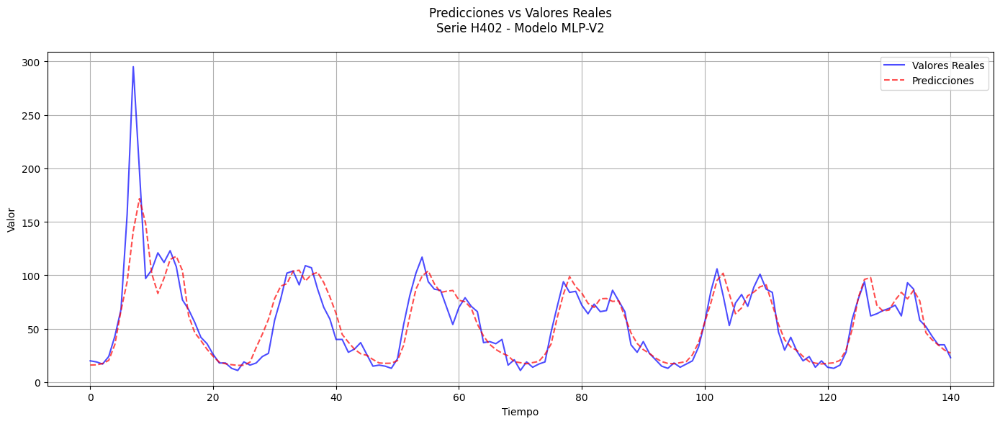


Versión 3 de MLP
Epoch 1/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.8650 - mae: 0.1596 - val_loss: 0.8061 - val_mae: 0.0648 - learning_rate: 1.0000e-04
Epoch 2/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.8246 - mae: 0.1397 - val_loss: 0.7808 - val_mae: 0.0603 - learning_rate: 1.0000e-04
Epoch 3/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.7955 - mae: 0.1265 - val_loss: 0.7570 - val_mae: 0.0565 - learning_rate: 1.0000e-04
Epoch 4/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.7710 - mae: 0.1219 - val_loss: 0.7332 - val_mae: 0.0518 - learning_rate: 1.0000e-04
Epoch 5/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.7414 - mae: 0.1049 - val_loss: 0.7101 - val_mae: 0.0510 - learning_rate: 1.0000e-04
Epoch 6/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.7188 - mae: 0.1067 - val_loss: 0.6864 - val_mae: 0.0473 - learning_rate: 1.0000e-04
Epoch 7/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.6935 - mae: 0.0985 - val_loss: 0.6632 - val_mae: 0

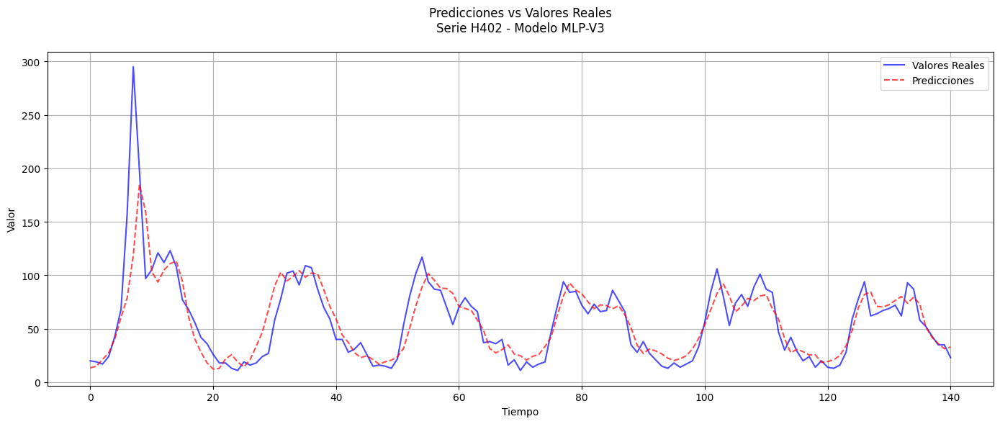


PROBANDO MODELOS CNN

Versión 1 de CNN
Epoch 1/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 2s 43ms/step - loss: 0.0235 - mae: 0.1071 - val_loss: 0.0038 - val_mae: 0.0433 - learning_rate: 0.0010
Epoch 2/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0045 - mae: 0.0438 - val_loss: 0.0032 - val_mae: 0.0411 - learning_rate: 0.0010
Epoch 3/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0044 - mae: 0.0381 - val_loss: 0.0027 - val_mae: 0.0373 - learning_rate: 0.0010
Epoch 4/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0043 - mae: 0.0396 - val_loss: 0.0023 - val_mae: 0.0337 - learning_rate: 0.0010
Epoch 5/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0033 - mae: 0.0367 - val_loss: 0.0020 - val_mae: 0.0313 - learning_rate: 0.0010
Epoch 6/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0029 - mae: 0.0357 - val_loss: 0.0020 - val_mae: 0.0315 - learning_rate: 0.0010
Epoch 7/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0031 - mae: 0.0343 - val_loss: 0.0018 - val_mae: 0.0

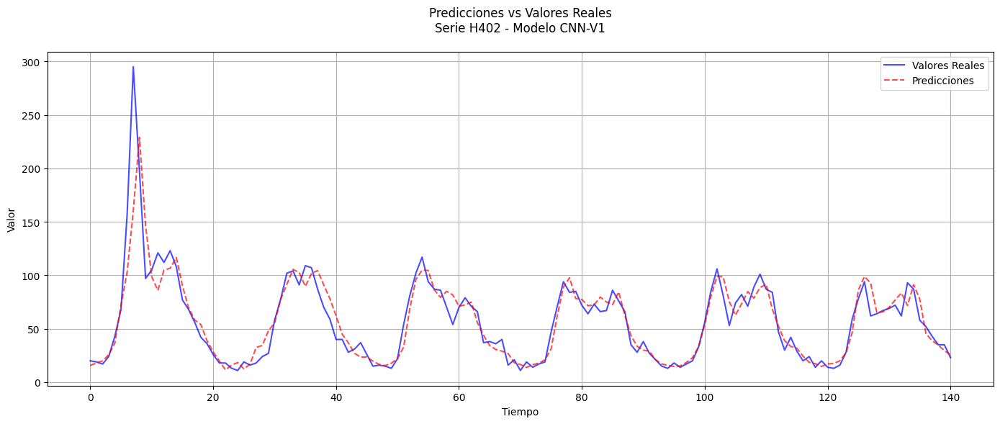


Versión 2 de CNN
Epoch 1/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 4s 85ms/step - loss: 0.0236 - mae: 0.1102 - val_loss: 0.0056 - val_mae: 0.0540 - learning_rate: 5.0000e-04
Epoch 2/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0079 - mae: 0.0589 - val_loss: 0.0038 - val_mae: 0.0447 - learning_rate: 5.0000e-04
Epoch 3/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0063 - mae: 0.0508 - val_loss: 0.0029 - val_mae: 0.0405 - learning_rate: 5.0000e-04
Epoch 4/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0037 - mae: 0.0423 - val_loss: 0.0028 - val_mae: 0.0374 - learning_rate: 5.0000e-04
Epoch 5/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0036 - mae: 0.0396 - val_loss: 0.0020 - val_mae: 0.0332 - learning_rate: 5.0000e-04
Epoch 6/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0037 - mae: 0.0399 - val_loss: 0.0018 - val_mae: 0.0296 - learning_rate: 5.0000e-04
Epoch 7/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0029 - mae: 0.0352 - val_loss: 0.0016 - val_mae: 0

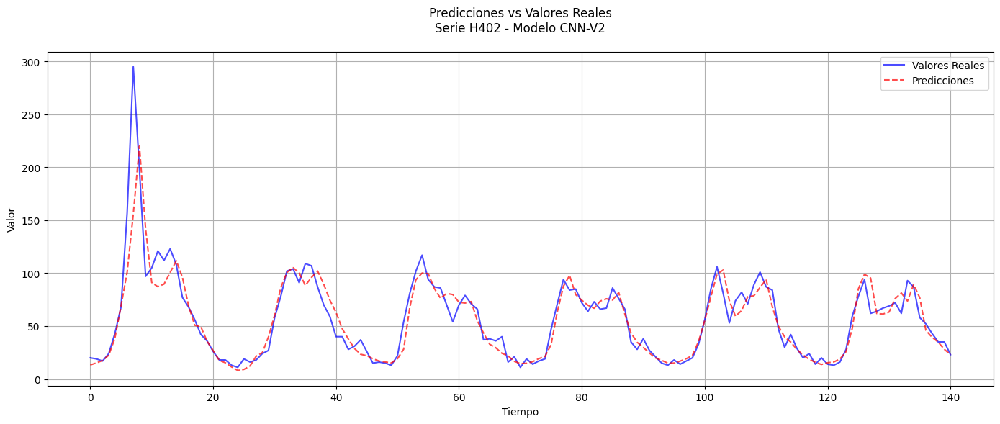


Versión 3 de CNN
Epoch 1/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 3s 74ms/step - loss: 1.7428 - mae: 0.1366 - val_loss: 1.6189 - val_mae: 0.0912 - learning_rate: 1.0000e-04
Epoch 2/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 1.5920 - mae: 0.0959 - val_loss: 1.5002 - val_mae: 0.0759 - learning_rate: 1.0000e-04
Epoch 3/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 1.4771 - mae: 0.0850 - val_loss: 1.3916 - val_mae: 0.0687 - learning_rate: 1.0000e-04
Epoch 4/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 1.3693 - mae: 0.0735 - val_loss: 1.2892 - val_mae: 0.0661 - learning_rate: 1.0000e-04
Epoch 5/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 1.2678 - mae: 0.0735 - val_loss: 1.1920 - val_mae: 0.0612 - learning_rate: 1.0000e-04
Epoch 6/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 1.1738 - mae: 0.0704 - val_loss: 1.1004 - val_mae: 0.0597 - learning_rate: 1.0000e-04
Epoch 7/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 1.0819 - mae: 0.0672 - val_loss: 1.0136 - val_mae: 0

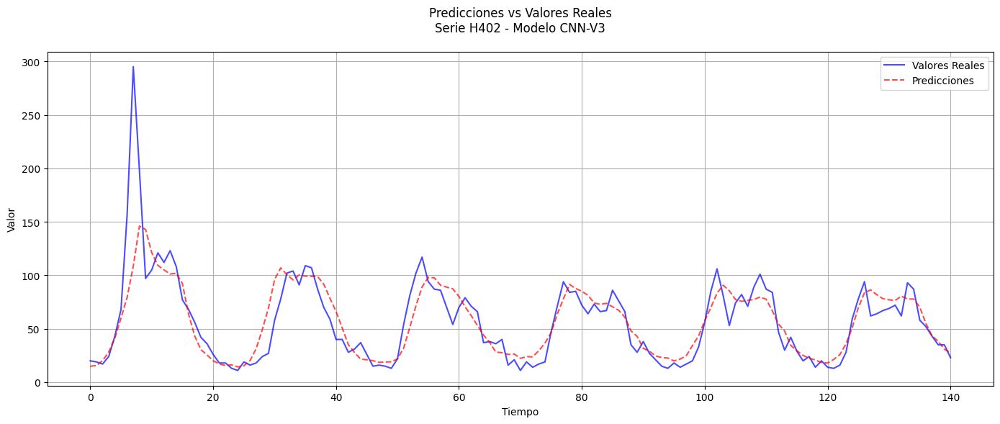


PROBANDO MODELOS LSTM

Versión 1 de LSTM
Epoch 1/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0218 - mae: 0.1153 - val_loss: 0.0117 - val_mae: 0.0935 - learning_rate: 0.0010
Epoch 2/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0121 - mae: 0.0924 - val_loss: 0.0082 - val_mae: 0.0763 - learning_rate: 0.0010
Epoch 3/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0096 - mae: 0.0787 - val_loss: 0.0055 - val_mae: 0.0591 - learning_rate: 0.0010
Epoch 4/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0066 - mae: 0.0612 - val_loss: 0.0042 - val_mae: 0.0514 - learning_rate: 0.0010
Epoch 5/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0066 - mae: 0.0549 - val_loss: 0.0038 - val_mae: 0.0503 - learning_rate: 0.0010
Epoch 6/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0051 - mae: 0.0523 - val_loss: 0.0038 - val_mae: 0.0517 - learning_rate: 0.0010
Epoch 7/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0051 - mae: 0.0517 - val_loss: 0.0036 - val_mae: 0

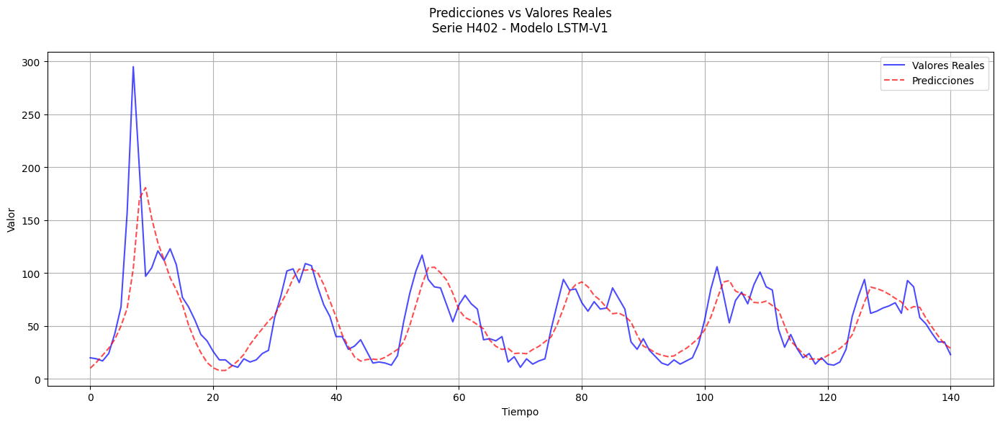


Versión 2 de LSTM
Epoch 1/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0334 - mae: 0.1432 - val_loss: 0.0161 - val_mae: 0.1040 - learning_rate: 5.0000e-04
Epoch 2/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.0200 - mae: 0.1135 - val_loss: 0.0124 - val_mae: 0.0957 - learning_rate: 5.0000e-04
Epoch 3/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.0166 - mae: 0.1031 - val_loss: 0.0095 - val_mae: 0.0822 - learning_rate: 5.0000e-04
Epoch 4/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.0099 - mae: 0.0769 - val_loss: 0.0053 - val_mae: 0.0597 - learning_rate: 5.0000e-04
Epoch 5/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.0077 - mae: 0.0595 - val_loss: 0.0046 - val_mae: 0.0564 - learning_rate: 5.0000e-04
Epoch 6/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.0062 - mae: 0.0560 - val_loss: 0.0047 - val_mae: 0.0580 - learning_rate: 5.0000e-04
Epoch 7/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.0050 - mae: 0.0526 - val_loss: 0.0044 - val

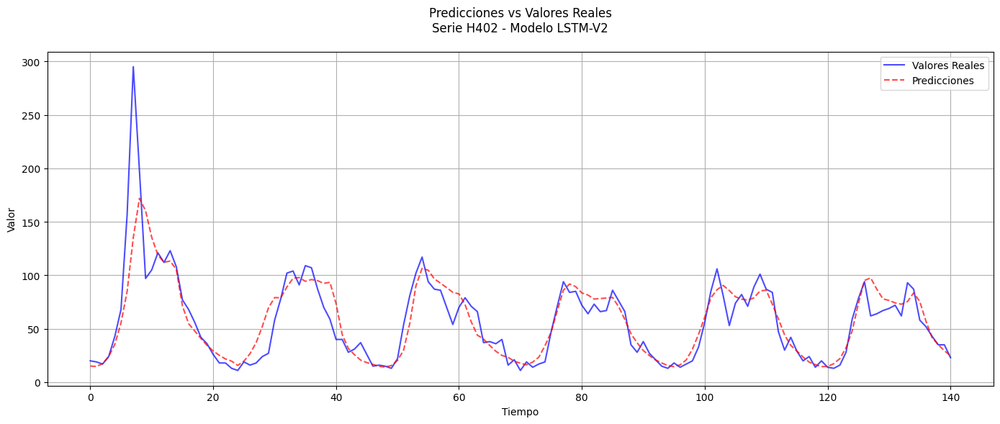


Versión 3 de LSTM
Epoch 1/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 4s 40ms/step - loss: 0.2966 - mae: 0.1530 - val_loss: 0.2735 - val_mae: 0.1119 - learning_rate: 1.0000e-04
Epoch 2/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.2735 - mae: 0.1161 - val_loss: 0.2606 - val_mae: 0.0963 - learning_rate: 1.0000e-04
Epoch 3/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.2621 - mae: 0.1093 - val_loss: 0.2542 - val_mae: 0.0939 - learning_rate: 1.0000e-04
Epoch 4/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.2557 - mae: 0.1049 - val_loss: 0.2478 - val_mae: 0.0901 - learning_rate: 1.0000e-04
Epoch 5/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.2490 - mae: 0.0991 - val_loss: 0.2417 - val_mae: 0.0867 - learning_rate: 1.0000e-04
Epoch 6/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.2419 - mae: 0.0949 - val_loss: 0.2358 - val_mae: 0.0838 - learning_rate: 1.0000e-04
Epoch 7/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.2378 - mae: 0.0949 - val_loss: 0.2299 - val

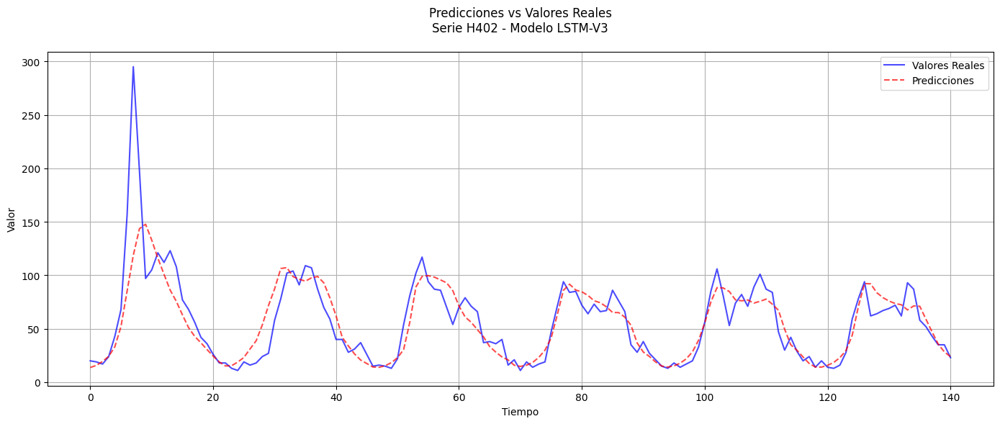


PROBANDO MODELOS CNN-LSTM

Versión 1 de CNN-LSTM
Epoch 1/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0282 - mae: 0.1262 - val_loss: 0.0120 - val_mae: 0.0933 - learning_rate: 0.0010
Epoch 2/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0172 - mae: 0.1050 - val_loss: 0.0161 - val_mae: 0.1102 - learning_rate: 0.0010
Epoch 3/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0115 - mae: 0.0875 - val_loss: 0.0072 - val_mae: 0.0751 - learning_rate: 0.0010
Epoch 4/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0089 - mae: 0.0736 - val_loss: 0.0060 - val_mae: 0.0562 - learning_rate: 0.0010
Epoch 5/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0069 - mae: 0.0630 - val_loss: 0.0038 - val_mae: 0.0502 - learning_rate: 0.0010
Epoch 6/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0053 - mae: 0.0526 - val_loss: 0.0038 - val_mae: 0.0468 - learning_rate: 0.0010
Epoch 7/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0065 - mae: 0.0541 - val_loss: 0.0037 - va

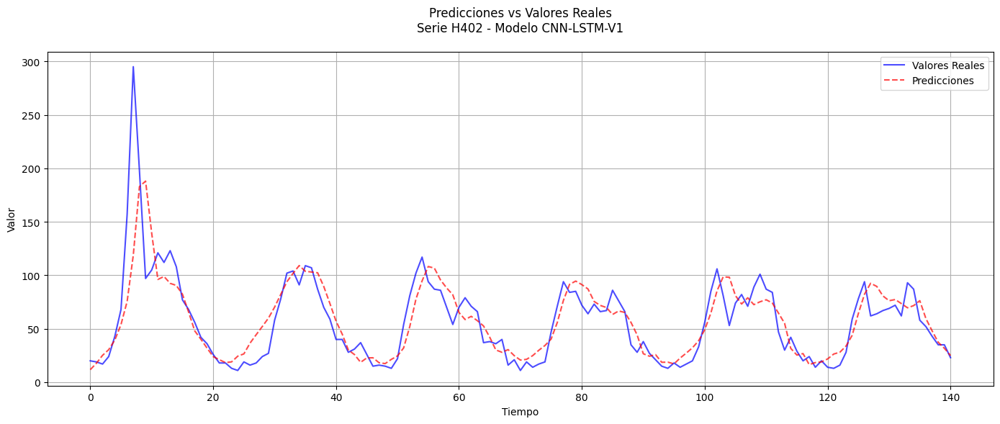


Versión 2 de CNN-LSTM
Epoch 1/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step - loss: 0.0349 - mae: 0.1431 - val_loss: 0.0148 - val_mae: 0.1035 - learning_rate: 5.0000e-04
Epoch 2/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.0185 - mae: 0.1124 - val_loss: 0.0137 - val_mae: 0.0993 - learning_rate: 5.0000e-04
Epoch 3/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0189 - mae: 0.1116 - val_loss: 0.0127 - val_mae: 0.0942 - learning_rate: 5.0000e-04
Epoch 4/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.0148 - mae: 0.1007 - val_loss: 0.0081 - val_mae: 0.0727 - learning_rate: 5.0000e-04
Epoch 5/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.0100 - mae: 0.0745 - val_loss: 0.0048 - val_mae: 0.0499 - learning_rate: 5.0000e-04
Epoch 6/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.0092 - mae: 0.0565 - val_loss: 0.0052 - val_mae: 0.0516 - learning_rate: 5.0000e-04
Epoch 7/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.0068 - mae: 0.0563 - val_loss: 0.0055 -

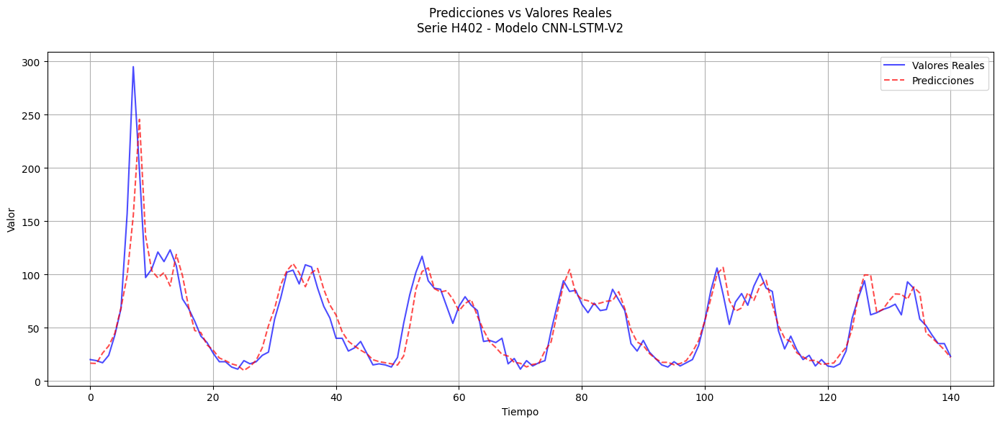


Versión 3 de CNN-LSTM
Epoch 1/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 3s 31ms/step - loss: 0.0324 - mae: 0.1332 - val_loss: 0.0142 - val_mae: 0.1012 - learning_rate: 5.0000e-04
Epoch 2/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.0185 - mae: 0.1151 - val_loss: 0.0138 - val_mae: 0.0991 - learning_rate: 5.0000e-04
Epoch 3/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.0157 - mae: 0.1057 - val_loss: 0.0124 - val_mae: 0.0939 - learning_rate: 5.0000e-04
Epoch 4/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.0142 - mae: 0.1000 - val_loss: 0.0129 - val_mae: 0.0985 - learning_rate: 5.0000e-04
Epoch 5/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0122 - mae: 0.0884 - val_loss: 0.0061 - val_mae: 0.0573 - learning_rate: 5.0000e-04
Epoch 6/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.0068 - mae: 0.0598 - val_loss: 0.0048 - val_mae: 0.0495 - learning_rate: 5.0000e-04
Epoch 7/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.0058 - mae: 0.0506 - val_loss: 0.0052 -

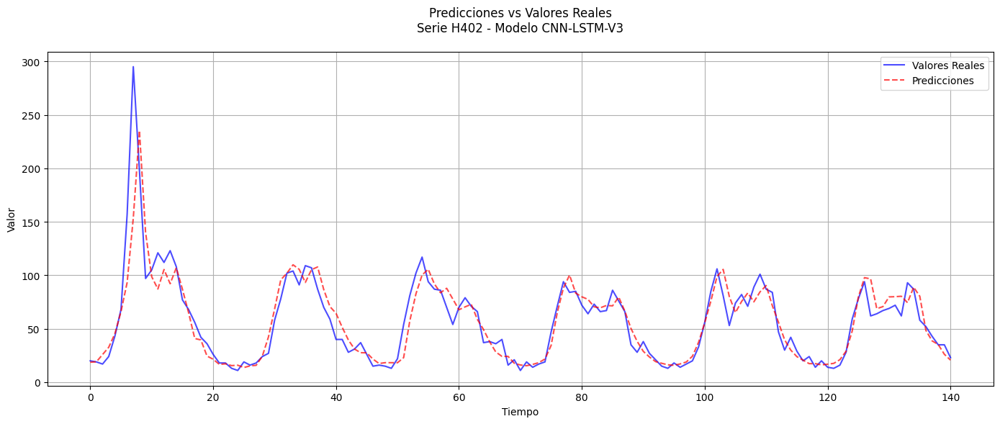


MEJOR MODELO PARA SERIE H402: CNN
RMSE: 16.5689


Análisis de la serie H44:
Longitud de la serie: 699 puntos
Fecha de inicio: 2015-07-01 12:00:00
Fecha de fin: 2015-07-30 14:00:00

Estadísticas descriptivas:
count     699.000000
mean     1040.440629
std       153.241145
min       743.000000
25%       900.000000
50%      1068.000000
75%      1166.500000
max      1334.000000
Name: H44, dtype: float64


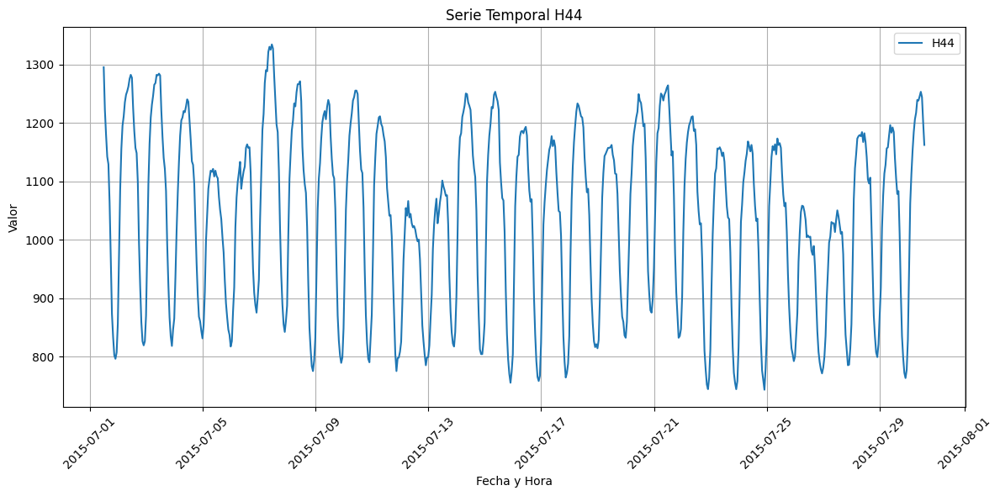

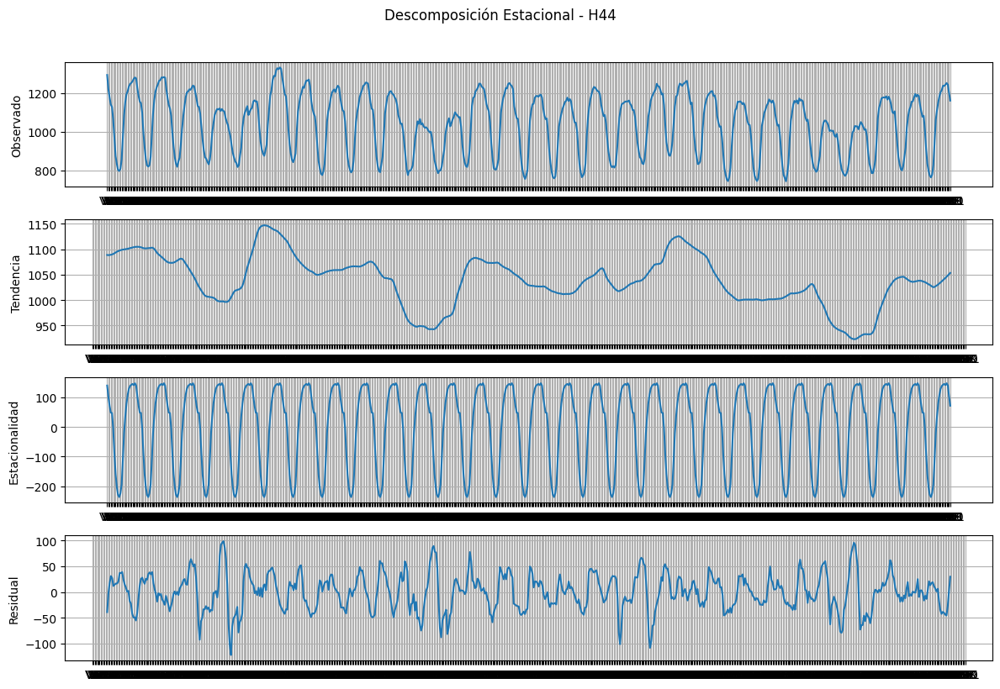


ENTRENANDO MODELOS PARA SERIE H44


PROBANDO MODELOS MLP

Versión 1 de MLP
Epoch 1/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 3s 97ms/step - loss: 0.5060 - mae: 0.2956 - val_loss: 0.3639 - val_mae: 0.0902 - learning_rate: 0.0010
Epoch 2/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.3672 - mae: 0.1270 - val_loss: 0.3229 - val_mae: 0.0775 - learning_rate: 0.0010
Epoch 3/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.3223 - mae: 0.1028 - val_loss: 0.2835 - val_mae: 0.0476 - learning_rate: 0.0010
Epoch 4/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.2857 - mae: 0.0923 - val_loss: 0.2520 - val_mae: 0.0470 - learning_rate: 0.0010
Epoch 5/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.2528 - mae: 0.0848 - val_loss: 0.2223 - val_mae: 0.0402 - learning_rate: 0.0010
Epoch 6/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.2228 - mae: 0.0773 - val_loss: 0.1961 - val_mae: 0.0392 - learning_rate: 0.0010
Epoch 7/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.1978 - mae: 0.07

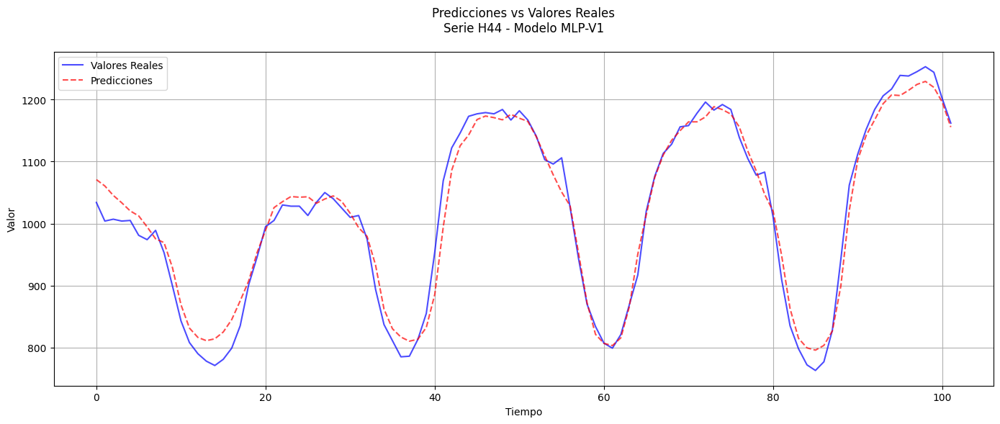


Versión 2 de MLP
Epoch 1/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 5s 163ms/step - loss: 1.4079 - mae: 0.2746 - val_loss: 1.1920 - val_mae: 0.0934 - learning_rate: 5.0000e-04
Epoch 2/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 1.1628 - mae: 0.1289 - val_loss: 1.0294 - val_mae: 0.0680 - learning_rate: 5.0000e-04
Epoch 3/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 1.0056 - mae: 0.1078 - val_loss: 0.8886 - val_mae: 0.0583 - learning_rate: 5.0000e-04
Epoch 4/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.8668 - mae: 0.0954 - val_loss: 0.7649 - val_mae: 0.0548 - learning_rate: 5.0000e-04
Epoch 5/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.7453 - mae: 0.0892 - val_loss: 0.6562 - val_mae: 0.0478 - learning_rate: 5.0000e-04
Epoch 6/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.6392 - mae: 0.0801 - val_loss: 0.5621 - val_mae: 0.0457 - learning_rate: 5.0000e-04
Epoch 7/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.5478 - mae: 0.0805 - val_loss: 0.4801 - val_mae: 

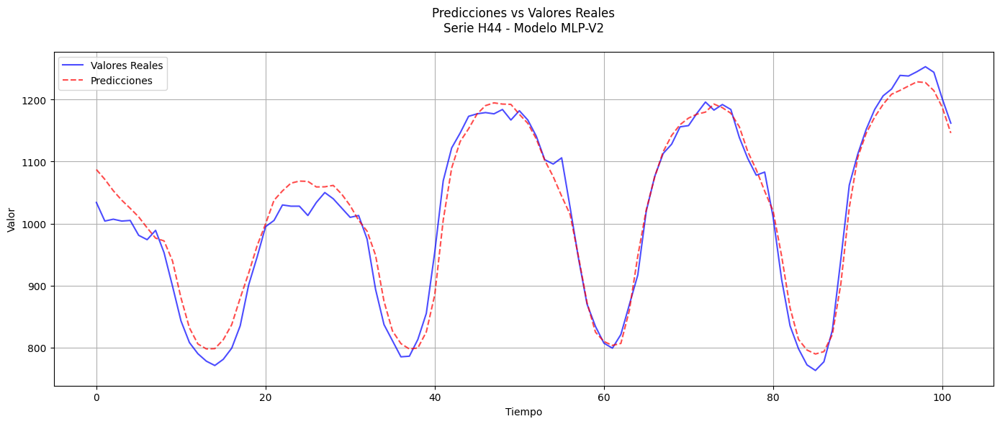


Versión 3 de MLP
Epoch 1/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 4s 145ms/step - loss: 0.9862 - mae: 0.3269 - val_loss: 0.8366 - val_mae: 0.1326 - learning_rate: 1.0000e-04
Epoch 2/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.9542 - mae: 0.3063 - val_loss: 0.8185 - val_mae: 0.1025 - learning_rate: 1.0000e-04
Epoch 3/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.8937 - mae: 0.2436 - val_loss: 0.8013 - val_mae: 0.0785 - learning_rate: 1.0000e-04
Epoch 4/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.8753 - mae: 0.2390 - val_loss: 0.7937 - val_mae: 0.0928 - learning_rate: 1.0000e-04
Epoch 5/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.8530 - mae: 0.2217 - val_loss: 0.7804 - val_mae: 0.0875 - learning_rate: 1.0000e-04
Epoch 6/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.8293 - mae: 0.2006 - val_loss: 0.7664 - val_mae: 0.0818 - learning_rate: 1.0000e-04
Epoch 7/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.8158 - mae: 0.1985 - val_loss: 0.7519 - val_mae: 

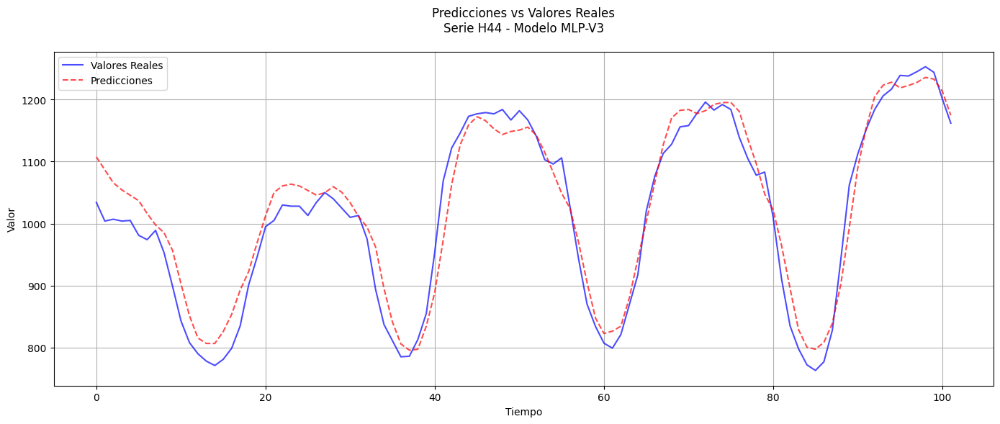


PROBANDO MODELOS CNN

Versión 1 de CNN
Epoch 1/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 4s 62ms/step - loss: 0.1078 - mae: 0.2565 - val_loss: 0.0184 - val_mae: 0.1236 - learning_rate: 0.0010
Epoch 2/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0205 - mae: 0.1222 - val_loss: 0.0079 - val_mae: 0.0761 - learning_rate: 0.0010
Epoch 3/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0084 - mae: 0.0719 - val_loss: 0.0052 - val_mae: 0.0587 - learning_rate: 0.0010
Epoch 4/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0058 - mae: 0.0588 - val_loss: 0.0034 - val_mae: 0.0449 - learning_rate: 0.0010
Epoch 5/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0044 - mae: 0.0507 - val_loss: 0.0035 - val_mae: 0.0477 - learning_rate: 0.0010
Epoch 6/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0038 - mae: 0.0455 - val_loss: 0.0039 - val_mae: 0.0501 - learning_rate: 0.0010
Epoch 7/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0038 - mae: 0.0456 - val_loss: 0.0022 - val_mae: 0.0

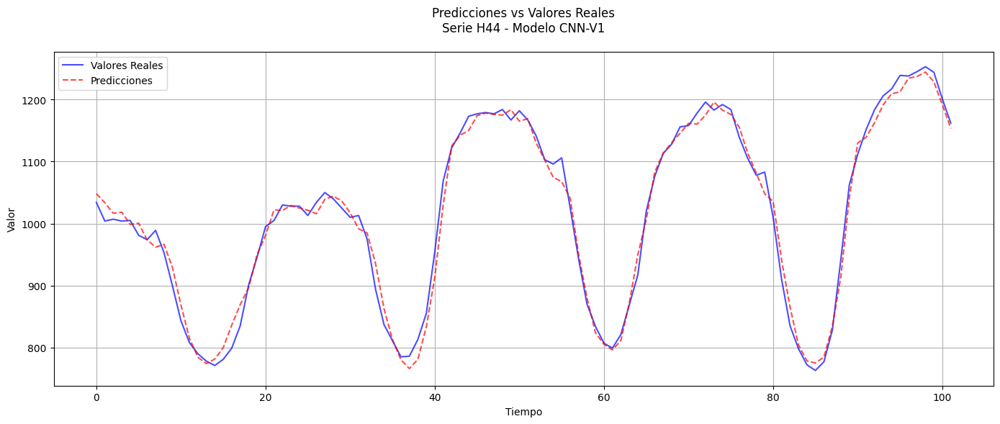


Versión 2 de CNN
Epoch 1/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 4s 123ms/step - loss: 0.1802 - mae: 0.3546 - val_loss: 0.0667 - val_mae: 0.1833 - learning_rate: 5.0000e-04
Epoch 2/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0532 - mae: 0.1886 - val_loss: 0.0181 - val_mae: 0.1021 - learning_rate: 5.0000e-04
Epoch 3/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0235 - mae: 0.1252 - val_loss: 0.0072 - val_mae: 0.0682 - learning_rate: 5.0000e-04
Epoch 4/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0188 - mae: 0.1057 - val_loss: 0.0054 - val_mae: 0.0597 - learning_rate: 5.0000e-04
Epoch 5/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0122 - mae: 0.0862 - val_loss: 0.0047 - val_mae: 0.0545 - learning_rate: 5.0000e-04
Epoch 6/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0113 - mae: 0.0835 - val_loss: 0.0042 - val_mae: 0.0516 - learning_rate: 5.0000e-04
Epoch 7/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0102 - mae: 0.0790 - val_loss: 0.0047 - val_mae: 

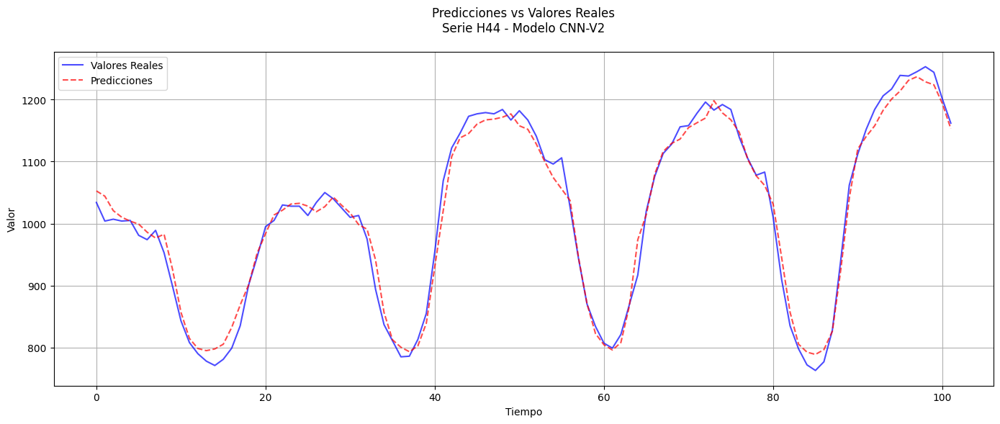


Versión 3 de CNN
Epoch 1/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 3s 106ms/step - loss: 2.0234 - mae: 0.4589 - val_loss: 1.7619 - val_mae: 0.2626 - learning_rate: 1.0000e-04
Epoch 2/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 1.7523 - mae: 0.2640 - val_loss: 1.6511 - val_mae: 0.1966 - learning_rate: 1.0000e-04
Epoch 3/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 1.6425 - mae: 0.2034 - val_loss: 1.5654 - val_mae: 0.1617 - learning_rate: 1.0000e-04
Epoch 4/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 1.5570 - mae: 0.1791 - val_loss: 1.4832 - val_mae: 0.1368 - learning_rate: 1.0000e-04
Epoch 5/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 1.4751 - mae: 0.1530 - val_loss: 1.4062 - val_mae: 0.1166 - learning_rate: 1.0000e-04
Epoch 6/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 1.4016 - mae: 0.1415 - val_loss: 1.3342 - val_mae: 0.0993 - learning_rate: 1.0000e-04
Epoch 7/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 1.3272 - mae: 0.1304 - val_loss: 1.2636 - val_mae: 

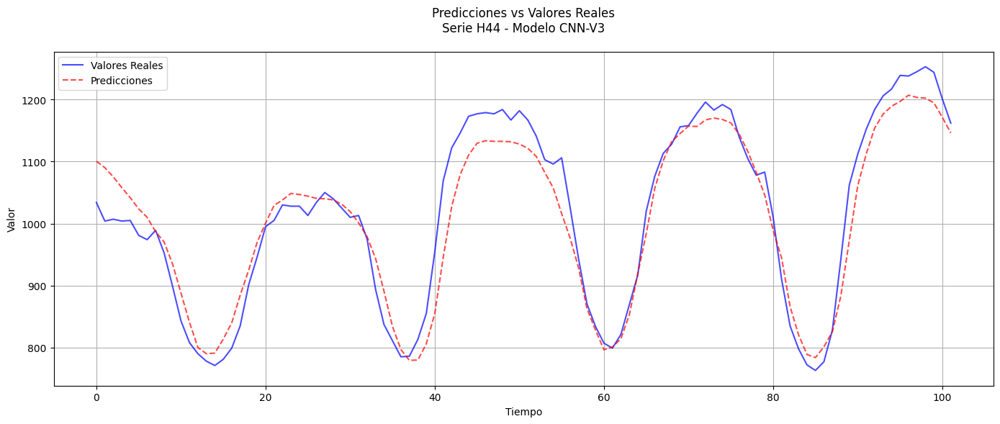


PROBANDO MODELOS LSTM

Versión 1 de LSTM
Epoch 1/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - loss: 0.1491 - mae: 0.3258 - val_loss: 0.0586 - val_mae: 0.2121 - learning_rate: 0.0010
Epoch 2/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0585 - mae: 0.2135 - val_loss: 0.0498 - val_mae: 0.1956 - learning_rate: 0.0010
Epoch 3/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0532 - mae: 0.2062 - val_loss: 0.0420 - val_mae: 0.1783 - learning_rate: 0.0010
Epoch 4/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.0408 - mae: 0.1754 - val_loss: 0.0329 - val_mae: 0.1610 - learning_rate: 0.0010
Epoch 5/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.0348 - mae: 0.1606 - val_loss: 0.0206 - val_mae: 0.1247 - learning_rate: 0.0010
Epoch 6/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0209 - mae: 0.1224 - val_loss: 0.0123 - val_mae: 0.0809 - learning_rate: 0.0010
Epoch 7/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0137 - mae: 0.0960 - val_loss: 0.0104 - val_mae:

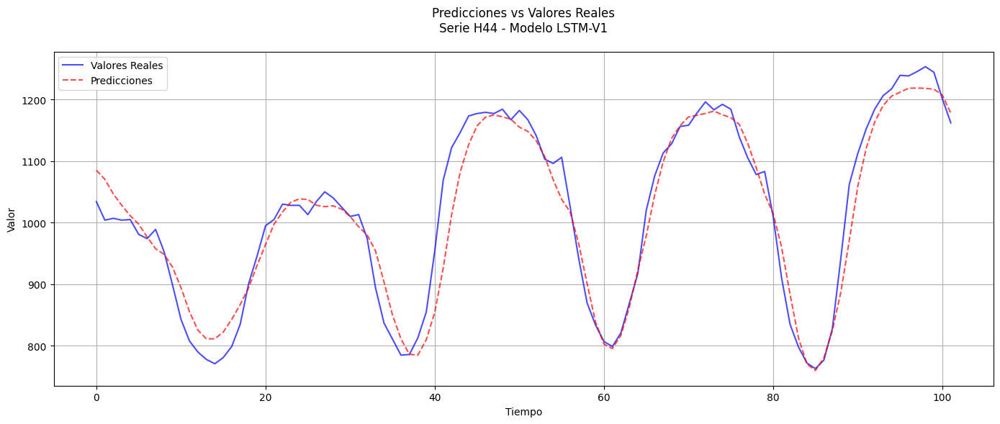


Versión 2 de LSTM
Epoch 1/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.2281 - mae: 0.4115 - val_loss: 0.0955 - val_mae: 0.2445 - learning_rate: 5.0000e-04
Epoch 2/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0906 - mae: 0.2564 - val_loss: 0.0681 - val_mae: 0.2295 - learning_rate: 5.0000e-04
Epoch 3/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0702 - mae: 0.2323 - val_loss: 0.0613 - val_mae: 0.2158 - learning_rate: 5.0000e-04
Epoch 4/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0636 - mae: 0.2256 - val_loss: 0.0614 - val_mae: 0.1969 - learning_rate: 5.0000e-04
Epoch 5/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0531 - mae: 0.1954 - val_loss: 0.0457 - val_mae: 0.1683 - learning_rate: 5.0000e-04
Epoch 6/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0408 - mae: 0.1736 - val_loss: 0.0363 - val_mae: 0.1348 - learning_rate: 5.0000e-04
Epoch 7/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0214 - mae: 0.1173 - val_loss: 0.0106 - val

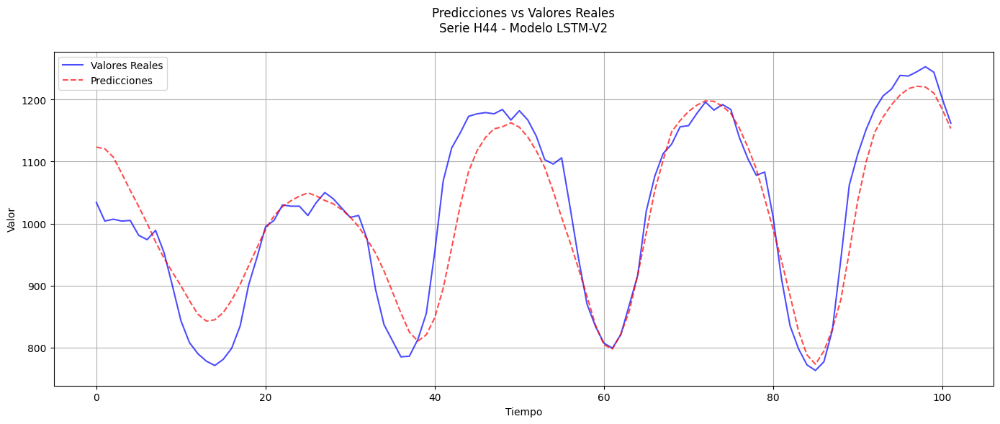


Versión 3 de LSTM
Epoch 1/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 4s 53ms/step - loss: 0.4914 - mae: 0.4318 - val_loss: 0.3670 - val_mae: 0.3055 - learning_rate: 1.0000e-04
Epoch 2/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.3714 - mae: 0.3051 - val_loss: 0.3033 - val_mae: 0.2257 - learning_rate: 1.0000e-04
Epoch 3/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.3086 - mae: 0.2330 - val_loss: 0.2970 - val_mae: 0.2026 - learning_rate: 1.0000e-04
Epoch 4/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.2958 - mae: 0.2065 - val_loss: 0.2879 - val_mae: 0.1948 - learning_rate: 1.0000e-04
Epoch 5/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.2900 - mae: 0.2048 - val_loss: 0.2805 - val_mae: 0.1900 - learning_rate: 1.0000e-04
Epoch 6/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.2797 - mae: 0.1924 - val_loss: 0.2745 - val_mae: 0.1808 - learning_rate: 1.0000e-04
Epoch 7/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.2761 - mae: 0.1909 - val_loss: 0.2678 - val

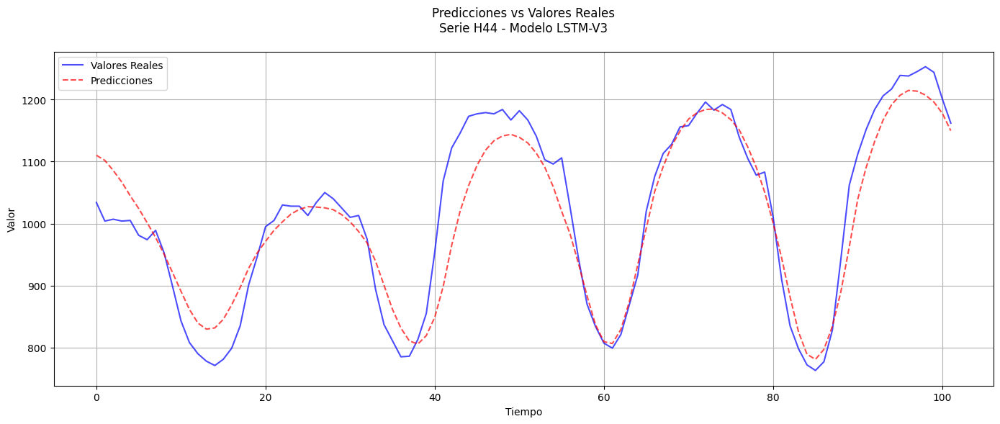


PROBANDO MODELOS CNN-LSTM

Versión 1 de CNN-LSTM
Epoch 1/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1375 - mae: 0.3153 - val_loss: 0.0641 - val_mae: 0.2294 - learning_rate: 0.0010
Epoch 2/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.0617 - mae: 0.2183 - val_loss: 0.0564 - val_mae: 0.1924 - learning_rate: 0.0010
Epoch 3/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.0487 - mae: 0.1908 - val_loss: 0.0401 - val_mae: 0.1666 - learning_rate: 0.0010
Epoch 4/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.0401 - mae: 0.1715 - val_loss: 0.0316 - val_mae: 0.1400 - learning_rate: 0.0010
Epoch 5/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.0275 - mae: 0.1399 - val_loss: 0.0159 - val_mae: 0.0978 - learning_rate: 0.0010
Epoch 6/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.0205 - mae: 0.1214 - val_loss: 0.0082 - val_mae: 0.0754 - learning_rate: 0.0010
Epoch 7/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0140 - mae: 0.0961 - val_loss: 0.0091

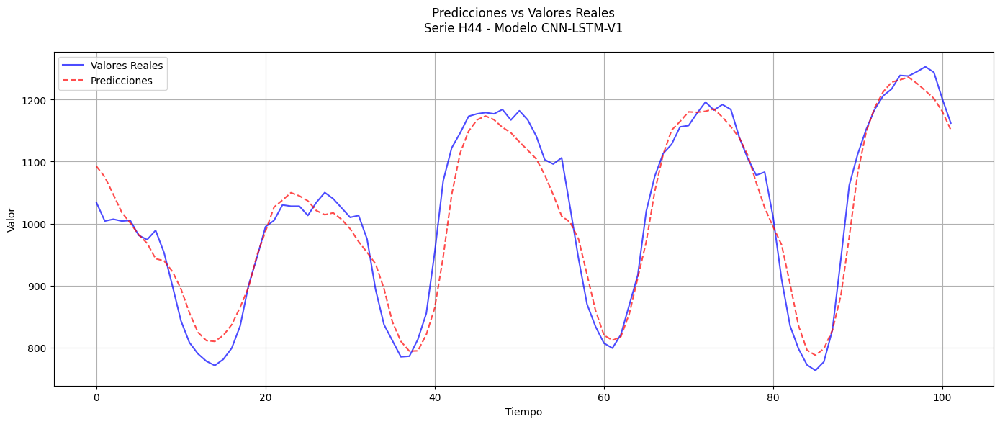


Versión 2 de CNN-LSTM
Epoch 1/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 3s 41ms/step - loss: 0.2565 - mae: 0.4406 - val_loss: 0.0885 - val_mae: 0.2260 - learning_rate: 5.0000e-04
Epoch 2/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0865 - mae: 0.2419 - val_loss: 0.0663 - val_mae: 0.2268 - learning_rate: 5.0000e-04
Epoch 3/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0655 - mae: 0.2231 - val_loss: 0.0658 - val_mae: 0.2061 - learning_rate: 5.0000e-04
Epoch 4/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.0638 - mae: 0.2141 - val_loss: 0.0580 - val_mae: 0.1946 - learning_rate: 5.0000e-04
Epoch 5/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0543 - mae: 0.1917 - val_loss: 0.0485 - val_mae: 0.1851 - learning_rate: 5.0000e-04
Epoch 6/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0483 - mae: 0.1885 - val_loss: 0.0397 - val_mae: 0.1554 - learning_rate: 5.0000e-04
Epoch 7/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0397 - mae: 0.1693 - val_loss: 0.0298 -

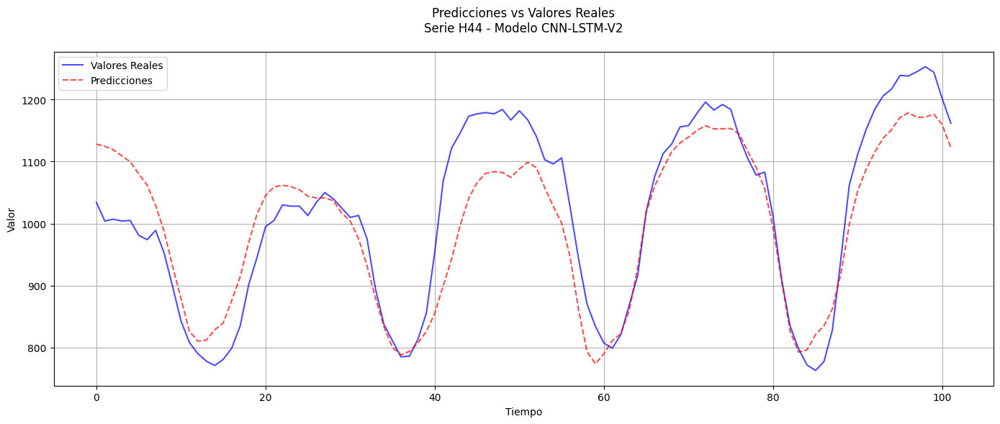


Versión 3 de CNN-LSTM
Epoch 1/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 3s 41ms/step - loss: 0.2521 - mae: 0.4373 - val_loss: 0.0916 - val_mae: 0.2194 - learning_rate: 5.0000e-04
Epoch 2/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.0816 - mae: 0.2264 - val_loss: 0.0630 - val_mae: 0.2284 - learning_rate: 5.0000e-04
Epoch 3/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.0716 - mae: 0.2338 - val_loss: 0.0636 - val_mae: 0.1966 - learning_rate: 5.0000e-04
Epoch 4/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.0690 - mae: 0.2274 - val_loss: 0.0578 - val_mae: 0.1880 - learning_rate: 5.0000e-04
Epoch 5/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.0594 - mae: 0.2028 - val_loss: 0.0464 - val_mae: 0.1824 - learning_rate: 5.0000e-04
Epoch 6/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.0498 - mae: 0.1876 - val_loss: 0.0355 - val_mae: 0.1574 - learning_rate: 5.0000e-04
Epoch 7/100
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.0406 - mae: 0.1678 - val_loss: 0.0202 -

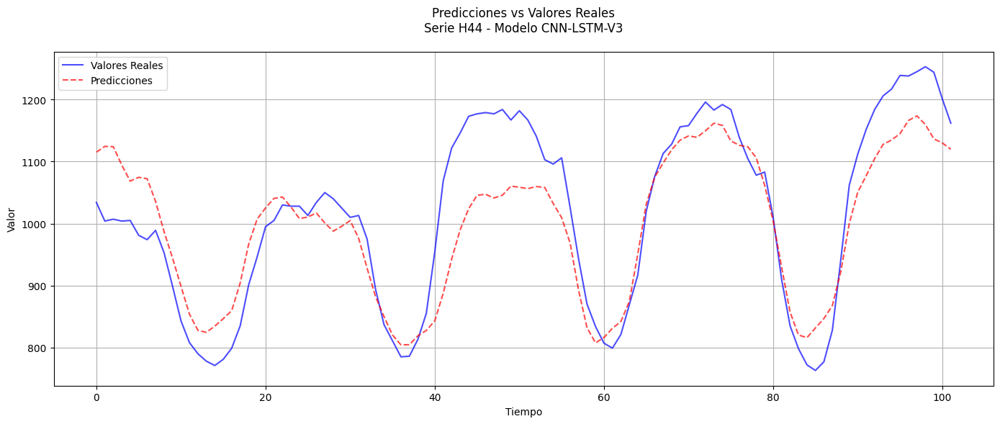


MEJOR MODELO PARA SERIE H44: CNN
RMSE: 17.4819


Comparación de Modelos entre Series:
Series      Modelo      RMSE       MAE     MAPE       R2
  H115      MLP-V3 17.478414 12.133957 0.031665 0.939434
  H115      CNN-V1 18.335993 12.378109 0.032942 0.933345
  H115     LSTM-V1 19.170235 14.253898 0.037229 0.927141
  H115 CNN-LSTM-V1 19.577753 14.185061 0.037133 0.924011
  H243      MLP-V3  0.275703  0.176114 0.009413 0.992299
  H243      CNN-V1  0.203294  0.157755 0.008138 0.995813
  H243     LSTM-V2  0.585663  0.443900 0.022239 0.965251
  H243 CNN-LSTM-V2  0.291503  0.245384 0.012216 0.991391
  H384      MLP-V2 12.539702  9.193479 0.175603 0.879810
  H384      CNN-V1 12.418137  9.198060 0.178097 0.882129
  H384     LSTM-V3 13.823354  9.697894 0.180435 0.853944
  H384 CNN-LSTM-V3 12.607819  9.046960 0.172135 0.878501
  H402      MLP-V2 18.582105 10.267001 0.199010 0.782016
  H402      CNN-V1 16.568870  9.363840 0.179969 0.826691
  H402     LSTM-V2 19.994790 11.122630 0.224892 0.747612
 

<Figure size 1400x800 with 0 Axes>

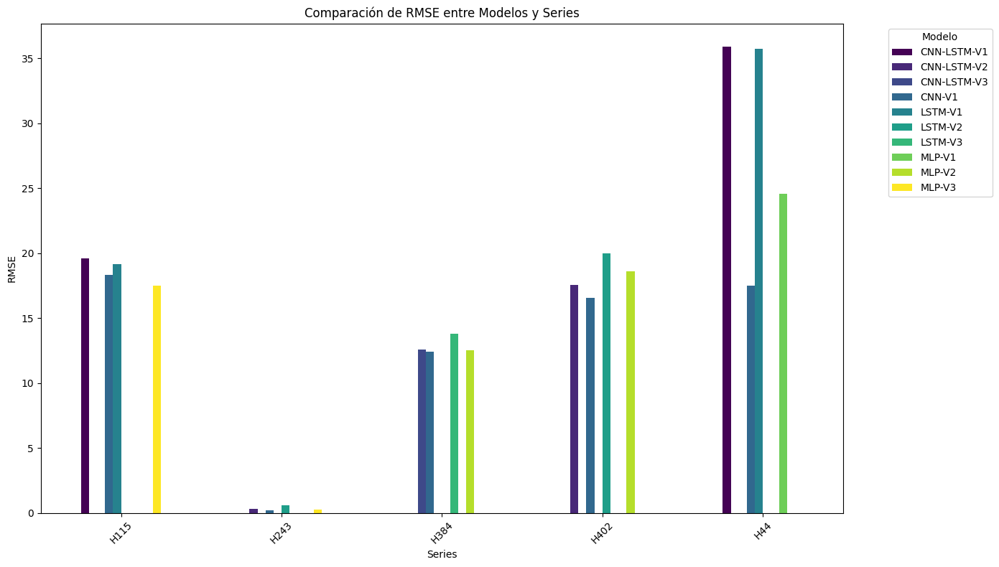

In [19]:
# Inicializar el analizador
analyzer = TimeSeriesAnalyzer(
   train_path="/content/drive/MyDrive/Hourly-train.csv",
   info_path="/content/drive/MyDrive/m4_info.csv"
                              )

# Ejecutar todos los modelos para todas las series
results = analyzer.run_all_series(n_steps=24, epochs=100, batch_size=32)

# Comparar resultados entre modelos y series
comparison = analyzer.compare_models_across_series()

## Optimización con optuna

In [3]:
pip install optuna

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 383.6/383.6 kB 7.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 231.9/231.9 kB 16.4 MB/s eta 0:00:00


In [32]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, mean_absolute_error, mean_absolute_percentage_error
from sklearn.preprocessing import MinMaxScaler
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout, Conv1D, MaxPooling1D, Flatten, LSTM, Bidirectional
from tensorflow.keras.optimizers import Adam
import optuna
from optuna.samplers import TPESampler

class TimeSeriesExamSolver:
    def __init__(self, train_path, info_path):
        """
        Inicializa el solucionador del examen con las rutas de los datos.

        Parameters:
        train_path : str
            Ruta al archivo Hourly-train.csv
        info_path : str
            Ruta al archivo m4_info.csv
        """
        # Cargar datos
        self.hourly_train = pd.read_csv(train_path)
        self.m4_info = pd.read_csv(info_path)

        # Series asignadas
        self.series_ids = ['H115', 'H243', 'H384', 'H402', 'H44']

        # Preparar datos
        self.prepare_data()

        # Modelos
        self.models = {}
        self.histories = {}
        self.scalers = {}

    def prepare_data(self):
        """
        Prepara los datos para el análisis, filtrando las series asignadas.
        """
        # Filtrar series asignadas
        self.series_data = self.hourly_train[self.hourly_train['V1'].isin(self.series_ids)].set_index('V1')
        self.series_info = self.m4_info[self.m4_info['M4id'].isin(self.series_ids)].set_index('M4id')

        # Convertir a formato datetime
        self.series_info['StartingDate'] = pd.to_datetime(self.series_info['StartingDate'], dayfirst=True)

        # Convertir a formato largo (time series)
        self.series_long = self.series_data.T
        self.series_long.columns = self.series_data.index
        self.series_long = self.series_long.drop(index=self.series_long.index[0])

    def visualize_series(self, series_id):
        """
        Visualiza una serie de tiempo específica.

        Parameters:
        series_id : str
            ID de la serie a visualizar (ej. 'H115')
        """
        if series_id not in self.series_ids:
            raise ValueError(f"Series ID {series_id} not in assigned series")

        plt.figure(figsize=(12, 6))
        plt.plot(self.series_long[series_id].dropna(), label=series_id)
        plt.title(f"Serie Temporal {series_id}")
        plt.xlabel("Tiempo")
        plt.ylabel("Valor")
        plt.legend()
        plt.grid(True)
        plt.show()

    def preprocess_series(self, series_id, n_steps=24, test_size=0.2):
        """
        Preprocesa una serie para modelado, incluyendo escalado y creación de ventanas.

        Parameters:
        series_id : str
            ID de la serie a preprocesar
        n_steps : int
            Número de pasos temporales a usar como ventana
        test_size : float
            Porcentaje de datos a usar como prueba

        Returns:
        tuple
            (X_train, y_train, X_test, y_test, scaler)
        """
        # Obtener la serie y eliminar NaNs
        series = self.series_long[series_id].dropna().values.reshape(-1, 1)

        # Escalar los datos
        scaler = MinMaxScaler(feature_range=(0, 1))
        scaled = scaler.fit_transform(series)

        # Crear ventanas temporales
        X, y = [], []
        for i in range(len(scaled) - n_steps):
            X.append(scaled[i:i+n_steps, 0])
            y.append(scaled[i+n_steps, 0])

        X, y = np.array(X), np.array(y)

        # Dividir en train y test
        split = int((1 - test_size) * len(X))
        X_train, X_test = X[:split], X[split:]
        y_train, y_test = y[:split], y[split:]

        # Reshape para modelos (samples, timesteps, features)
        X_train = X_train.reshape((X_train.shape[0], X_train.shape[1], 1))
        X_test = X_test.reshape((X_test.shape[0], X_test.shape[1], 1))

        return X_train, y_train, X_test, y_test, scaler

    def build_mlp(self, input_shape, n_units=64, dropout_rate=0.2):
        """
        Construye un modelo MLP para series de tiempo.

        Parameters:
        input_shape : tuple
            Forma de los datos de entrada
        n_units : int
            Número de unidades en las capas ocultas
        dropout_rate : float
            Tasa de dropout

        Returns:
        keras.Model
            Modelo MLP compilado
        """
        model = Sequential([
            Flatten(input_shape=input_shape),
            Dense(n_units, activation='relu'),
            Dropout(dropout_rate),
            Dense(n_units//2, activation='relu'),
            Dense(1)
        ])

        model.compile(optimizer=Adam(), loss='mse')
        return model

    def build_cnn(self, input_shape, filters=64, kernel_size=3, pool_size=2):
        """
        Construye un modelo CNN para series de tiempo.

        Parameters:
        input_shape : tuple
            Forma de los datos de entrada
        filters : int
            Número de filtros en la capa convolucional
        kernel_size : int
            Tamaño del kernel convolucional
        pool_size : int
            Tamaño del pooling

        Returns:
        keras.Model
            Modelo CNN compilado
        """
        model = Sequential([
            Conv1D(filters=filters, kernel_size=kernel_size, activation='relu', input_shape=input_shape),
            MaxPooling1D(pool_size=pool_size),
            Flatten(),
            Dense(50, activation='relu'),
            Dense(1)
        ])

        model.compile(optimizer=Adam(), loss='mse')
        return model

    def build_lstm(self, input_shape, units=50):
        """
        Construye un modelo LSTM para series de tiempo.

        Parameters:
        input_shape : tuple
            Forma de los datos de entrada
        units : int
            Número de unidades LSTM

        Returns:
        keras.Model
            Modelo LSTM compilado
        """
        model = Sequential([
            LSTM(units, input_shape=input_shape),
            Dense(1)
        ])

        model.compile(optimizer=Adam(), loss='mse')
        return model

    def build_cnn_lstm(self, input_shape, cnn_filters=64, lstm_units=50):
        """
        Construye un modelo CNN-LSTM híbrido para series de tiempo.

        Parameters:
        input_shape : tuple
            Forma de los datos de entrada
        cnn_filters : int
            Número de filtros en la capa CNN
        lstm_units : int
            Número de unidades LSTM

        Returns:
        keras.Model
            Modelo CNN-LSTM compilado
        """
        model = Sequential([
            Conv1D(filters=cnn_filters, kernel_size=3, activation='relu', input_shape=input_shape),
            MaxPooling1D(pool_size=2),
            LSTM(lstm_units),
            Dense(1)
        ])

        model.compile(optimizer=Adam(), loss='mse')
        return model

    def train_model(self, model, X_train, y_train, X_val, y_val, epochs=100, batch_size=32, verbose=0):
        """
        Entrena un modelo y guarda su historial.

        Parameters:
        model : keras.Model
            Modelo a entrenar
        X_train, y_train : array
            Datos de entrenamiento
        X_val, y_val : array
            Datos de validación
        epochs : int
            Número de épocas
        batch_size : int
            Tamaño del batch
        verbose : int
            Verbosidad

        Returns:
        keras.History
            Historial de entrenamiento
        """
        history = model.fit(
            X_train, y_train,
            validation_data=(X_val, y_val),
            epochs=epochs,
            batch_size=batch_size,
            verbose=verbose
        )
        return history

    def evaluate_model(self, model, X_test, y_test, scaler, series_id):
        """
        Evalúa un modelo en los datos de prueba y muestra métricas.

        Parameters:
        model : keras.Model
            Modelo a evaluar
        X_test, y_test : array
            Datos de prueba
        scaler : sklearn scaler
            Escalador usado en el preprocesamiento
        series_id : str
            ID de la serie para identificación
        """
        # Predecir
        y_pred = model.predict(X_test)

        # Invertir escalado
        y_test_inv = scaler.inverse_transform(y_test.reshape(-1, 1))
        y_pred_inv = scaler.inverse_transform(y_pred.reshape(-1, 1))

        # Calcular métricas
        mse = mean_squared_error(y_test_inv, y_pred_inv)
        mae = mean_absolute_error(y_test_inv, y_pred_inv)
        mape = mean_absolute_percentage_error(y_test_inv, y_pred_inv)

        print(f"\nEvaluación para serie {series_id}:")
        print(f"MSE: {mse:.4f}")
        print(f"MAE: {mae:.4f}")
        print(f"MAPE: {mape:.4f}")

        # Graficar
        plt.figure(figsize=(12, 6))
        plt.plot(y_test_inv, label='Real')
        plt.plot(y_pred_inv, label='Predicción')
        plt.title(f"Predicciones vs Valores Reales - {series_id}")
        plt.legend()
        plt.grid(True)
        plt.show()

        return mse, mae, mape

    def objective(self, trial, model_type, X_train, y_train, X_val, y_val):
        """
        Función objetivo para Optuna.
        """
        # Espacio de búsqueda de hiperparámetros
        if model_type == 'mlp':
            n_units = trial.suggest_int('n_units', 32, 256)
            dropout_rate = trial.suggest_float('dropout_rate', 0.1, 0.5)
            learning_rate = trial.suggest_float('learning_rate', 1e-5, 1e-2, log=True)

            model = self.build_mlp(
                input_shape=X_train.shape[1:],
                n_units=n_units,
                dropout_rate=dropout_rate
            )

        elif model_type == 'cnn':
            filters = trial.suggest_int('filters', 32, 128)
            kernel_size = trial.suggest_int('kernel_size', 2, 5)
            learning_rate = trial.suggest_float('learning_rate', 1e-5, 1e-2, log=True)

            model = self.build_cnn(
                input_shape=X_train.shape[1:],
                filters=filters,
                kernel_size=kernel_size
            )

        elif model_type == 'lstm':
            units = trial.suggest_int('units', 32, 128)
            learning_rate = trial.suggest_float('learning_rate', 1e-5, 1e-2, log=True)

            model = self.build_lstm(
                input_shape=X_train.shape[1:],
                units=units
            )

        elif model_type == 'cnn_lstm':
            cnn_filters = trial.suggest_int('cnn_filters', 32, 128)
            lstm_units = trial.suggest_int('lstm_units', 32, 128)
            learning_rate = trial.suggest_float('learning_rate', 1e-5, 1e-2, log=True)

            model = self.build_cnn_lstm(
                input_shape=X_train.shape[1:],
                cnn_filters=cnn_filters,
                lstm_units=lstm_units
            )

        # Compilar con learning rate óptimo
        model.compile(optimizer=Adam(learning_rate=learning_rate), loss='mse')

        # Entrenamiento temprano
        early_stopping = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=5)

        history = model.fit(
            X_train, y_train,
            validation_data=(X_val, y_val),
            epochs=100,
            batch_size=32,
            callbacks=[early_stopping],
            verbose=0
        )

        return min(history.history['val_loss'])

    def optimize_model(self, model_type, X_train, y_train, X_val, y_val, n_trials=50):
        """
        Optimiza un modelo usando Optuna.

        Parameters:
        model_type : str
            Tipo de modelo ('mlp', 'cnn', 'lstm', 'cnn_lstm')
        X_train, y_train : array
            Datos de entrenamiento
        X_val, y_val : array
            Datos de validación
        n_trials : int
            Número de pruebas para Optuna

        Returns:
        dict
            Mejores hiperparámetros encontrados
        """
        study = optuna.create_study(direction='minimize', sampler=TPESampler())
        study.optimize(
            lambda trial: self.objective(trial, model_type, X_train, y_train, X_val, y_val),
            n_trials=n_trials
        )

        print(f"\nMejores hiperparámetros para {model_type}:")
        print(study.best_params)

        return study.best_params

    def run_experiment(self, series_id, n_steps=24, test_size=0.2, n_trials=20):
        """
        Ejecuta el experimento completo para una serie.

        Parameters:
        series_id : str
            ID de la serie a analizar
        n_steps : int
            Número de pasos temporales a usar como ventana
        test_size : float
            Porcentaje de datos a usar como prueba
        n_trials : int
            Número de pruebas para la optimización con Optuna
        """
        print(f"\n{'='*50}")
        print(f"INICIANDO EXPERIMENTO PARA SERIE {series_id}")
        print(f"{'='*50}\n")

        # 1. Análisis de datos
        print("1. Análisis de datos:")
        self.visualize_series(series_id)

        # 2. División de datos
        print("\n2. División de datos:")
        X_train, y_train, X_test, y_test, scaler = self.preprocess_series(series_id, n_steps, test_size)

        # Dividir train en train y val
        val_size = int(0.15 * len(X_train))
        X_train, X_val = X_train[:-val_size], X_train[-val_size:]
        y_train, y_val = y_train[:-val_size], y_train[-val_size:]

        print(f"Train shape: {X_train.shape}")
        print(f"Val shape: {X_val.shape}")
        print(f"Test shape: {X_test.shape}")

        # Modelos a probar
        model_types = ['mlp', 'cnn', 'lstm', 'cnn_lstm']
        results = {}

        for model_type in model_types:
            print(f"\n{'='*30}")
            print(f"Modelo: {model_type.upper()}")
            print(f"{'='*30}")

            # 3. Creación y optimización de modelos
            print("\n3. Optimización con Optuna:")
            best_params = self.optimize_model(model_type, X_train, y_train, X_val, y_val, n_trials)

            # Construir modelo con mejores parámetros
            if model_type == 'mlp':
                model = self.build_mlp(
                    input_shape=X_train.shape[1:],
                    n_units=best_params['n_units'],
                    dropout_rate=best_params['dropout_rate']
                )
                model.compile(optimizer=Adam(learning_rate=best_params['learning_rate']), loss='mse')

            elif model_type == 'cnn':
                model = self.build_cnn(
                    input_shape=X_train.shape[1:],
                    filters=best_params['filters'],
                    kernel_size=best_params['kernel_size']
                )
                model.compile(optimizer=Adam(learning_rate=best_params['learning_rate']), loss='mse')

            elif model_type == 'lstm':
                model = self.build_lstm(
                    input_shape=X_train.shape[1:],
                    units=best_params['units']
                )
                model.compile(optimizer=Adam(learning_rate=best_params['learning_rate']), loss='mse')

            elif model_type == 'cnn_lstm':
                model = self.build_cnn_lstm(
                    input_shape=X_train.shape[1:],
                    cnn_filters=best_params['cnn_filters'],
                    lstm_units=best_params['lstm_units']
                )
                model.compile(optimizer=Adam(learning_rate=best_params['learning_rate']), loss='mse')

            # Entrenar modelo final
            print("\nEntrenando modelo final...")
            history = self.train_model(
                model, X_train, y_train, X_val, y_val,
                epochs=200, batch_size=32, verbose=1
            )

            # 4. Evaluación del modelo
            print("\n4. Evaluación del modelo:")
            mse, mae, mape = self.evaluate_model(model, X_test, y_test, scaler, series_id)

            # Guardar resultados
            results[model_type] = {
                'model': model,
                'history': history,
                'metrics': {'mse': mse, 'mae': mae, 'mape': mape},
                'params': best_params
            }

        # Guardar todo para esta serie
        self.models[series_id] = results
        return results

    def run_all_series(self):
        """
        Ejecuta el experimento para todas las series asignadas.
        """
        all_results = {}
        for series_id in self.series_ids:
            results = self.run_experiment(series_id)
            all_results[series_id] = results
        return all_results

In [33]:
solver = TimeSeriesExamSolver(
    train_path="/content/drive/MyDrive/Hourly-train.csv",
    info_path="/content/drive/MyDrive/m4_info.csv"
)

<ipython-input-32-97940eaa6402>:48: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  self.series_info['StartingDate'] = pd.to_datetime(self.series_info['StartingDate'], dayfirst=True)



INICIANDO EXPERIMENTO PARA SERIE H115

1. Análisis de datos:


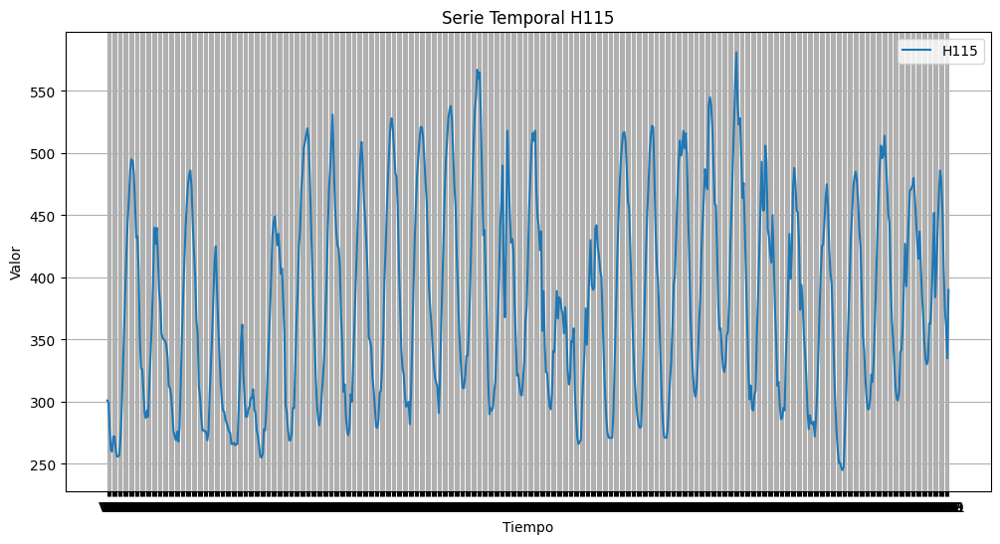

[I 2025-04-05 06:13:22,757] A new study created in memory with name: no-name-67fabb3e-1f66-4981-b682-afad4f0c85c1



2. División de datos:
Train shape: (459, 24, 1)
Val shape: (81, 24, 1)
Test shape: (135, 24, 1)

Modelo: MLP

3. Optimización con Optuna:


/usr/local/lib/python3.11/dist-packages/keras/src/layers/reshaping/flatten.py:37: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
[I 2025-04-05 06:13:28,794] Trial 0 finished with value: 0.006430513225495815 and parameters: {'n_units': 217, 'dropout_rate': 0.40889158391825586, 'learning_rate': 9.173520207070623e-05}. Best is trial 0 with value: 0.006430513225495815.
[I 2025-04-05 06:13:31,666] Trial 1 finished with value: 0.0042337169870734215 and parameters: {'n_units': 254, 'dropout_rate': 0.1271841110200041, 'learning_rate': 0.0004959393238529282}. Best is trial 1 with value: 0.0042337169870734215.
[I 2025-04-05 06:13:34,131] Trial 2 finished with value: 0.013081187382340431 and parameters: {'n_units': 146, 'dropout_rate': 0.2911806597118048, 'learning_rate': 0.00028942207764667626}. Best is trial 1 with value: 0.0042337


Mejores hiperparámetros para mlp:
{'n_units': 256, 'dropout_rate': 0.21354290638265355, 'learning_rate': 0.002664538529091172}

Entrenando modelo final...
Epoch 1/200
15/15 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.0828 - val_loss: 0.0224
Epoch 2/200
15/15 ━━━━━━━━━━━━━━━━━━━━ 1s 47ms/step - loss: 0.0171 - val_loss: 0.0062
Epoch 3/200
15/15 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 0.0087 - val_loss: 0.0056
Epoch 4/200
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0065 - val_loss: 0.0085
Epoch 5/200
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0060 - val_loss: 0.0063
Epoch 6/200
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0057 - val_loss: 0.0123
Epoch 7/200
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0054 - val_loss: 0.0053
Epoch 8/200
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0063 - val_loss: 0.0051
Epoch 9/200
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0054 - val_loss: 0.0058
Epoch 10/200
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0053 - val_los

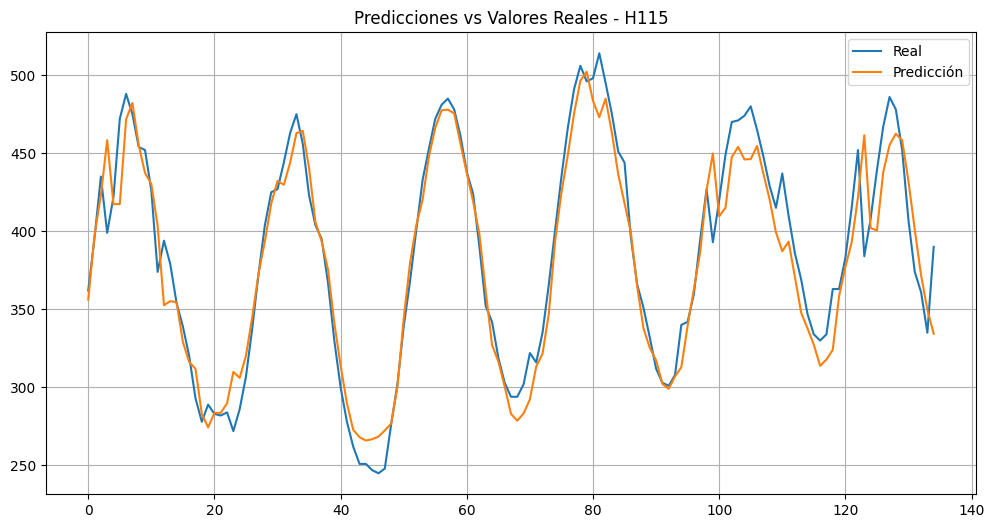

[I 2025-04-05 06:15:14,133] A new study created in memory with name: no-name-328f95aa-36c1-4616-9bf1-875bc0552618



Modelo: CNN

3. Optimización con Optuna:


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
[I 2025-04-05 06:15:28,179] Trial 0 finished with value: 0.0043404377065598965 and parameters: {'filters': 53, 'kernel_size': 3, 'learning_rate': 0.0001452998563357115}. Best is trial 0 with value: 0.0043404377065598965.
[I 2025-04-05 06:15:39,036] Trial 1 finished with value: 0.006868974771350622 and parameters: {'filters': 34, 'kernel_size': 2, 'learning_rate': 0.0001325624902514966}. Best is trial 0 with value: 0.0043404377065598965.
[I 2025-04-05 06:15:42,505] Trial 2 finished with value: 0.008205762133002281 and parameters: {'filters': 96, 'kernel_size': 4, 'learning_rate': 0.00773444345508065}. Best is trial 0 with value: 0.00434043770655989


Mejores hiperparámetros para cnn:
{'filters': 127, 'kernel_size': 5, 'learning_rate': 0.0002004000204094212}

Entrenando modelo final...
Epoch 1/200
15/15 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step - loss: 0.1229 - val_loss: 0.0636
Epoch 2/200
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.0580 - val_loss: 0.0311
Epoch 3/200
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.0300 - val_loss: 0.0139
Epoch 4/200
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.0173 - val_loss: 0.0082
Epoch 5/200
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0126 - val_loss: 0.0084
Epoch 6/200
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0125 - val_loss: 0.0088
Epoch 7/200
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0127 - val_loss: 0.0076
Epoch 8/200
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0104 - val_loss: 0.0072
Epoch 9/200
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0099 - val_loss: 0.0069
Epoch 10/200
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0082 - val_loss: 0.0069
Epoch 1

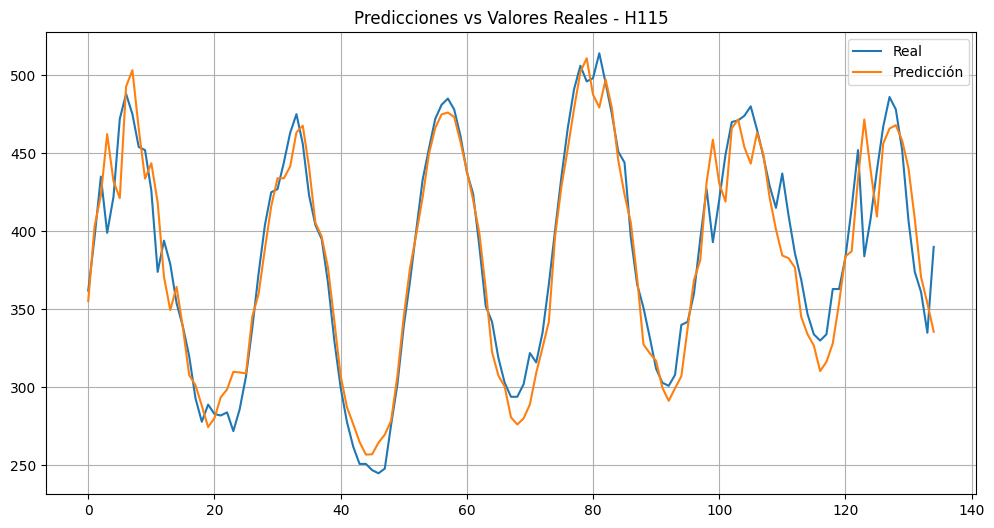

[I 2025-04-05 06:18:47,557] A new study created in memory with name: no-name-8bdea64e-96bd-40ec-9137-d53355adf291



Modelo: LSTM

3. Optimización con Optuna:


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
[I 2025-04-05 06:19:17,940] Trial 0 finished with value: 0.006480093579739332 and parameters: {'units': 103, 'learning_rate': 3.4909925942923424e-05}. Best is trial 0 with value: 0.006480093579739332.
[I 2025-04-05 06:19:45,630] Trial 1 finished with value: 0.005641576834022999 and parameters: {'units': 85, 'learning_rate': 4.0685162979182336e-05}. Best is trial 1 with value: 0.005641576834022999.
[I 2025-04-05 06:19:58,029] Trial 2 finished with value: 0.0034241890534758568 and parameters: {'units': 110, 'learning_rate': 0.008425868024402903}. Best is trial 2 with value: 0.0034241890534758568.
[I 2025-04-05 06:20:18,886] Trial 3 finished with value: 0.006022512447088957 and parameters: {'units': 76, 'lea


Mejores hiperparámetros para lstm:
{'units': 115, 'learning_rate': 0.005621896333487403}

Entrenando modelo final...
Epoch 1/200
15/15 ━━━━━━━━━━━━━━━━━━━━ 2s 57ms/step - loss: 0.0983 - val_loss: 0.0351
Epoch 2/200
15/15 ━━━━━━━━━━━━━━━━━━━━ 1s 51ms/step - loss: 0.0276 - val_loss: 0.0186
Epoch 3/200
15/15 ━━━━━━━━━━━━━━━━━━━━ 1s 53ms/step - loss: 0.0130 - val_loss: 0.0068
Epoch 4/200
15/15 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.0064 - val_loss: 0.0072
Epoch 5/200
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.0050 - val_loss: 0.0068
Epoch 6/200
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.0053 - val_loss: 0.0067
Epoch 7/200
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0043 - val_loss: 0.0070
Epoch 8/200
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.0051 - val_loss: 0.0052
Epoch 9/200
15/15 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.0044 - val_loss: 0.0050
Epoch 10/200
15/15 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - loss: 0.0040 - val_loss: 0.0062
Epoch 11/200
15/15 ━━

4/5 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step 

5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step

Evaluación para serie H115:
MSE: 371.1798
MAE: 13.5257
MAPE: 0.0351


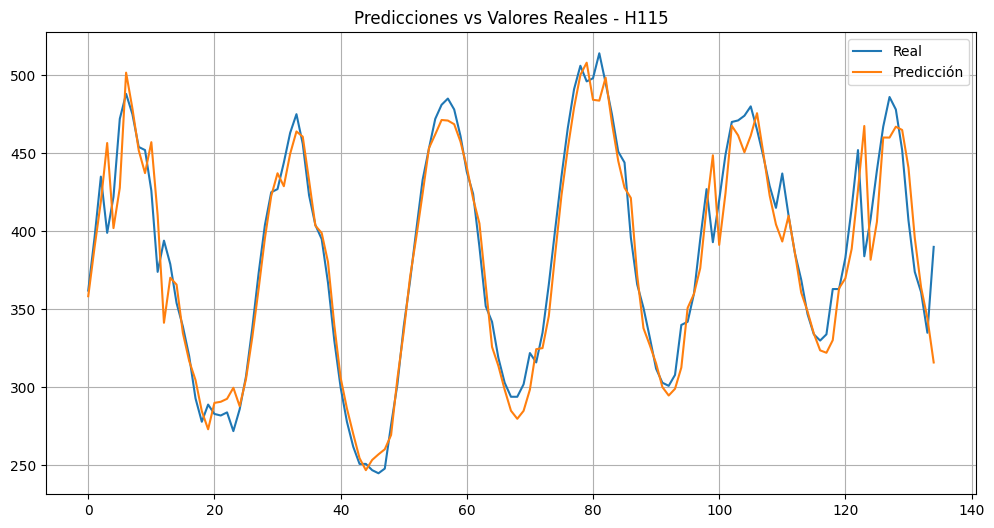

[I 2025-04-05 06:28:05,370] A new study created in memory with name: no-name-c6c2c8f4-ea2e-4cb3-9569-2df6fb98e0d4



Modelo: CNN_LSTM

3. Optimización con Optuna:


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
[I 2025-04-05 06:28:24,756] Trial 0 finished with value: 0.0050987801514565945 and parameters: {'cnn_filters': 61, 'lstm_units': 75, 'learning_rate': 9.849981559272678e-05}. Best is trial 0 with value: 0.0050987801514565945.
[I 2025-04-05 06:28:32,873] Trial 1 finished with value: 0.005036701913923025 and parameters: {'cnn_filters': 103, 'lstm_units': 50, 'learning_rate': 0.0025147393486425595}. Best is trial 1 with value: 0.005036701913923025.
[I 2025-04-05 06:28:38,571] Trial 2 finished with value: 0.004931797739118338 and parameters: {'cnn_filters': 99, 'lstm_units': 70, 'learning_rate': 0.0009377230885292972}. Best is trial 2 with value: 0.004


Mejores hiperparámetros para cnn_lstm:
{'cnn_filters': 35, 'lstm_units': 91, 'learning_rate': 0.00028052731407467597}

Entrenando modelo final...
Epoch 1/200
15/15 ━━━━━━━━━━━━━━━━━━━━ 4s 52ms/step - loss: 0.1897 - val_loss: 0.0985
Epoch 2/200
15/15 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - loss: 0.0826 - val_loss: 0.0701
Epoch 3/200
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.0603 - val_loss: 0.0625
Epoch 4/200
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.0586 - val_loss: 0.0602
Epoch 5/200
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.0533 - val_loss: 0.0572
Epoch 6/200
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.0544 - val_loss: 0.0542
Epoch 7/200
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.0483 - val_loss: 0.0508
Epoch 8/200
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.0469 - val_loss: 0.0470
Epoch 9/200
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.0422 - val_loss: 0.0430
Epoch 10/200
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.0373 - val_loss:

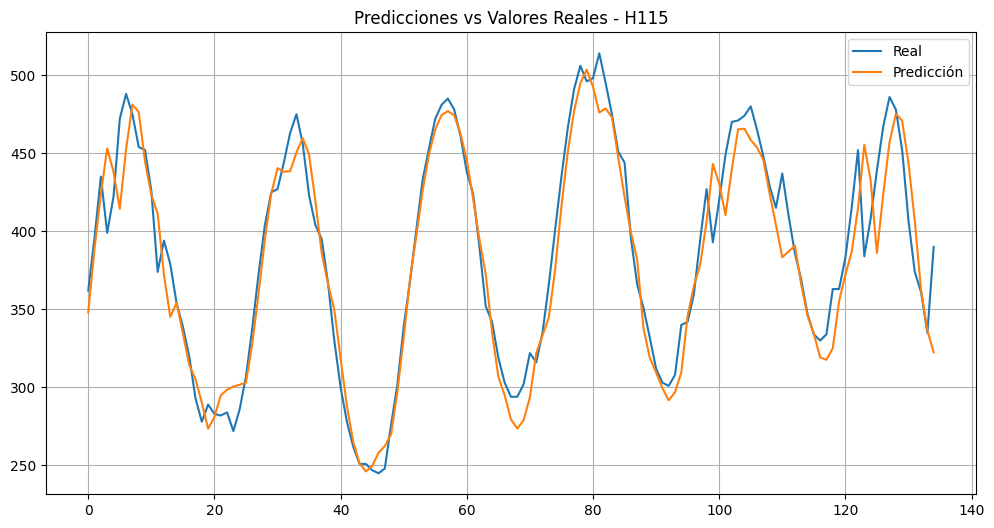

In [6]:
results_H115 = solver.run_experiment('H115')


INICIANDO EXPERIMENTO PARA SERIE H115

1. Análisis de datos:


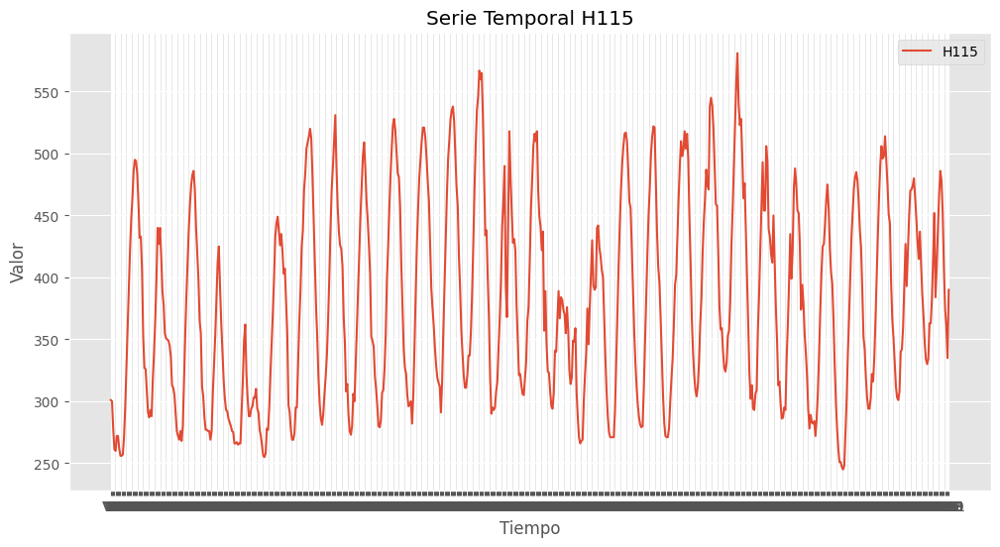

[I 2025-04-05 07:39:48,294] A new study created in memory with name: no-name-4bfd2b43-7318-404a-8364-b59f32f56d30



2. División de datos:
Train shape: (459, 24, 1)
Val shape: (81, 24, 1)
Test shape: (135, 24, 1)

Modelo: MLP

3. Optimización con Optuna:


/usr/local/lib/python3.11/dist-packages/keras/src/layers/reshaping/flatten.py:37: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
[I 2025-04-05 07:39:52,673] Trial 0 finished with value: 0.004934519063681364 and parameters: {'n_units': 205, 'dropout_rate': 0.21846871037569443, 'learning_rate': 0.00016331942360057702}. Best is trial 0 with value: 0.004934519063681364.
[I 2025-04-05 07:39:57,268] Trial 1 finished with value: 0.009358853101730347 and parameters: {'n_units': 170, 'dropout_rate': 0.13792937285909754, 'learning_rate': 2.4567859131528584e-05}. Best is trial 0 with value: 0.004934519063681364.
[I 2025-04-05 07:40:01,708] Trial 2 finished with value: 0.004467778839170933 and parameters: {'n_units': 213, 'dropout_rate': 0.12109573485927241, 'learning_rate': 0.0077225645450203235}. Best is trial 2 with value: 0.004467


Mejores hiperparámetros para mlp:
{'n_units': 248, 'dropout_rate': 0.26318772361238263, 'learning_rate': 0.002500415404010841}

Entrenando modelo final...
Epoch 1/200
15/15 ━━━━━━━━━━━━━━━━━━━━ 1s 16ms/step - loss: 0.0755 - val_loss: 0.0135
Epoch 2/200
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0127 - val_loss: 0.0077
Epoch 3/200
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0102 - val_loss: 0.0141
Epoch 4/200
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0078 - val_loss: 0.0082
Epoch 5/200
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0064 - val_loss: 0.0094
Epoch 6/200
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0053 - val_loss: 0.0057
Epoch 7/200
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0059 - val_loss: 0.0117
Epoch 8/200
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0065 - val_loss: 0.0044
Epoch 9/200
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0065 - val_loss: 0.0117
Epoch 10/200
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0058 - val_loss:

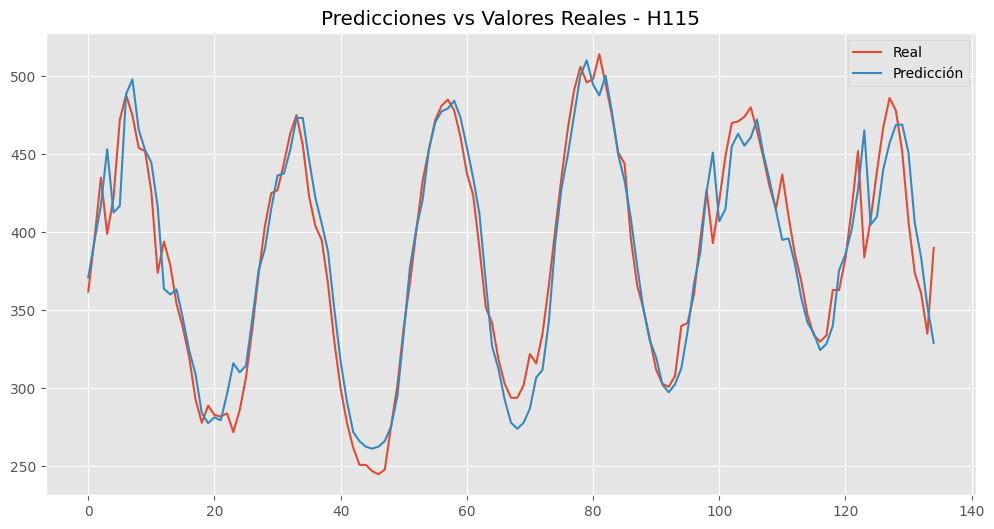

[I 2025-04-05 07:41:45,441] A new study created in memory with name: no-name-70f15814-fd60-4fd3-87a2-76314dc12239



Modelo: CNN

3. Optimización con Optuna:


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
[I 2025-04-05 07:41:48,000] Trial 0 finished with value: 0.008973762392997742 and parameters: {'filters': 123, 'kernel_size': 4, 'learning_rate': 0.006429650229622425}. Best is trial 0 with value: 0.008973762392997742.
[I 2025-04-05 07:41:52,777] Trial 1 finished with value: 0.00689692934975028 and parameters: {'filters': 43, 'kernel_size': 2, 'learning_rate': 0.009263763896783822}. Best is trial 1 with value: 0.00689692934975028.
[I 2025-04-05 07:41:56,767] Trial 2 finished with value: 0.004710200242698193 and parameters: {'filters': 78, 'kernel_size': 3, 'learning_rate': 0.0010657541081799786}. Best is trial 2 with value: 0.004710200242698193.
[


Mejores hiperparámetros para cnn:
{'filters': 76, 'kernel_size': 5, 'learning_rate': 8.628568630803397e-05}

Entrenando modelo final...
Epoch 1/200
15/15 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.2019 - val_loss: 0.2044
Epoch 2/200
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.1479 - val_loss: 0.1367
Epoch 3/200
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0983 - val_loss: 0.0921
Epoch 4/200
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0787 - val_loss: 0.0668
Epoch 5/200
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0559 - val_loss: 0.0512
Epoch 6/200
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0467 - val_loss: 0.0380
Epoch 7/200
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0368 - val_loss: 0.0262
Epoch 8/200
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0254 - val_loss: 0.0177
Epoch 9/200
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0189 - val_loss: 0.0123
Epoch 10/200
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0144 - val_loss: 0.0091
Epoch 11/20

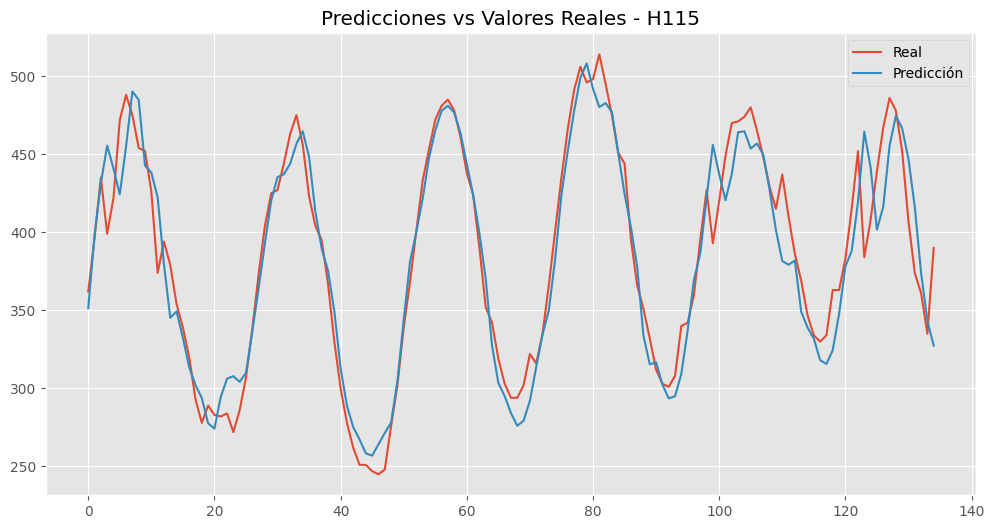

[I 2025-04-05 07:45:39,567] A new study created in memory with name: no-name-459df4a0-7d21-4b85-bc9a-0b408e7065e5



Modelo: LSTM

3. Optimización con Optuna:


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
[I 2025-04-05 07:45:52,224] Trial 0 finished with value: 0.004580976907163858 and parameters: {'units': 116, 'learning_rate': 0.00282733188538915}. Best is trial 0 with value: 0.004580976907163858.
[I 2025-04-05 07:46:05,691] Trial 1 finished with value: 0.00480375811457634 and parameters: {'units': 88, 'learning_rate': 0.0010069648013920868}. Best is trial 0 with value: 0.004580976907163858.
[I 2025-04-05 07:46:23,470] Trial 2 finished with value: 0.005485333036631346 and parameters: {'units': 56, 'learning_rate': 0.00017730052789536997}. Best is trial 0 with value: 0.004580976907163858.
[I 2025-04-05 07:46:36,255] Trial 3 finished with value: 0.0047247447073459625 and parameters: {'units': 93, 'learning


Mejores hiperparámetros para lstm:
{'units': 86, 'learning_rate': 0.0059066336176876386}

Entrenando modelo final...
Epoch 1/200
15/15 ━━━━━━━━━━━━━━━━━━━━ 3s 39ms/step - loss: 0.0853 - val_loss: 0.0338
Epoch 2/200
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0236 - val_loss: 0.0116
Epoch 3/200
15/15 ━━━━━━━━━━━━━━━━━━━━ 1s 19ms/step - loss: 0.0091 - val_loss: 0.0064
Epoch 4/200
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0050 - val_loss: 0.0062
Epoch 5/200
15/15 ━━━━━━━━━━━━━━━━━━━━ 1s 19ms/step - loss: 0.0050 - val_loss: 0.0063
Epoch 6/200
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.0058 - val_loss: 0.0056
Epoch 7/200
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.0050 - val_loss: 0.0055
Epoch 8/200
15/15 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0039 - val_loss: 0.0058
Epoch 9/200
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0038 - val_loss: 0.0059
Epoch 10/200
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - loss: 0.0038 - val_loss: 0.0056
Epoch 11/200
15/15 ━━

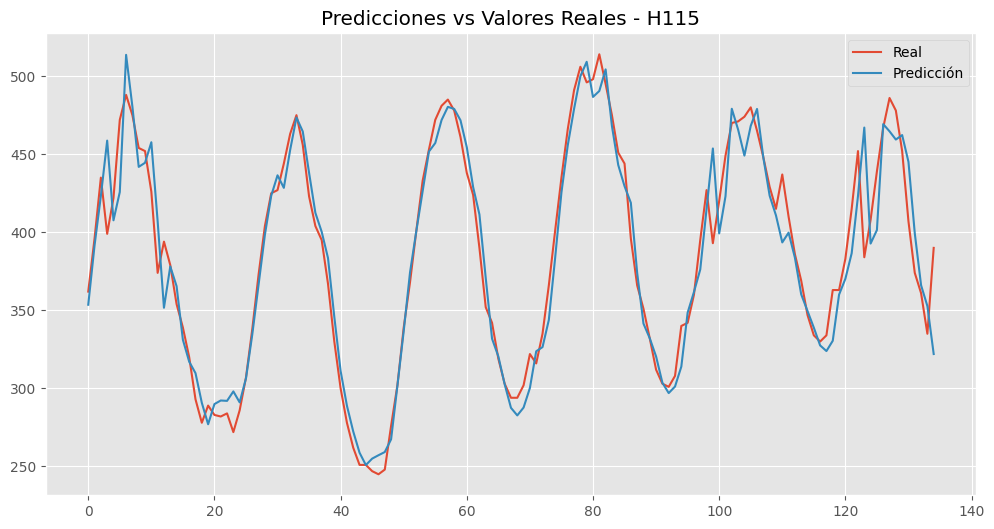

[I 2025-04-05 07:52:58,753] A new study created in memory with name: no-name-0ca19a4c-8ee3-4abc-a732-a3a52a067e6d



Modelo: CNN_LSTM

3. Optimización con Optuna:


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
[I 2025-04-05 07:53:42,969] Trial 0 finished with value: 0.004877694416791201 and parameters: {'cnn_filters': 108, 'lstm_units': 119, 'learning_rate': 9.402477176402779e-05}. Best is trial 0 with value: 0.004877694416791201.
[I 2025-04-05 07:53:53,088] Trial 1 finished with value: 0.005125937517732382 and parameters: {'cnn_filters': 91, 'lstm_units': 74, 'learning_rate': 0.0003848998162354651}. Best is trial 0 with value: 0.004877694416791201.
[I 2025-04-05 07:54:04,249] Trial 2 finished with value: 0.004813695326447487 and parameters: {'cnn_filters': 69, 'lstm_units': 66, 'learning_rate': 0.0007546916814886178}. Best is trial 2 with value: 0.0048


Mejores hiperparámetros para cnn_lstm:
{'cnn_filters': 48, 'lstm_units': 83, 'learning_rate': 0.0003184402862102447}

Entrenando modelo final...
Epoch 1/200
15/15 ━━━━━━━━━━━━━━━━━━━━ 3s 39ms/step - loss: 0.1735 - val_loss: 0.0883
Epoch 2/200
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.0696 - val_loss: 0.0678
Epoch 3/200
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.0596 - val_loss: 0.0579
Epoch 4/200
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.0525 - val_loss: 0.0542
Epoch 5/200
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.0505 - val_loss: 0.0505
Epoch 6/200
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.0478 - val_loss: 0.0474
Epoch 7/200
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.0417 - val_loss: 0.0423
Epoch 8/200
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.0394 - val_loss: 0.0373
Epoch 9/200
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.0351 - val_loss: 0.0312
Epoch 10/200
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.0280 - val_loss: 

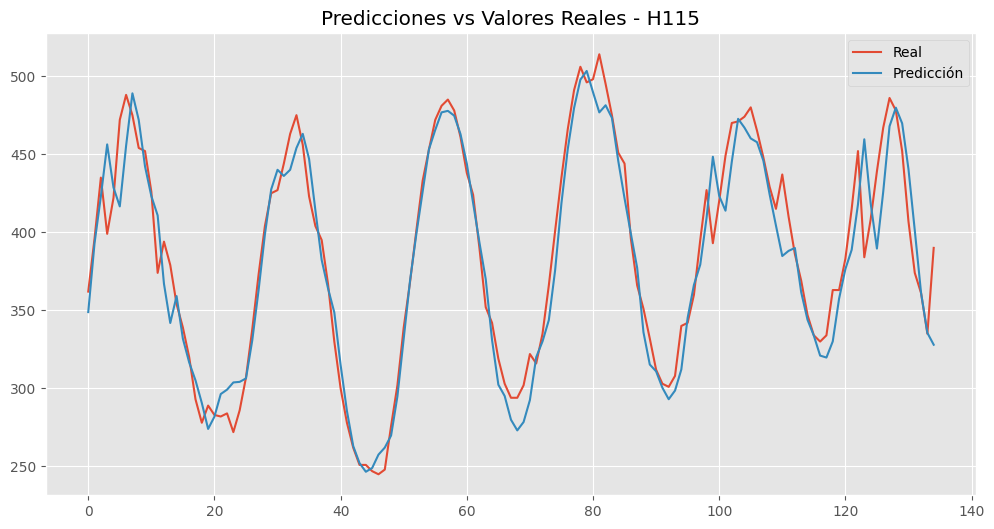


INICIANDO EXPERIMENTO PARA SERIE H243

1. Análisis de datos:


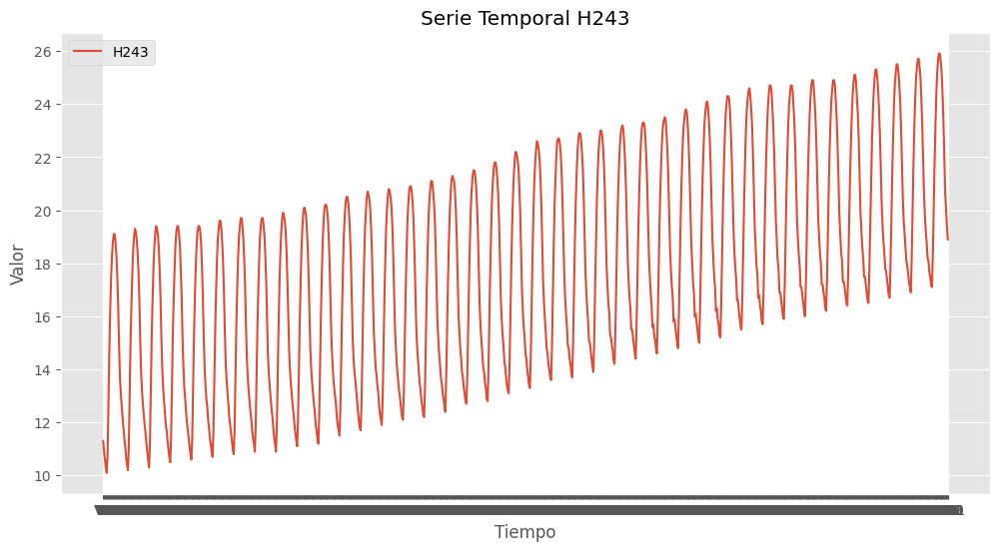

[I 2025-04-05 07:59:34,838] A new study created in memory with name: no-name-fcbbe3cb-6ef8-44e1-a73e-a294ff8bb67f



2. División de datos:
Train shape: (636, 24, 1)
Val shape: (112, 24, 1)
Test shape: (187, 24, 1)

Modelo: MLP

3. Optimización con Optuna:


/usr/local/lib/python3.11/dist-packages/keras/src/layers/reshaping/flatten.py:37: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
[I 2025-04-05 07:59:48,122] Trial 0 finished with value: 0.004737860523164272 and parameters: {'n_units': 125, 'dropout_rate': 0.37242753384112615, 'learning_rate': 1.624012995516853e-05}. Best is trial 0 with value: 0.004737860523164272.
[I 2025-04-05 07:59:55,649] Trial 1 finished with value: 0.0004634517536032945 and parameters: {'n_units': 174, 'dropout_rate': 0.17098310855466461, 'learning_rate': 4.8445049039519666e-05}. Best is trial 1 with value: 0.0004634517536032945.
[I 2025-04-05 07:59:58,936] Trial 2 finished with value: 0.00463563296943903 and parameters: {'n_units': 39, 'dropout_rate': 0.19249757994421923, 'learning_rate': 0.0008106307748466517}. Best is trial 1 with value: 0.0004634


Mejores hiperparámetros para mlp:
{'n_units': 154, 'dropout_rate': 0.12856176660967905, 'learning_rate': 0.00024579793327079183}

Entrenando modelo final...
Epoch 1/200
20/20 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - loss: 0.4042 - val_loss: 0.0904
Epoch 2/200
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0565 - val_loss: 0.0288
Epoch 3/200
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0212 - val_loss: 0.0079
Epoch 4/200
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0100 - val_loss: 0.0015
Epoch 5/200
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0052 - val_loss: 8.4468e-04
Epoch 6/200
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0043 - val_loss: 5.0070e-04
Epoch 7/200
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0035 - val_loss: 4.2969e-04
Epoch 8/200
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0037 - val_loss: 4.5723e-04
Epoch 9/200
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0031 - val_loss: 5.8359e-04
Epoch 10/200
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - l

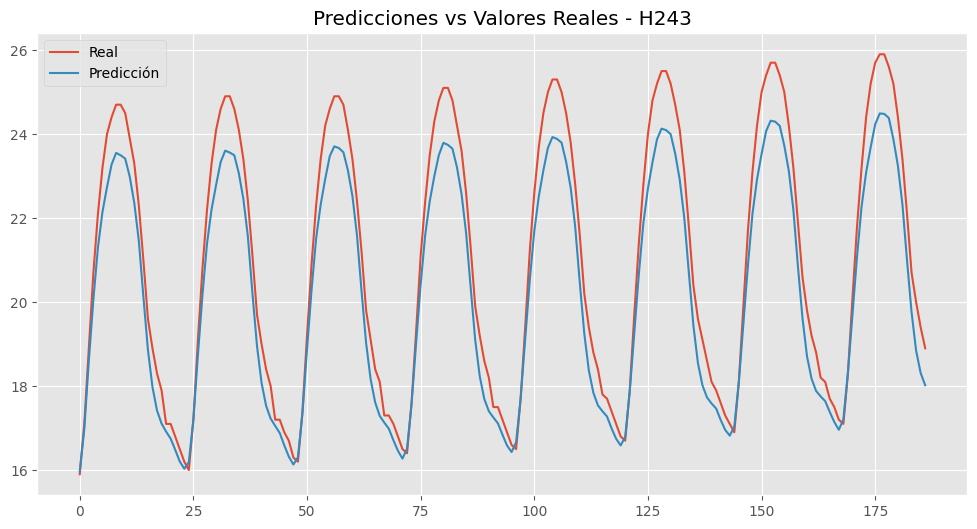

[I 2025-04-05 08:02:01,659] A new study created in memory with name: no-name-3b1c6710-187c-451c-a36c-2c9777f27861



Modelo: CNN

3. Optimización con Optuna:


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
[I 2025-04-05 08:02:17,044] Trial 0 finished with value: 0.00015251869626808912 and parameters: {'filters': 121, 'kernel_size': 5, 'learning_rate': 7.988847278611537e-05}. Best is trial 0 with value: 0.00015251869626808912.
[I 2025-04-05 08:02:34,858] Trial 1 finished with value: 0.0013184326235204935 and parameters: {'filters': 54, 'kernel_size': 2, 'learning_rate': 1.2729517816243077e-05}. Best is trial 0 with value: 0.00015251869626808912.
[I 2025-04-05 08:02:41,244] Trial 2 finished with value: 0.00010313007805962116 and parameters: {'filters': 42, 'kernel_size': 2, 'learning_rate': 0.001100860150522963}. Best is trial 2 with value: 0.00010313


Mejores hiperparámetros para cnn:
{'filters': 71, 'kernel_size': 2, 'learning_rate': 0.0008657031200389474}

Entrenando modelo final...
Epoch 1/200
20/20 ━━━━━━━━━━━━━━━━━━━━ 1s 16ms/step - loss: 0.1039 - val_loss: 0.0233
Epoch 2/200
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0121 - val_loss: 0.0026
Epoch 3/200
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0024 - val_loss: 0.0017
Epoch 4/200
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0017 - val_loss: 0.0012
Epoch 5/200
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0011 - val_loss: 8.5616e-04
Epoch 6/200
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 8.5290e-04 - val_loss: 7.1317e-04
Epoch 7/200
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 6.7774e-04 - val_loss: 6.6461e-04
Epoch 8/200
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 5.5519e-04 - val_loss: 5.4410e-04
Epoch 9/200
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 4.2519e-04 - val_loss: 4.6277e-04
Epoch 10/200
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 2

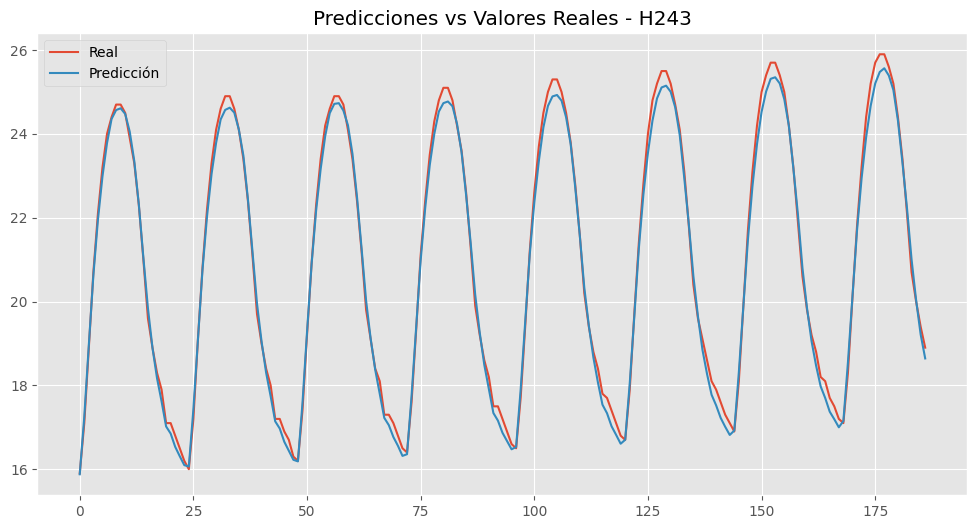

[I 2025-04-05 08:06:30,364] A new study created in memory with name: no-name-5f0605bc-6a11-4445-8e68-235bad768ff6



Modelo: LSTM

3. Optimización con Optuna:


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
[I 2025-04-05 08:06:55,029] Trial 0 finished with value: 0.00014420256775338203 and parameters: {'units': 76, 'learning_rate': 0.0011964828861072082}. Best is trial 0 with value: 0.00014420256775338203.
[I 2025-04-05 08:07:23,684] Trial 1 finished with value: 0.0001648102916078642 and parameters: {'units': 127, 'learning_rate': 0.0022025004789958873}. Best is trial 0 with value: 0.00014420256775338203.
[I 2025-04-05 08:08:18,302] Trial 2 finished with value: 0.0023443272802978754 and parameters: {'units': 104, 'learning_rate': 2.051800080496815e-05}. Best is trial 0 with value: 0.00014420256775338203.
[I 2025-04-05 08:09:18,002] Trial 3 finished with value: 0.0014425823464989662 and parameters: {'units': 


Mejores hiperparámetros para lstm:
{'units': 65, 'learning_rate': 0.0032940709992748357}

Entrenando modelo final...
Epoch 1/200
20/20 ━━━━━━━━━━━━━━━━━━━━ 2s 31ms/step - loss: 0.0733 - val_loss: 0.0296
Epoch 2/200
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.0221 - val_loss: 0.0104
Epoch 3/200
20/20 ━━━━━━━━━━━━━━━━━━━━ 1s 16ms/step - loss: 0.0056 - val_loss: 0.0024
Epoch 4/200
20/20 ━━━━━━━━━━━━━━━━━━━━ 1s 16ms/step - loss: 0.0045 - val_loss: 0.0022
Epoch 5/200
20/20 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0034 - val_loss: 0.0020
Epoch 6/200
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.0022 - val_loss: 0.0019
Epoch 7/200
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.0016 - val_loss: 0.0022
Epoch 8/200
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.0015 - val_loss: 0.0013
Epoch 9/200
20/20 ━━━━━━━━━━━━━━━━━━━━ 1s 16ms/step - loss: 0.0011 - val_loss: 0.0014
Epoch 10/200
20/20 ━━━━━━━━━━━━━━━━━━━━ 1s 16ms/step - loss: 0.0011 - val_loss: 0.0014
Epoch 11/200
20/20 ━━

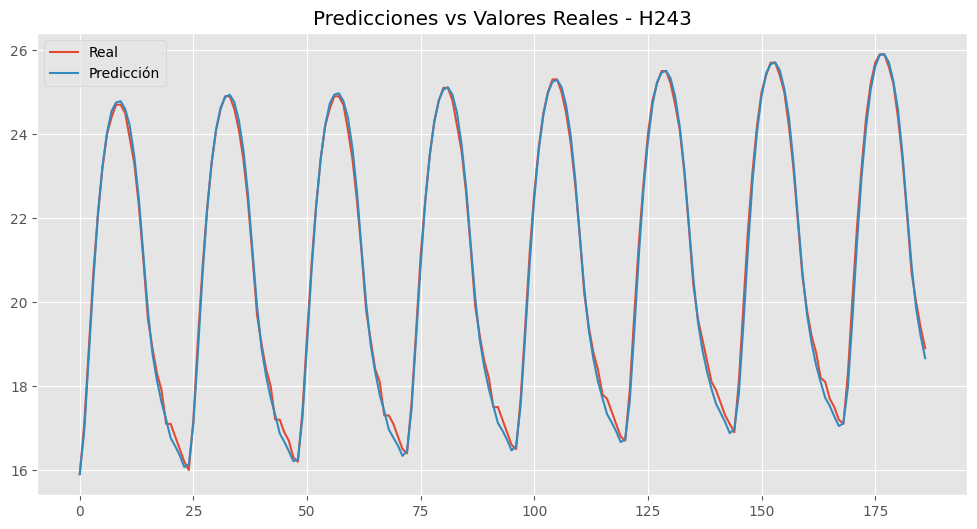

[I 2025-04-05 08:15:39,478] A new study created in memory with name: no-name-83d85fa5-97b6-495a-b48b-d23f9d262495



Modelo: CNN_LSTM

3. Optimización con Optuna:


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
[I 2025-04-05 08:15:58,369] Trial 0 finished with value: 0.00019894192519132048 and parameters: {'cnn_filters': 95, 'lstm_units': 85, 'learning_rate': 0.0005323673463948466}. Best is trial 0 with value: 0.00019894192519132048.
[I 2025-04-05 08:16:36,873] Trial 1 finished with value: 0.009224249050021172 and parameters: {'cnn_filters': 109, 'lstm_units': 95, 'learning_rate': 1.6709498395636555e-05}. Best is trial 0 with value: 0.00019894192519132048.
[I 2025-04-05 08:17:07,779] Trial 2 finished with value: 0.0340474434196949 and parameters: {'cnn_filters': 93, 'lstm_units': 35, 'learning_rate': 1.2194380424480013e-05}. Best is trial 0 with value: 0


Mejores hiperparámetros para cnn_lstm:
{'cnn_filters': 58, 'lstm_units': 39, 'learning_rate': 0.009697974707728032}

Entrenando modelo final...
Epoch 1/200
20/20 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - loss: 0.0458 - val_loss: 0.0124
Epoch 2/200
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.0039 - val_loss: 0.0031
Epoch 3/200
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0022 - val_loss: 0.0018
Epoch 4/200
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.0018 - val_loss: 0.0019
Epoch 5/200
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.0015 - val_loss: 0.0023
Epoch 6/200
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.0019 - val_loss: 8.3134e-04
Epoch 7/200
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0012 - val_loss: 7.5927e-04
Epoch 8/200
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0013 - val_loss: 0.0035
Epoch 9/200
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.0013 - val_loss: 7.2511e-04
Epoch 10/200
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 7.5414e-

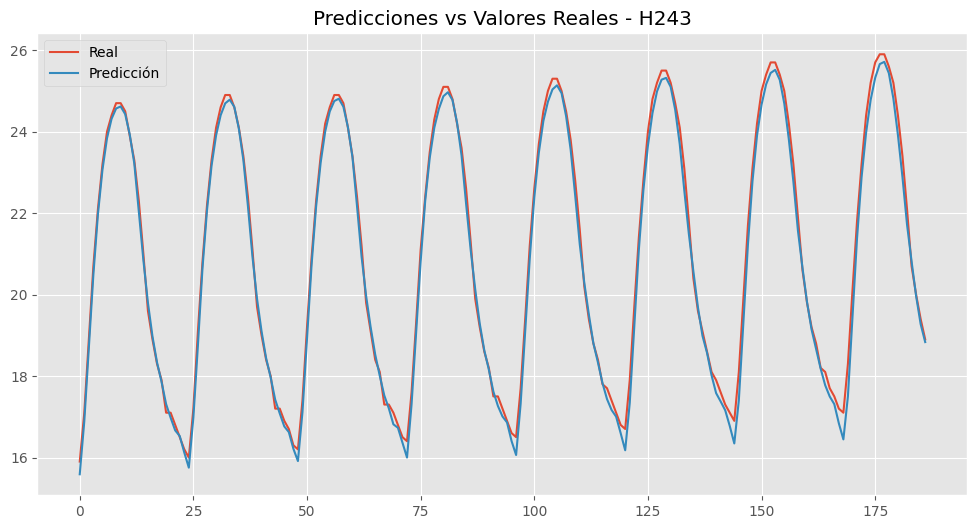


INICIANDO EXPERIMENTO PARA SERIE H384

1. Análisis de datos:


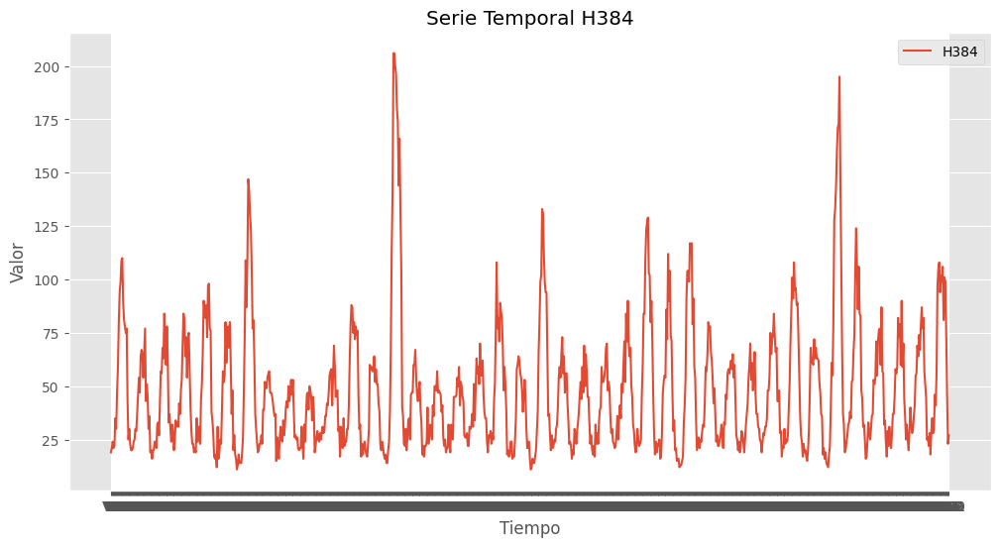

[I 2025-04-05 08:24:48,394] A new study created in memory with name: no-name-52006557-2ec8-4756-848b-7bf50f10f9e3



2. División de datos:
Train shape: (636, 24, 1)
Val shape: (112, 24, 1)
Test shape: (187, 24, 1)

Modelo: MLP

3. Optimización con Optuna:


/usr/local/lib/python3.11/dist-packages/keras/src/layers/reshaping/flatten.py:37: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
[I 2025-04-05 08:24:51,333] Trial 0 finished with value: 0.0014283506898209453 and parameters: {'n_units': 73, 'dropout_rate': 0.11565813574376929, 'learning_rate': 0.000989642702919906}. Best is trial 0 with value: 0.0014283506898209453.
[I 2025-04-05 08:25:08,309] Trial 1 finished with value: 0.003574404865503311 and parameters: {'n_units': 56, 'dropout_rate': 0.4188489337387452, 'learning_rate': 1.1904002778465668e-05}. Best is trial 0 with value: 0.0014283506898209453.
[I 2025-04-05 08:25:12,954] Trial 2 finished with value: 0.0013747577322646976 and parameters: {'n_units': 46, 'dropout_rate': 0.26860262125571965, 'learning_rate': 0.0016296370194317587}. Best is trial 2 with value: 0.00137475


Mejores hiperparámetros para mlp:
{'n_units': 98, 'dropout_rate': 0.21441547534360444, 'learning_rate': 0.000384379109314144}

Entrenando modelo final...
Epoch 1/200
20/20 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - loss: 0.0329 - val_loss: 0.0080
Epoch 2/200
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0159 - val_loss: 0.0037
Epoch 3/200
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0119 - val_loss: 0.0037
Epoch 4/200
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0125 - val_loss: 0.0026
Epoch 5/200
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0100 - val_loss: 0.0024
Epoch 6/200
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0085 - val_loss: 0.0019
Epoch 7/200
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0076 - val_loss: 0.0016
Epoch 8/200
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.0080 - val_loss: 0.0016
Epoch 9/200
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.0070 - val_loss: 0.0017
Epoch 10/200
20/20 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 0.0061 - val_los

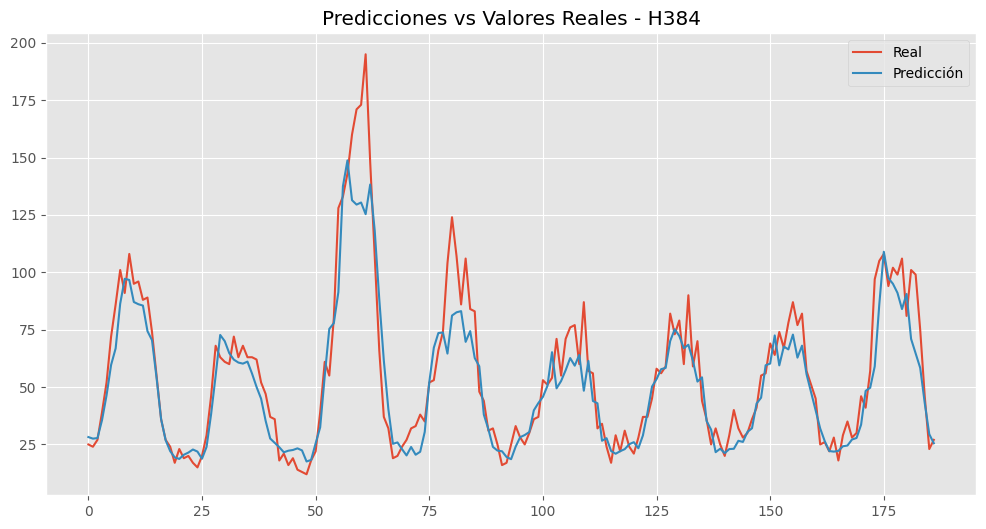

[I 2025-04-05 08:28:00,383] A new study created in memory with name: no-name-c987d617-6c05-4da2-a6f8-fbc4469d2f13



Modelo: CNN

3. Optimización con Optuna:


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
[I 2025-04-05 08:28:03,673] Trial 0 finished with value: 0.0014241327298805118 and parameters: {'filters': 86, 'kernel_size': 4, 'learning_rate': 0.0009328364683257191}. Best is trial 0 with value: 0.0014241327298805118.
[I 2025-04-05 08:28:15,036] Trial 1 finished with value: 0.001325757591985166 and parameters: {'filters': 80, 'kernel_size': 4, 'learning_rate': 4.8045865901268356e-05}. Best is trial 1 with value: 0.001325757591985166.
[I 2025-04-05 08:28:18,129] Trial 2 finished with value: 0.0014586899196729064 and parameters: {'filters': 78, 'kernel_size': 4, 'learning_rate': 0.0031323925792885944}. Best is trial 1 with value: 0.00132575759198


Mejores hiperparámetros para cnn:
{'filters': 62, 'kernel_size': 5, 'learning_rate': 0.0002665062669019394}

Entrenando modelo final...
Epoch 1/200
20/20 ━━━━━━━━━━━━━━━━━━━━ 2s 15ms/step - loss: 0.0249 - val_loss: 0.0058
Epoch 2/200
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0105 - val_loss: 0.0033
Epoch 3/200
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0070 - val_loss: 0.0024
Epoch 4/200
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0056 - val_loss: 0.0020
Epoch 5/200
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0071 - val_loss: 0.0017
Epoch 6/200
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0041 - val_loss: 0.0016
Epoch 7/200
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0049 - val_loss: 0.0014
Epoch 8/200
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0032 - val_loss: 0.0013
Epoch 9/200
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0038 - val_loss: 0.0014
Epoch 10/200
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0035 - val_loss: 0.0012
Epoch 11/20

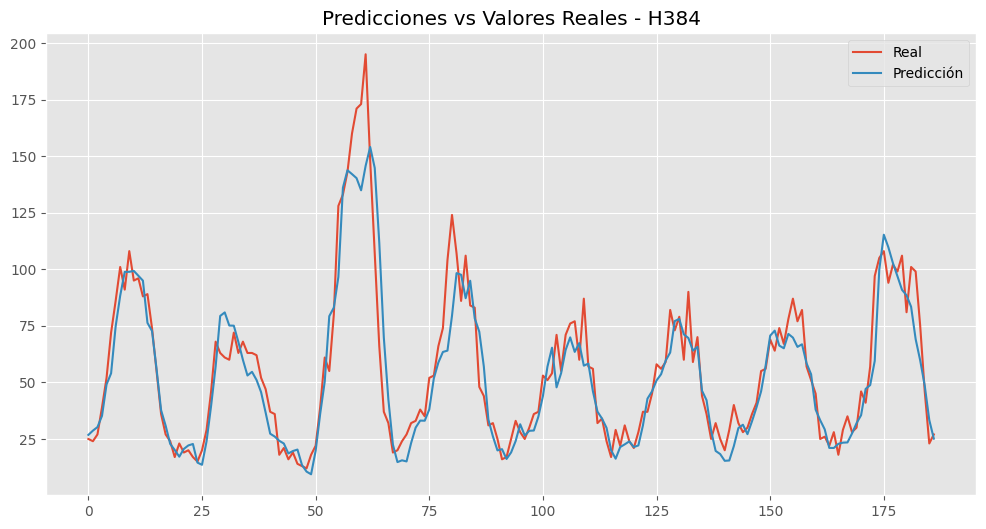

[I 2025-04-05 08:31:47,322] A new study created in memory with name: no-name-5747d78c-7c4e-4715-b97b-79f9dd5a72bd



Modelo: LSTM

3. Optimización con Optuna:


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
[I 2025-04-05 08:32:25,765] Trial 0 finished with value: 0.0014888480072841048 and parameters: {'units': 127, 'learning_rate': 0.00013922458472395843}. Best is trial 0 with value: 0.0014888480072841048.
[I 2025-04-05 08:32:41,893] Trial 1 finished with value: 0.001407952280715108 and parameters: {'units': 101, 'learning_rate': 0.0012741857676422455}. Best is trial 1 with value: 0.001407952280715108.
[I 2025-04-05 08:33:02,764] Trial 2 finished with value: 0.0013930441346019506 and parameters: {'units': 103, 'learning_rate': 0.0003293290511998052}. Best is trial 2 with value: 0.0013930441346019506.
[I 2025-04-05 08:33:31,100] Trial 3 finished with value: 0.0014014040352776647 and parameters: {'units': 124,


Mejores hiperparámetros para lstm:
{'units': 100, 'learning_rate': 0.0005363266551208544}

Entrenando modelo final...
Epoch 1/200
20/20 ━━━━━━━━━━━━━━━━━━━━ 3s 40ms/step - loss: 0.0395 - val_loss: 0.0138
Epoch 2/200
20/20 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - loss: 0.0158 - val_loss: 0.0110
Epoch 3/200
20/20 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.0154 - val_loss: 0.0084
Epoch 4/200
20/20 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.0124 - val_loss: 0.0050
Epoch 5/200
20/20 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - loss: 0.0109 - val_loss: 0.0026
Epoch 6/200
20/20 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.0057 - val_loss: 0.0023
Epoch 7/200
20/20 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.0054 - val_loss: 0.0020
Epoch 8/200
20/20 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - loss: 0.0051 - val_loss: 0.0020
Epoch 9/200
20/20 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - loss: 0.0043 - val_loss: 0.0019
Epoch 10/200
20/20 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.0047 - val_loss: 0.0018
Epoch 11/200
20/20 ━

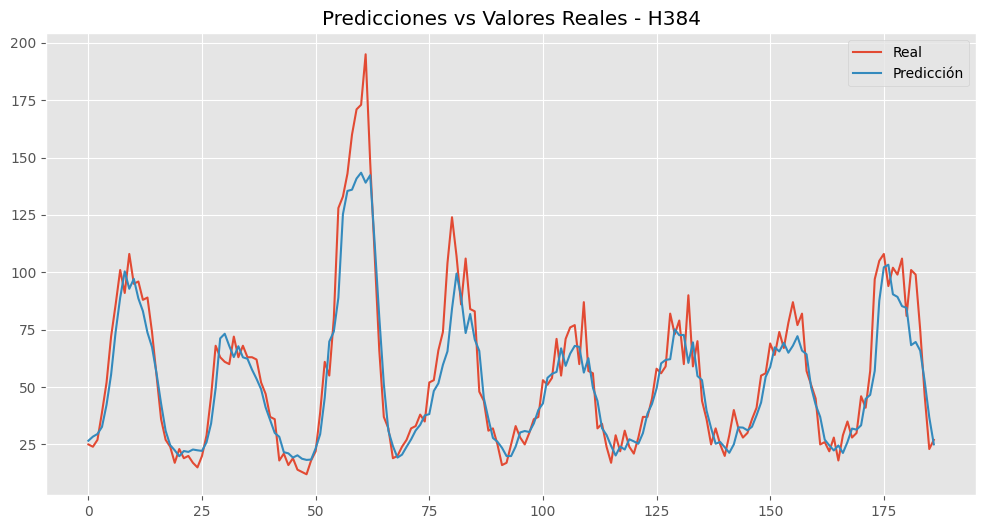

[I 2025-04-05 08:41:13,936] A new study created in memory with name: no-name-399cb252-a471-4a90-abb8-b1c3bf06de8b



Modelo: CNN_LSTM

3. Optimización con Optuna:


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
[I 2025-04-05 08:41:33,685] Trial 0 finished with value: 0.001460336265154183 and parameters: {'cnn_filters': 100, 'lstm_units': 85, 'learning_rate': 0.00017845442692327596}. Best is trial 0 with value: 0.001460336265154183.
[I 2025-04-05 08:41:49,654] Trial 1 finished with value: 0.001442375942133367 and parameters: {'cnn_filters': 67, 'lstm_units': 87, 'learning_rate': 0.0002542896789035943}. Best is trial 1 with value: 0.001442375942133367.
[I 2025-04-05 08:42:33,209] Trial 2 finished with value: 0.0016390392556786537 and parameters: {'cnn_filters': 112, 'lstm_units': 93, 'learning_rate': 3.5257856448014096e-05}. Best is trial 1 with value: 0.0


Mejores hiperparámetros para cnn_lstm:
{'cnn_filters': 85, 'lstm_units': 43, 'learning_rate': 0.009202265386323509}

Entrenando modelo final...
Epoch 1/200
20/20 ━━━━━━━━━━━━━━━━━━━━ 3s 34ms/step - loss: 0.0256 - val_loss: 0.0035
Epoch 2/200
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.0043 - val_loss: 0.0025
Epoch 3/200
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.0037 - val_loss: 0.0020
Epoch 4/200
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.0049 - val_loss: 0.0021
Epoch 5/200
20/20 ━━━━━━━━━━━━━━━━━━━━ 1s 15ms/step - loss: 0.0037 - val_loss: 0.0018
Epoch 6/200
20/20 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - loss: 0.0027 - val_loss: 0.0017
Epoch 7/200
20/20 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0032 - val_loss: 0.0018
Epoch 8/200
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0029 - val_loss: 0.0017
Epoch 9/200
20/20 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.0028 - val_loss: 0.0015
Epoch 10/200
20/20 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - loss: 0.0026 - val_loss: 0

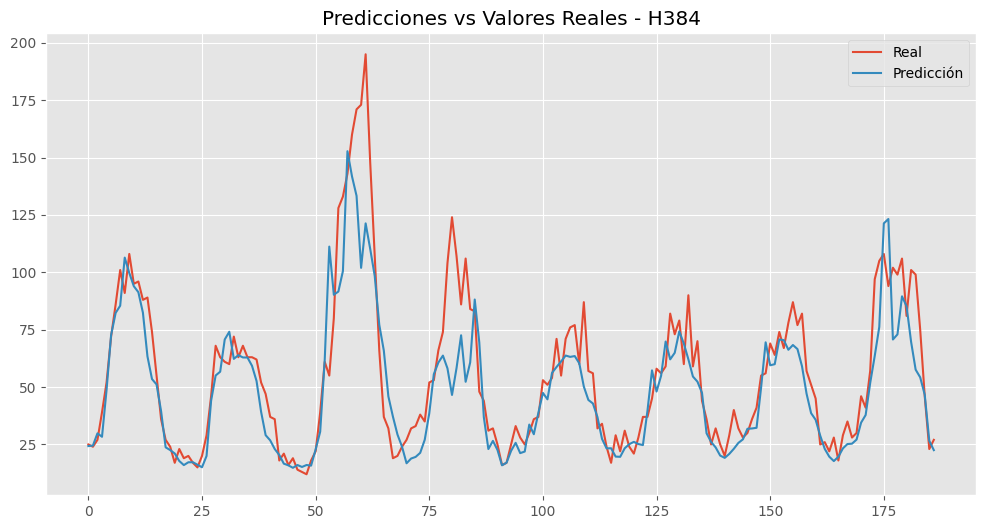


INICIANDO EXPERIMENTO PARA SERIE H402

1. Análisis de datos:


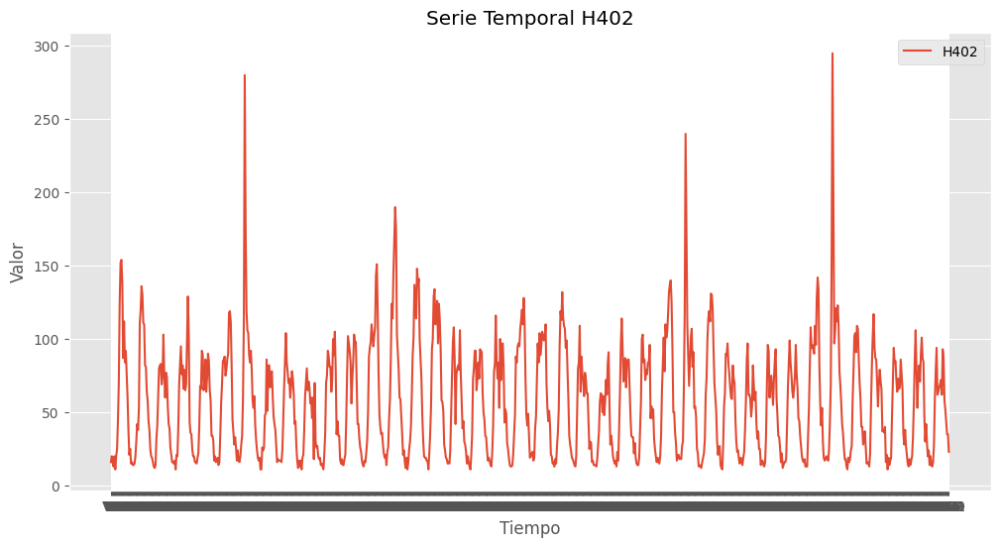

[I 2025-04-05 08:49:05,081] A new study created in memory with name: no-name-f5354362-4cca-4e6a-93a6-a43dd39d32f4



2. División de datos:
Train shape: (636, 24, 1)
Val shape: (112, 24, 1)
Test shape: (187, 24, 1)

Modelo: MLP

3. Optimización con Optuna:


/usr/local/lib/python3.11/dist-packages/keras/src/layers/reshaping/flatten.py:37: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
[I 2025-04-05 08:49:16,629] Trial 0 finished with value: 0.0014288017991930246 and parameters: {'n_units': 118, 'dropout_rate': 0.35914702748470007, 'learning_rate': 0.00035449158889906126}. Best is trial 0 with value: 0.0014288017991930246.
[I 2025-04-05 08:49:20,988] Trial 1 finished with value: 0.0014721878105774522 and parameters: {'n_units': 119, 'dropout_rate': 0.2678857058388223, 'learning_rate': 0.0021566308647477206}. Best is trial 0 with value: 0.0014288017991930246.
[I 2025-04-05 08:49:33,897] Trial 2 finished with value: 0.0017745430814102292 and parameters: {'n_units': 142, 'dropout_rate': 0.10354924656404939, 'learning_rate': 7.140233304828252e-05}. Best is trial 0 with value: 0.001


Mejores hiperparámetros para mlp:
{'n_units': 118, 'dropout_rate': 0.35914702748470007, 'learning_rate': 0.00035449158889906126}

Entrenando modelo final...
Epoch 1/200
20/20 ━━━━━━━━━━━━━━━━━━━━ 1s 15ms/step - loss: 0.0236 - val_loss: 0.0097
Epoch 2/200
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0105 - val_loss: 0.0048
Epoch 3/200
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0086 - val_loss: 0.0062
Epoch 4/200
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0086 - val_loss: 0.0042
Epoch 5/200
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0081 - val_loss: 0.0041
Epoch 6/200
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0059 - val_loss: 0.0036
Epoch 7/200
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0059 - val_loss: 0.0034
Epoch 8/200
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0067 - val_loss: 0.0028
Epoch 9/200
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0069 - val_loss: 0.0026
Epoch 10/200
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0066 - val_los

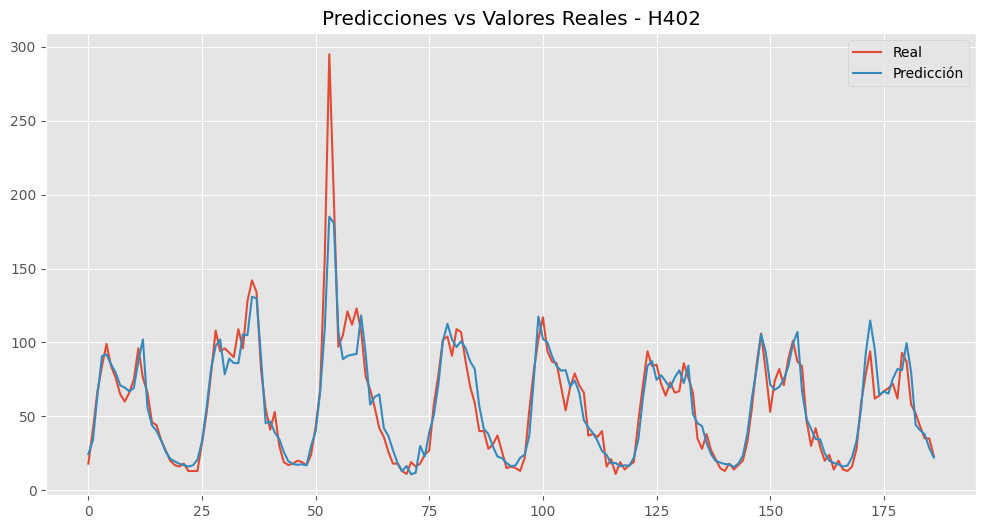

[I 2025-04-05 08:53:10,577] A new study created in memory with name: no-name-fdf967ab-c7b6-40c1-b6cc-cb3301e05ecf



Modelo: CNN

3. Optimización con Optuna:


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
[I 2025-04-05 08:53:20,461] Trial 0 finished with value: 0.001752302167005837 and parameters: {'filters': 57, 'kernel_size': 3, 'learning_rate': 0.00023885319330244146}. Best is trial 0 with value: 0.001752302167005837.
[I 2025-04-05 08:53:26,423] Trial 1 finished with value: 0.0020430139265954494 and parameters: {'filters': 97, 'kernel_size': 5, 'learning_rate': 0.0007177003755965113}. Best is trial 0 with value: 0.001752302167005837.
[I 2025-04-05 08:53:31,987] Trial 2 finished with value: 0.002946842461824417 and parameters: {'filters': 110, 'kernel_size': 4, 'learning_rate': 0.00685098140782125}. Best is trial 0 with value: 0.00175230216700583


Mejores hiperparámetros para cnn:
{'filters': 51, 'kernel_size': 3, 'learning_rate': 0.0007154750860060799}

Entrenando modelo final...
Epoch 1/200
20/20 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0211 - val_loss: 0.0059
Epoch 2/200
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0062 - val_loss: 0.0058
Epoch 3/200
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0057 - val_loss: 0.0043
Epoch 4/200
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0047 - val_loss: 0.0037
Epoch 5/200
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0035 - val_loss: 0.0035
Epoch 6/200
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0031 - val_loss: 0.0033
Epoch 7/200
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0030 - val_loss: 0.0028
Epoch 8/200
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0032 - val_loss: 0.0027
Epoch 9/200
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0024 - val_loss: 0.0027
Epoch 10/200
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0025 - val_loss: 0.0025
Epoch 11/20

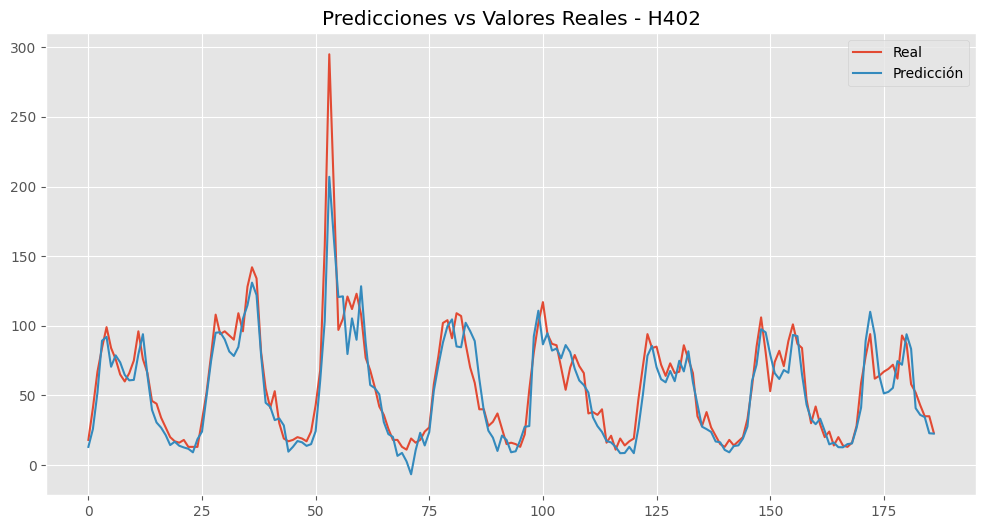

[I 2025-04-05 08:56:56,495] A new study created in memory with name: no-name-6038d436-8f7e-4c66-b3c6-351075f387ca



Modelo: LSTM

3. Optimización con Optuna:


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
[I 2025-04-05 08:57:18,157] Trial 0 finished with value: 0.004504404962062836 and parameters: {'units': 116, 'learning_rate': 0.00016836691616039942}. Best is trial 0 with value: 0.004504404962062836.
[I 2025-04-05 08:57:32,087] Trial 1 finished with value: 0.004483510740101337 and parameters: {'units': 69, 'learning_rate': 0.00012995810663283532}. Best is trial 1 with value: 0.004483510740101337.
[I 2025-04-05 08:57:52,391] Trial 2 finished with value: 0.0017152091022580862 and parameters: {'units': 71, 'learning_rate': 0.0017792468426807693}. Best is trial 2 with value: 0.0017152091022580862.
[I 2025-04-05 08:58:18,795] Trial 3 finished with value: 0.004588406067341566 and parameters: {'units': 56, 'lea


Mejores hiperparámetros para lstm:
{'units': 49, 'learning_rate': 0.0013177237637918436}

Entrenando modelo final...
Epoch 1/200
20/20 ━━━━━━━━━━━━━━━━━━━━ 2s 33ms/step - loss: 0.0206 - val_loss: 0.0087
Epoch 2/200
20/20 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0112 - val_loss: 0.0065
Epoch 3/200
20/20 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - loss: 0.0082 - val_loss: 0.0050
Epoch 4/200
20/20 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - loss: 0.0049 - val_loss: 0.0039
Epoch 5/200
20/20 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - loss: 0.0065 - val_loss: 0.0039
Epoch 6/200
20/20 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step - loss: 0.0051 - val_loss: 0.0040
Epoch 7/200
20/20 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step - loss: 0.0047 - val_loss: 0.0039
Epoch 8/200
20/20 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.0048 - val_loss: 0.0035
Epoch 9/200
20/20 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - loss: 0.0048 - val_loss: 0.0036
Epoch 10/200
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.0039 - val_loss: 0.0043
Epoch 11/200
20/20 ━━

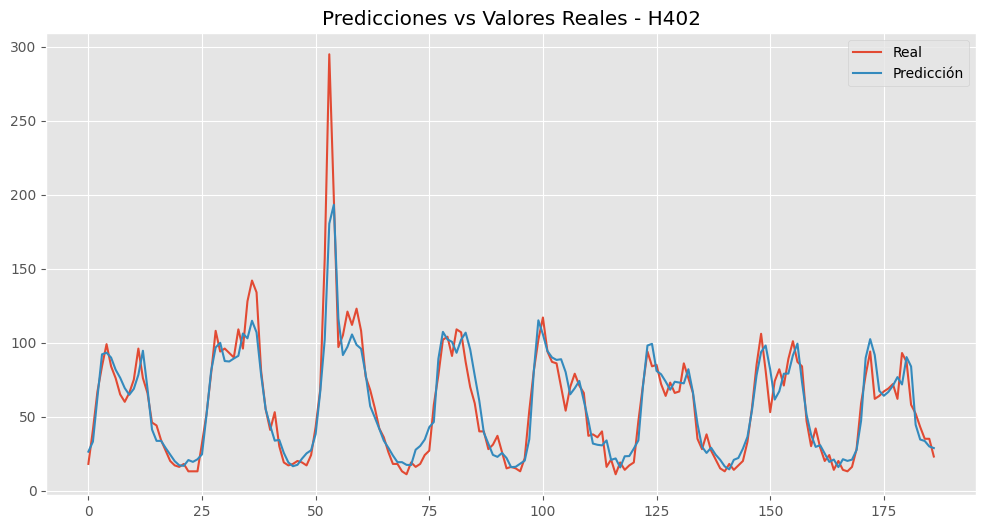

[I 2025-04-05 09:05:19,701] A new study created in memory with name: no-name-2c2c0b8c-6618-468b-914f-b80ca1919b71



Modelo: CNN_LSTM

3. Optimización con Optuna:


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
[I 2025-04-05 09:05:41,788] Trial 0 finished with value: 0.0015819439431652427 and parameters: {'cnn_filters': 62, 'lstm_units': 79, 'learning_rate': 0.0005930759403862997}. Best is trial 0 with value: 0.0015819439431652427.
[I 2025-04-05 09:06:40,605] Trial 1 finished with value: 0.0055959527380764484 and parameters: {'cnn_filters': 49, 'lstm_units': 120, 'learning_rate': 1.2292755931231407e-05}. Best is trial 0 with value: 0.0015819439431652427.
[I 2025-04-05 09:06:56,862] Trial 2 finished with value: 0.004035901743918657 and parameters: {'cnn_filters': 80, 'lstm_units': 61, 'learning_rate': 6.366233675750104e-05}. Best is trial 0 with value: 0.


Mejores hiperparámetros para cnn_lstm:
{'cnn_filters': 62, 'lstm_units': 79, 'learning_rate': 0.0005930759403862997}

Entrenando modelo final...
Epoch 1/200
20/20 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - loss: 0.0287 - val_loss: 0.0126
Epoch 2/200
20/20 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0169 - val_loss: 0.0106
Epoch 3/200
20/20 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0139 - val_loss: 0.0079
Epoch 4/200
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0108 - val_loss: 0.0052
Epoch 5/200
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0063 - val_loss: 0.0044
Epoch 6/200
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - loss: 0.0062 - val_loss: 0.0045
Epoch 7/200
20/20 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0054 - val_loss: 0.0041
Epoch 8/200
20/20 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0037 - val_loss: 0.0043
Epoch 9/200
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - loss: 0.0055 - val_loss: 0.0036
Epoch 10/200
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - loss: 0.0038 - val_loss: 

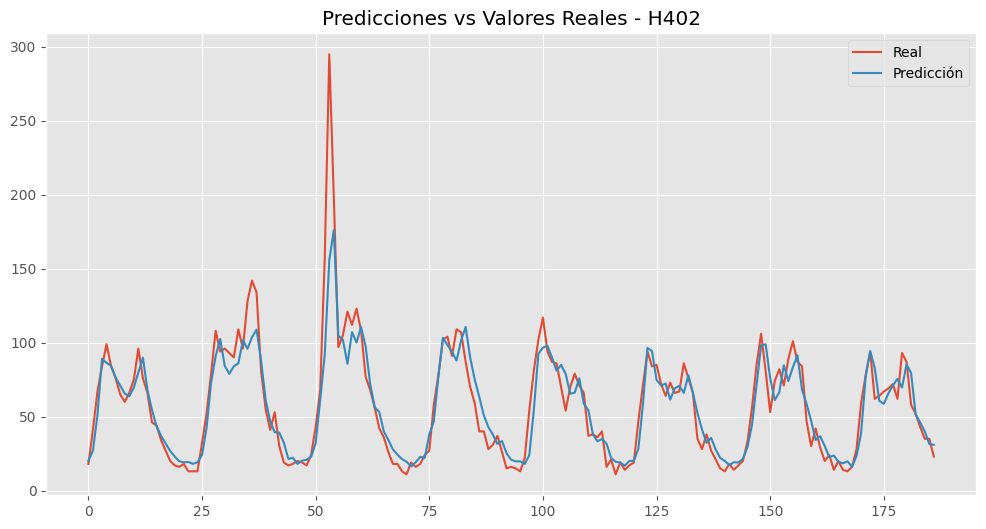


INICIANDO EXPERIMENTO PARA SERIE H44

1. Análisis de datos:


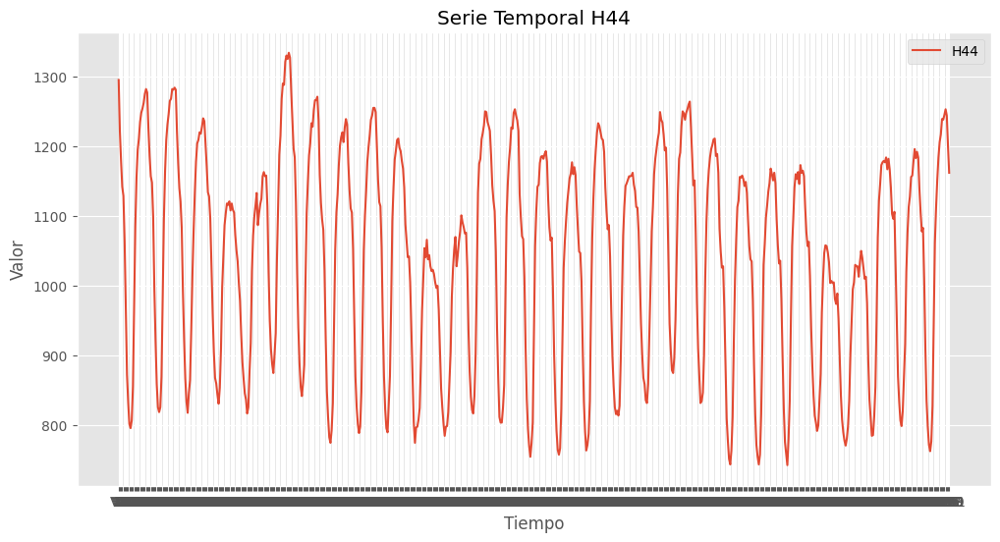

[I 2025-04-05 09:14:45,244] A new study created in memory with name: no-name-295e2a13-54a3-4494-b20b-d7d59f86cf9f



2. División de datos:
Train shape: (459, 24, 1)
Val shape: (81, 24, 1)
Test shape: (135, 24, 1)

Modelo: MLP

3. Optimización con Optuna:


/usr/local/lib/python3.11/dist-packages/keras/src/layers/reshaping/flatten.py:37: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
[I 2025-04-05 09:14:58,443] Trial 0 finished with value: 0.001466493122279644 and parameters: {'n_units': 202, 'dropout_rate': 0.3924433435438657, 'learning_rate': 3.423746605600371e-05}. Best is trial 0 with value: 0.001466493122279644.
[I 2025-04-05 09:15:01,273] Trial 1 finished with value: 0.0018091918900609016 and parameters: {'n_units': 207, 'dropout_rate': 0.32124045255100275, 'learning_rate': 0.00606199644859186}. Best is trial 0 with value: 0.001466493122279644.
[I 2025-04-05 09:15:03,592] Trial 2 finished with value: 0.006706064101308584 and parameters: {'n_units': 41, 'dropout_rate': 0.37276140543102576, 'learning_rate': 0.0022264491085595816}. Best is trial 0 with value: 0.00146649312


Mejores hiperparámetros para mlp:
{'n_units': 137, 'dropout_rate': 0.12521253322588932, 'learning_rate': 0.00024976890139796054}

Entrenando modelo final...
Epoch 1/200
15/15 ━━━━━━━━━━━━━━━━━━━━ 2s 18ms/step - loss: 0.4521 - val_loss: 0.0661
Epoch 2/200
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0724 - val_loss: 0.0528
Epoch 3/200
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0437 - val_loss: 0.0107
Epoch 4/200
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0177 - val_loss: 0.0049
Epoch 5/200
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0161 - val_loss: 0.0051
Epoch 6/200
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0140 - val_loss: 0.0035
Epoch 7/200
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0152 - val_loss: 0.0037
Epoch 8/200
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.0129 - val_loss: 0.0038
Epoch 9/200
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0119 - val_loss: 0.0035
Epoch 10/200
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.0108 - val_

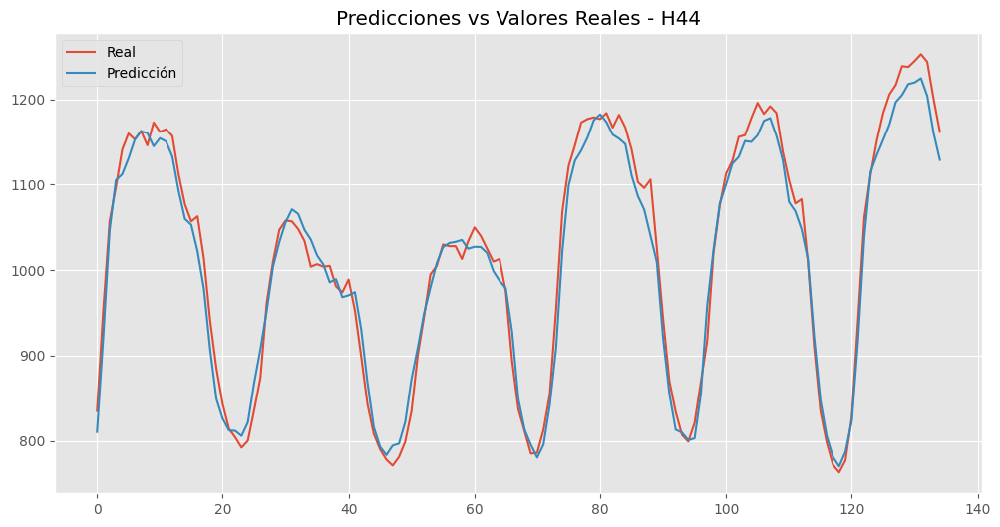

[I 2025-04-05 09:18:25,865] A new study created in memory with name: no-name-457a245c-55b1-45b4-b43c-5e936d895a1d



Modelo: CNN

3. Optimización con Optuna:


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
[I 2025-04-05 09:18:32,143] Trial 0 finished with value: 0.003580222139135003 and parameters: {'filters': 111, 'kernel_size': 2, 'learning_rate': 0.009373114901879734}. Best is trial 0 with value: 0.003580222139135003.
[I 2025-04-05 09:18:36,601] Trial 1 finished with value: 0.0023699605371803045 and parameters: {'filters': 35, 'kernel_size': 4, 'learning_rate': 0.005522366702518459}. Best is trial 1 with value: 0.0023699605371803045.
[I 2025-04-05 09:18:52,863] Trial 2 finished with value: 0.011158684268593788 and parameters: {'filters': 32, 'kernel_size': 2, 'learning_rate': 1.9477121509093874e-05}. Best is trial 1 with value: 0.0023699605371803


Mejores hiperparámetros para cnn:
{'filters': 107, 'kernel_size': 5, 'learning_rate': 0.0003930191587665743}

Entrenando modelo final...
Epoch 1/200
15/15 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.1866 - val_loss: 0.0916
Epoch 2/200
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.0659 - val_loss: 0.0405
Epoch 3/200
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.0380 - val_loss: 0.0213
Epoch 4/200
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.0171 - val_loss: 0.0106
Epoch 5/200
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.0108 - val_loss: 0.0085
Epoch 6/200
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.0091 - val_loss: 0.0060
Epoch 7/200
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.0083 - val_loss: 0.0070
Epoch 8/200
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.0078 - val_loss: 0.0060
Epoch 9/200
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.0065 - val_loss: 0.0035
Epoch 10/200
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.0062 - val_loss: 0.0025
E

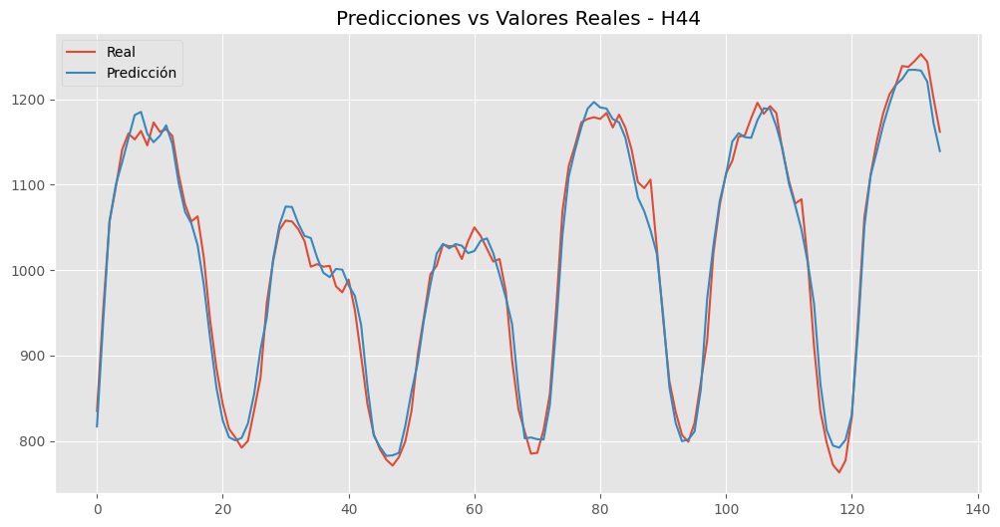

[I 2025-04-05 09:22:25,866] A new study created in memory with name: no-name-cbb9cc0e-adbf-4577-ab8c-fb1fd9e5674f



Modelo: LSTM

3. Optimización con Optuna:


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
[I 2025-04-05 09:22:42,518] Trial 0 finished with value: 0.06476700305938721 and parameters: {'units': 38, 'learning_rate': 2.1836851969372152e-05}. Best is trial 0 with value: 0.06476700305938721.
[I 2025-04-05 09:22:53,999] Trial 1 finished with value: 0.08034392446279526 and parameters: {'units': 119, 'learning_rate': 3.389891673098985e-05}. Best is trial 0 with value: 0.06476700305938721.
[I 2025-04-05 09:23:21,431] Trial 2 finished with value: 0.006703993305563927 and parameters: {'units': 107, 'learning_rate': 9.87473480260995e-05}. Best is trial 2 with value: 0.006703993305563927.
[I 2025-04-05 09:23:34,617] Trial 3 finished with value: 0.0019338916754350066 and parameters: {'units': 37, 'learning_


Mejores hiperparámetros para lstm:
{'units': 90, 'learning_rate': 0.0014862110998374387}

Entrenando modelo final...
Epoch 1/200
15/15 ━━━━━━━━━━━━━━━━━━━━ 3s 53ms/step - loss: 0.1755 - val_loss: 0.0687
Epoch 2/200
15/15 ━━━━━━━━━━━━━━━━━━━━ 1s 34ms/step - loss: 0.0762 - val_loss: 0.0597
Epoch 3/200
15/15 ━━━━━━━━━━━━━━━━━━━━ 1s 33ms/step - loss: 0.0491 - val_loss: 0.0430
Epoch 4/200
15/15 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0408 - val_loss: 0.0379
Epoch 5/200
15/15 ━━━━━━━━━━━━━━━━━━━━ 1s 32ms/step - loss: 0.0284 - val_loss: 0.0174
Epoch 6/200
15/15 ━━━━━━━━━━━━━━━━━━━━ 1s 34ms/step - loss: 0.0139 - val_loss: 0.0113
Epoch 7/200
15/15 ━━━━━━━━━━━━━━━━━━━━ 1s 42ms/step - loss: 0.0101 - val_loss: 0.0081
Epoch 8/200
15/15 ━━━━━━━━━━━━━━━━━━━━ 1s 42ms/step - loss: 0.0096 - val_loss: 0.0073
Epoch 9/200
15/15 ━━━━━━━━━━━━━━━━━━━━ 1s 45ms/step - loss: 0.0087 - val_loss: 0.0058
Epoch 10/200
15/15 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0074 - val_loss: 0.0047
Epoch 11/200
15/15 ━━

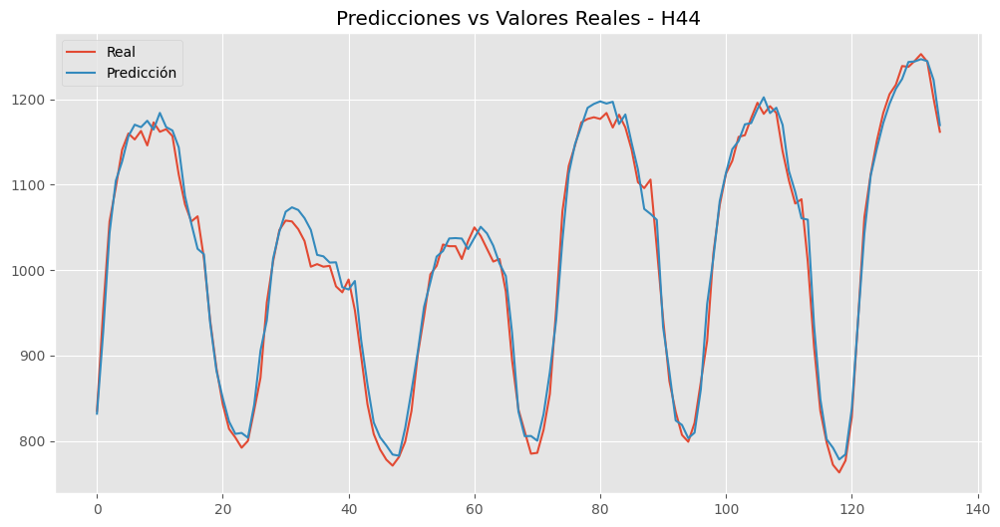

[I 2025-04-05 09:29:14,704] A new study created in memory with name: no-name-985aaff1-783b-4dfc-822d-a9777f4c826c



Modelo: CNN_LSTM

3. Optimización con Optuna:


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
[I 2025-04-05 09:29:29,487] Trial 0 finished with value: 0.0021532790269702673 and parameters: {'cnn_filters': 60, 'lstm_units': 124, 'learning_rate': 0.0036350904077497408}. Best is trial 0 with value: 0.0021532790269702673.
[I 2025-04-05 09:29:41,840] Trial 1 finished with value: 0.00439429422840476 and parameters: {'cnn_filters': 53, 'lstm_units': 36, 'learning_rate': 0.0004774451443466016}. Best is trial 0 with value: 0.0021532790269702673.
[I 2025-04-05 09:29:54,289] Trial 2 finished with value: 0.07696589082479477 and parameters: {'cnn_filters': 48, 'lstm_units': 86, 'learning_rate': 1.427970798943274e-05}. Best is trial 0 with value: 0.0021


Mejores hiperparámetros para cnn_lstm:
{'cnn_filters': 46, 'lstm_units': 58, 'learning_rate': 0.009042247602798523}

Entrenando modelo final...
Epoch 1/200
15/15 ━━━━━━━━━━━━━━━━━━━━ 3s 43ms/step - loss: 0.1071 - val_loss: 0.0411
Epoch 2/200
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0330 - val_loss: 0.0106
Epoch 3/200
15/15 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0089 - val_loss: 0.0078
Epoch 4/200
15/15 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.0064 - val_loss: 0.0109
Epoch 5/200
15/15 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.0066 - val_loss: 0.0054
Epoch 6/200
15/15 ━━━━━━━━━━━━━━━━━━━━ 1s 35ms/step - loss: 0.0052 - val_loss: 0.0059
Epoch 7/200
15/15 ━━━━━━━━━━━━━━━━━━━━ 1s 34ms/step - loss: 0.0041 - val_loss: 0.0046
Epoch 8/200
15/15 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - loss: 0.0035 - val_loss: 0.0040
Epoch 9/200
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.0032 - val_loss: 0.0046
Epoch 10/200
15/15 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.0042 - val_loss: 0

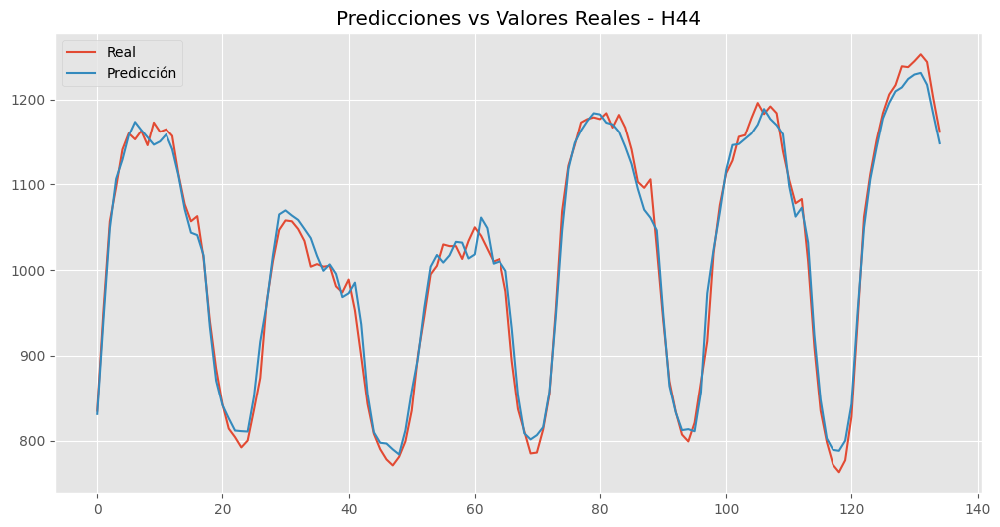

{'H115': {'mlp': {'model': <Sequential name=sequential_104, built=True>,
   'history': <keras.src.callbacks.history.History at 0x7e1e0ddeb310>,
   'metrics': {'mse': 396.64418499000635,
    'mae': 14.602320692274303,
    'mape': 0.038954447681308645},
   'params': {'n_units': 248,
    'dropout_rate': 0.26318772361238263,
    'learning_rate': 0.002500415404010841}},
  'cnn': {'model': <Sequential name=sequential_125, built=True>,
   'history': <keras.src.callbacks.history.History at 0x7e1dffc8f450>,
   'metrics': {'mse': 471.28803315546213,
    'mae': 16.08710530598958,
    'mape': 0.042461669261773895},
   'params': {'filters': 76,
    'kernel_size': 5,
    'learning_rate': 8.628568630803397e-05}},
  'lstm': {'model': <Sequential name=sequential_146, built=True>,
   'history': <keras.src.callbacks.history.History at 0x7e1dfd77a590>,
   'metrics': {'mse': 367.2780577964752,
    'mae': 13.584720526801211,
    'mape': 0.035274349795095576},
   'params': {'units': 86, 'learning_rate': 0.00

In [35]:
solver.run_all_series()